In [7]:
import emcee
import numpy as np
import fitsio
# import glob
import numpy as np
import fitsio as fio
import matplotlib.pyplot as plt
# import galsim
# import astropy.io.fits as fits
# from astropy.table import Table
# import pandas as pd
import matplotlib.pyplot as plt
import proplot as pplt
from os import path
# import astropy.table as astTable
# from astropy.table import Table, vstack
from matplotlib.colors import SymLogNorm, LogNorm

# import treecorr
import os
import scipy
# import gc
from numpy import linalg
import matplotlib

import pickle
from scipy import stats
%matplotlib inline

In [8]:
SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 22

#cmap = sns.color_palette("colorblind")

plt.rc('font', size=BIGGER_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=BIGGER_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

In [9]:
def func(param, pp, nbins, num_of_corr):
    
    n_b = nbins
    gp_theory = np.zeros(shape = (num_of_corr,n_b))
    # i is row, j is column
    for i in range(num_of_corr):
        this_gp = np.zeros(n_b)
        for j in range(num_of_corr):
            this_gp += param[j] * pp[i][j]
        
        gp_theory[i] = this_gp
    
    gp_theory_db = gp_theory.reshape(-1)
    return gp_theory_db
    
def forward_model(param, pg, cov, pp, nbins, num_of_param, num_of_corr):
    n_b = nbins
    gp_theory = np.zeros(shape = (num_of_corr,n_b))

    # i is row, j is column
    for i in range(num_of_corr):
        this_gp = np.zeros(n_b)
        # for j,j_ in enumerate(np.array([1,3,4])): # WHEN SETTING ALPHAS=0
        for j in range(num_of_param): 
            this_gp += param[j] * pp[i][j]
        
        gp_theory[i] = this_gp
    
    gp_theory_db = gp_theory.reshape(-1)
    res=gp_theory_db - pg
    
    #slice is angular scale cut
    slice_ = []
    for i in range(num_of_corr):
        slice_.append(np.arange(0, nbins) + i*nbins)
    slice_ = np.array(slice_).reshape(-1)
    res = res[slice_]
    
    #invert covariance first before calling this function
    #use covariance after scale cut
    slice_ = []
    for i in range(num_of_corr):
        slice_.append(np.arange(0, nbins) + i*1*nbins)
    slice_ = np.array(slice_).reshape(-1)
    # print(slice_)
    new_cov = cov[slice_, :][:, slice_]
    
    cov_inv = np.linalg.inv(new_cov)
    chi2=res.T @ cov_inv @ res
    return chi2

def get_prior(param, num=5):
    if num == 8:
        a,b,a4,b4,eta,eta4,eta24,eta42 = param
        if abs(a)<1 and abs(b)<5 and abs(a4)<1 and abs(b4)<5 and abs(eta)<20 and abs(eta4)<100 and abs(eta24)<100 and abs(eta42)<100:
            return 0
    elif num == 6:
        a,b,a4,b4,eta,eta4 = param
        if abs(a)<1 and abs(b)<5 and abs(a4)<1 and abs(b4)<5 and abs(eta)<20 and abs(eta4)<30:
            return 0
    elif num == 5:
        a,b,a4,b4,eta = param
        if abs(a)<1 and abs(b)<5 and abs(a4)<1 and abs(b4)<5 and abs(eta)<20:
            return 0
    elif num == 4:
        a4,b,b4,eta = param
        if abs(a4)<1 and abs(b)<5 and abs(b4)<5 and abs(eta)<20:
            return 0
    elif num == 3:
        b,b4,eta = param
        if abs(b)<5 and abs(b4)<5 and abs(eta)<20:
            return 0
        # a,b,eta = param
        # if abs(a)<1 and abs(b)<5 and abs(eta)<20:
        #     return 0

    return -np.inf

def log_prob(param, pg, cov_inv, pp, nbins, num_of_param, num_of_corr):
    lp = get_prior(param, num=num_of_param)
    if not np.isfinite(lp):
        return -np.inf

    loss = forward_model(param, pg, cov_inv, pp, nbins, num_of_param, num_of_corr)
    return -0.5 * loss + lp


def construct_param_matrix(param, num_of_corr, nbins, parametrize=True):

    if parametrize: 
        res = np.zeros(shape=(num_of_corr*nbins, num_of_corr*num_of_corr*nbins))

        basic_block = np.zeros(shape=(nbins, num_of_corr*nbins))
        for i in range(num_of_corr):
            basic_block[0:nbins, i * nbins : (i + 1) * nbins] = np.diag([param[i]] * nbins)

        for i in range(num_of_corr):
            res[i * nbins : (i + 1) * nbins, i*num_of_corr*nbins : (i + 1)*num_of_corr*nbins] = basic_block
    else:
        res = np.ones(shape=(num_of_corr*nbins, num_of_corr*num_of_corr*nbins))

    return res

def forward_model_ppcov(param, pg, cov, pp, pp_joint_cov, nbins, num_of_corr):
    
    def compute_logdet(cov, m):
        arr = [m for i in range(len(cov))]
        m = np.diag(arr)
        cov_ = m * cov
        sign,det = np.linalg.slogdet(cov_)
        denom = np.sum(np.log(arr))
        return det/denom
    
    n_b = nbins
    gp_theory = np.zeros(shape = (num_of_corr,n_b))
    
    # include pp cov
    param_matrix = construct_param_matrix(param, num_of_corr, nbins)
    pp_cov = np.zeros(shape=(num_of_corr*nbins, num_of_corr*nbins))
    pp_cov[0:num_of_corr*nbins, 0:num_of_corr*nbins] = (param_matrix @ pp_joint_cov) @ param_matrix.T


    # i is row, j is column
    for i in range(num_of_corr):
        this_gp = np.zeros(n_b)
        for j in range(num_of_corr):
            this_gp += param[j] * pp[i][j]
        
        gp_theory[i] = this_gp
    
    
    gp_theory_db = gp_theory.reshape(-1)
    # gp_theory_db = np.concatenate([gp_theory.reshape(-1), np.array([e1gal_theory, e2gal_theory])])
    res=gp_theory_db - pg
    
    #slice is angular scale cut
    slice_ = []
    for i in range(num_of_corr):
        slice_.append(np.arange(0, nbins) + i*nbins)
    slice_ = np.array(slice_).reshape(-1)
    # slice_ = np.concatenate([slice_, np.array([128,129])])
    
    res = res[slice_]
    new_cov = (cov + pp_cov)[slice_,:][:,slice_]
    cov_inv = np.linalg.inv(new_cov)
    # logdet = compute_logdet(new_cov, 1e12)
    
    #invert covariance first before calling this function
    #use covariance after scale cut
    chi2=res.dot(cov_inv).dot(res)
    return chi2 # + logdet

def log_prob_ppcov(param, pg, cov, pp, pp_joint_cov, nbins, num_of_corr):
    lp = get_prior(param, num=num_of_corr)
    if not np.isfinite(lp):
        return -np.inf
    loss = forward_model_ppcov(param, pg, cov, pp, pp_joint_cov, nbins, num_of_corr)
    return -0.5 * loss + lp

In [12]:
def run_chi2min(y, ycov, x, nbins, num_of_param=5, num_of_corr=5, scale_cut=0, slice_skip=1, xcov=None, sim=False):
    
    if xcov is not None:
        best_fit = scipy.optimize.minimize(forward_model_ppcov, 
                                           x0=np.zeros(num_of_param), 
                                           method='Nelder-Mead',
                                           args=(y, ycov, x, xcov, nbins, num_of_param))
    else:
        if sim:
            best_fit = scipy.optimize.minimize(forward_model, 
                                               x0=np.zeros(num_of_param), 
                                               method='Nelder-Mead',
                                               args=(y, ycov, x, nbins, num_of_param, num_of_corr))
        else:
            best_fit = scipy.optimize.minimize(forward_model, 
                                               x0=np.zeros(num_of_param), 
                                               method='Nelder-Mead',
                                               args=(y, ycov, x, nbins, num_of_param, num_of_corr))
    print(best_fit, best_fit.fun, best_fit.x)
    return best_fit.x
    

def run_mcmc(params, y, ycov, x, nbins, chain_name, xcov=None, num_of_param=5, num_of_corr=5, scale_cut=0, slice_skip=1, zero_alpha=False):
    
    nwalkers=50
    pos = params + np.random.randn(nwalkers, num_of_param)*0.1

    if xcov is not None:
        sampler = emcee.EnsembleSampler(nwalkers, num_of_param, log_prob_ppcov, args=(y, ycov, x, xcov, nbins, num_of_param))
    else:
        sampler = emcee.EnsembleSampler(nwalkers, num_of_param, log_prob, args=(y, ycov, x, nbins, num_of_param, num_of_corr))

    # print(pos)
    state = sampler.run_mcmc(pos, 100000)
    flatchain=sampler.get_chain(discard=4000, thin=25, flat=True)
    # np.savetxt(chain_name, flatchain)

    mean_params = np.mean(flatchain,axis = 0)

    from IPython.display import display, Math
    if num_of_param == 8:
        labels = [r'$\alpha$', r'$\beta$', r'$\alpha^4$', r'$\beta^4$', r'$\eta$', r'$\eta^4$', r'$\eta^{24}$', r'$\eta^{42}$']
    elif num_of_param == 6:
        labels = [r'$\alpha$', r'$\beta$', r'$\alpha^4$', r'$\beta^4$', r'$\eta$', r'$\eta^4$']
    elif num_of_param == 5:
        labels = [r'$\alpha$', r'$\beta$', r'$\alpha^4$', r'$\beta^4$', r'$\eta$']
    elif num_of_param == 4:
        labels = [r'$\beta$', r'$\alpha^4$', r'$\beta^4$', r'$\eta$']
    else:
        labels = [r'$\alpha$', r'$\beta$', r'$\eta$']
    
    for i in range(num_of_param):
        mcmc = np.percentile(flatchain[:, i], [16, 50, 84])
        q = np.diff(mcmc)
        txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
        txt = txt.format(mcmc[1], q[0], q[1], labels[i])
        display(Math(txt))
        
    return flatchain,mean_params

def run_model_fit(pth, chain_name, num_of_param, num_of_corr, nbins=32, scale_cut=0, ppcov=True, sim=False, set_alpha=False):
    
    with open(os.path.join(pth, "full_correlation_psf.pkl"), "rb") as f:
        (   r,
            gp_corr,
            pp_corr,
            psf_const1,
            psf_const2,
            egal_mean,
            pp_corr_cov,
            pp_joint_cov,
            gp_corr_cov
        ) = pickle.load(f)
    
    scale_cut = scale_cut
    r_ = r[scale_cut:]
    slice_skip = 1

    if sim:
        # Make covariance from mock data
        sims = os.path.join(pth, 'sims')
        nsims = 500
        obs = np.zeros((nsims, nbins*num_of_corr))
        for i in range(nsims):
            with open(os.path.join(sims, 'full_correlation_psf_'+str(i+1)+'.pkl'), 'rb') as f:
                gp_all = pickle.load(f)
                gp_full = gp_all[1]
            if set_alpha:
                obs[i, 0:nbins*num_of_corr] = np.concatenate((gp_full[1,:], gp_full[2,:], gp_full[3,:], gp_full[4,:]))
            else:
                if num_of_corr == 8:
                    obs[i, 0:nbins*num_of_corr] = np.concatenate((gp_full[0,:], gp_full[1,:], gp_full[2,:], gp_full[3,:], gp_full[4,:], gp_full[5,:], gp_full[6,:], gp_full[7,:]))
                elif num_of_corr == 6:
                    obs[i, 0:nbins*num_of_corr] = np.concatenate((gp_full[0,:], gp_full[1,:], gp_full[2,:], gp_full[3,:], gp_full[4,:], gp_full[5,:]))
                elif num_of_corr == 5:
                    obs[i, 0:nbins*num_of_corr] = np.concatenate((gp_full[0,:], gp_full[1,:], gp_full[2,:], gp_full[3,:], gp_full[4,:]))
                elif num_of_corr == 3:
                    obs[i, 0:nbins*num_of_corr] = np.concatenate((gp_full[0,:], gp_full[1,:], gp_full[4,:]))
        B=(nsims-nbins*num_of_param-2)/((nsims-nbins*num_of_param-1)*(nsims-nbins*num_of_param-4))
        f_hartlap = (nsims-1)*(1+B*(nbins*num_of_param-num_of_param))/(nsims-nbins*num_of_param+num_of_param-1)
        # f_hartlap = (200 - 1)/(200 - nbins*num_of_corr - 2)
        print('hartlap factor is ', f_hartlap)
        gp_corr_cov = np.cov(obs.T) * f_hartlap
        # np.savetxt(outpath + "gp_covariance_psf_sims.txt", gp_corr_cov)
    else:
        gp_corr_cov = np.loadtxt(outpath + "gp_covariance_psf.txt")
        
    if num_of_corr == 8:
        gp = gp_corr[0, :]
        gq = gp_corr[1, :]
        gp4 = gp_corr[2, :] 
        gq4 = gp_corr[3, :]
        gw = gp_corr[4, :]
        gw4 = gp_corr[5, :]
        gs = gp_corr[6, :]
        gt = gp_corr[7, :]
        tau_data = [gp, gq, gp4, gq4, gw, gw4, gs, gt, gp_corr_cov, r_]
    elif num_of_corr == 6:
        gp = gp_corr[0, :]
        gq = gp_corr[1, :]
        gp4 = gp_corr[2, :] 
        gq4 = gp_corr[3, :]
        gw = gp_corr[4, :]
        gw4 = gp_corr[5, :]
        tau_data = [gp, gq, gp4, gq4, gw, gw4, gp_corr_cov, r_]
    elif num_of_corr == 5:
        gp = gp_corr[0, :]
        gq = gp_corr[1, :]
        gp4 = gp_corr[2, :] 
        gq4 = gp_corr[3, :]
        gw = gp_corr[4, :]
        tau_data = [gp, gq, gp4, gq4, gw, gp_corr_cov, r_]
    elif num_of_corr == 4:
        if set_alpha:
            gq = gp_corr[1, :]
            gp4 = gp_corr[2, :]
            gq4 = gp_corr[3, :]
            gw = gp_corr[4, :]
            tau_data = [gq, gp4, gq4, gw, gp_corr_cov, r_]
        else:
            gp = gp_corr[0, :]
            gq = gp_corr[1, :]
            gw = gp_corr[4, :]
            tau_data = [gp, gq, gw, gp_corr_cov, r_]
    
    # model fit begins (first, chi2 minimization)
    if num_of_corr == 8:
        observe_dv = np.concatenate((gp, gq, gp4, gq4, gw, gw4, gs, gt))
        idx = np.arange(num_of_corr)
    elif num_of_corr == 6:
        observe_dv = np.concatenate((gp, gq, gp4, gq4, gw, gw4))
        idx = np.arange(num_of_corr)
    elif num_of_corr == 5:
        observe_dv = np.concatenate((gp, gq, gp4, gq4, gw))
        idx = np.arange(num_of_corr)
    elif num_of_corr == 4:
        if set_alpha:
            observe_dv = np.concatenate((gq, gp4, gq4, gw))
            idx = np.array([1, 2, 3, 4])
        else:
            observe_dv = np.concatenate((gp, gq, gw))
            idx = np.array([0, 1, 4])
    pp_corr_dv = np.zeros((num_of_corr, num_of_corr, nbins)) 
    for i,i_ in enumerate(idx):
        for j,j_ in enumerate(idx):
            pp_corr_dv[i][j] = pp_corr[i_][j_]
    
    if ppcov:
        opt_params = run_chi2min(observe_dv, gp_corr_cov, pp_corr_dv, nbins, xcov=pp_joint_cov, num_of_param=num_of_param, sim=True)
        chain,mean_params = run_mcmc(opt_params, observe_dv, gp_corr_cov, pp_corr_dv, nbins, pth+chain_name, num_of_param=num_of_param, xcov=pp_joint_cov, zero_alpha=set_alpha)
    else:
        opt_params = run_chi2min(observe_dv, gp_corr_cov, pp_corr_dv, nbins, num_of_param=num_of_param, num_of_corr=num_of_corr, sim=True)
        chain,mean_params = run_mcmc(opt_params, observe_dv, gp_corr_cov, pp_corr_dv, nbins, pth+chain_name, num_of_param=num_of_param, num_of_corr=num_of_corr, xcov=None, zero_alpha=set_alpha)

        
    df = (num_of_corr*nbins) - num_of_param
    if ppcov:
        chi2 = forward_model_ppcov(mean_params, observe_dv, gp_corr_cov, pp_corr_dv, pp_joint_cov, nbins, num_of_corr)
    else:
        chi2 = forward_model(mean_params, observe_dv, gp_corr_cov, pp_corr_dv, nbins, num_of_param, num_of_corr)
    p_value = 1 - stats.chi2.cdf(chi2 , df)
    print(df, chi2, chi2/df)
    print(p_value)

    
    bestfit_list = []
    for i in idx:
        this_gp = np.zeros(nbins)
        for j,j_ in enumerate(idx):
            this_gp += mean_params[j] * pp_corr[i][j_] 

        bestfit_list.append(this_gp)

    bestfit_dv = np.array(bestfit_list)
    
    return chain, bestfit_dv, tau_data


## Run correlations

# Model fit for 8 parameters with 8 bins with cosmogrid sims (full scale)

In [13]:
outpath = "/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v5b_paper/rho_tau_stats/final_fiducial_8params_8bins_cosmogrid_091123/"
set_alpha = False
chain, dv, tau_data = run_model_fit(outpath, "flatchain_simgp.txt", 8, 8, nbins=8, sim=True, ppcov=False, set_alpha=set_alpha)

hartlap factor is  1.2720913851242592
 final_simplex: (array([[ 5.75435362e-03,  1.62800265e+00,  2.52196045e-02,
         2.23183158e+00, -6.91201417e+00,  2.88766694e+00,
        -1.64146846e+00,  5.04695216e+00],
       [ 5.75113792e-03,  1.62775917e+00,  2.52456574e-02,
         2.23188358e+00, -6.91318607e+00,  2.88790822e+00,
        -1.64077597e+00,  5.04843008e+00],
       [ 5.76223641e-03,  1.62866361e+00,  2.52343476e-02,
         2.23194537e+00, -6.91335823e+00,  2.88784827e+00,
        -1.64138520e+00,  5.04721439e+00],
       [ 5.76547290e-03,  1.62822267e+00,  2.52452576e-02,
         2.23193897e+00, -6.91457325e+00,  2.88806060e+00,
        -1.64040809e+00,  5.04900334e+00],
       [ 5.76457648e-03,  1.62829448e+00,  2.51918318e-02,
         2.23148827e+00, -6.91130380e+00,  2.88717368e+00,
        -1.64134578e+00,  5.04565417e+00],
       [ 5.77204730e-03,  1.62814684e+00,  2.51881501e-02,
         2.23167743e+00, -6.91401775e+00,  2.88771930e+00,
        -1.64008213e+0

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

56 65.94285719463406 1.1775510213327511
0.17074984842586682


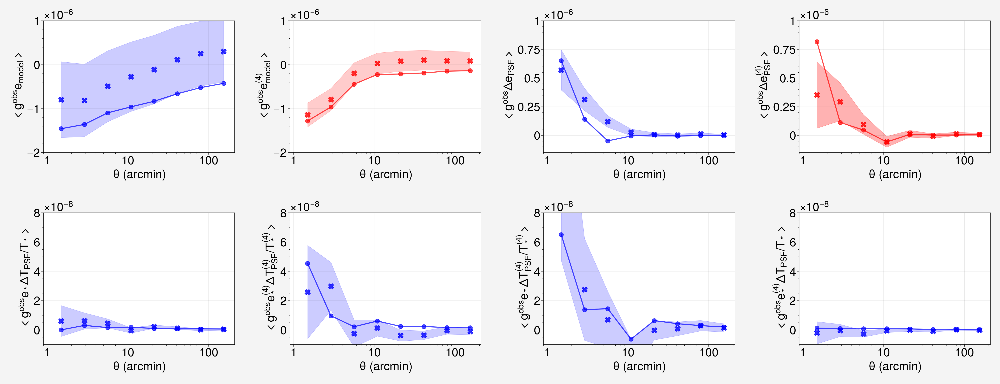

In [8]:
six_param_model = r'($\alpha, \beta, \alpha^{(4)}, \beta^{(4)}, \eta, \eta^{(4)}$) model'

matplotlib.rcParams.update({'font.size': 36, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = pplt.subplots(nrows=2,ncols=4,figsize = (26,10), sharex=False, sharey=False)

nbins = 8
gp = tau_data[0]
gq = tau_data[1]
gp4 = tau_data[2]
gq4 = tau_data[3]
gw = tau_data[4]
gw4 = tau_data[5]
gs = tau_data[6]
gt = tau_data[7]
gp_corr_cov = tau_data[8]
r = tau_data[9]


# leakage errors
gp_err = np.sqrt(np.diag(gp_corr_cov)[:nbins])
gp4_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[0,0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'blue' )
ax[0,0].fill_between(r , gp - gp_err, gp + gp_err, color = 'blue' , alpha = 0.2)
ax[0,0].plot(r, dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[0,0].set_xlim([0.9,210])
ax[0,0].set_ylim(-2e-6, 1e-6)
ax[0,0].set_xscale('log')
ax[0,0].set_xlabel(r'$\theta$ (arcmin)')
ax[0,0].set_ylabel(r'$<g^{obs} e_{\rm model}>$')
# ax[0,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


ax[0,1].plot(r, gp4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{psf}>$' , color = 'red')
ax[0,1].fill_between(r, gp4 - gp4_err, gp4 + gp4_err,color = 'red' , alpha = 0.2)
ax[0,1].plot(r, dv[2], 'o-', linewidth = 2, alpha = 0.7, label = six_param_model, color = 'red')
ax[0,1].set_xlim([0.9,210])
ax[0,1].set_ylim(-2e-6, 1e-6)
# ax[0].set_title('leakage')
ax[0,1].set_xscale('log')
ax[0,1].set_xlabel(r'$\theta$ (arcmin)')
ax[0,1].set_ylabel(r'$<g^{\rm obs} e^{(4)}_{\rm model}>$')
# ax[1,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])
gq4_err = np.sqrt(np.diag(gp_corr_cov)[3*nbins:4*nbins])

ax[0,2].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'blue')
ax[0,2].fill_between(r , gq - gq_err, gq + gq_err, color = 'blue' , alpha = 0.2)
ax[0,2].plot(r, dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[0,2].set_xlim([0.9,210])
ax[0,2].set_ylim(-1.5e-7, 1e-6)
ax[0,2].set_xscale('log')
ax[0,2].set_xlabel(r'$\theta$ (arcmin)')
ax[0,2].set_ylabel(r'$<g^{\rm obs} \Delta e_{\rm PSF}>$')
# ax[0,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[0,3].plot(r, gq4, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$' , color = 'red')
ax[0,3].fill_between(r, gq4 - gq4_err, gq4 + gq4_err,color = 'red' , alpha = 0.3)
ax[0,3].plot(r, dv[3], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'red')
ax[0,3].set_xlim([0.9,210])
ax[0,3].set_ylim(-1.5e-7, 1e-6)
ax[0,3].set_xscale('log')
ax[0,3].set_xlabel(r'$\theta$ (arcmin)')
ax[0,3].set_ylabel(r'$<g^{\rm obs} \Delta e^{(4)}_{\rm PSF}>$')
# ax[1,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# size errors
gw_err = np.sqrt(np.diag(gp_corr_cov)[4*nbins:5*nbins])
gw4_err = np.sqrt(np.diag(gp_corr_cov)[5*nbins:6*nbins])

ax[1,0].plot(r, gw, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{\rm psf}*\Delta T_{\rm psf}/T_{\rm psf}>$' , color = 'blue' )
ax[1,0].fill_between(r , gw - gw_err, gw + gw_err, color = 'blue' , alpha = 0.2)
ax[1,0].plot(r, dv[4], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[1,0].set_xlim([0.9,210])
ax[1,0].set_ylim(-1e-8, 8e-8)
ax[1,0].set_xscale('log')
ax[1,0].set_xlabel(r'$\theta$ (arcmin)')
ax[1,0].set_ylabel(r'$<g^{\rm obs} e_{\rm *}\Delta T_{\rm PSF}/T_{\rm *}>$')
# ax[0,2].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[1,1].plot(r, gw4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{\rm psf}*\Delta T_{\rm psf}/T_{\rm psf}>$' , color = 'blue' )
ax[1,1].fill_between(r , gw4 - gw4_err, gw4 + gw4_err, color = 'blue' , alpha = 0.2)
ax[1,1].plot(r, dv[5], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[1,1].set_xlim([0.9,210])
ax[1,1].set_ylim(-1e-8, 8e-8)
ax[1,1].set_xscale('log')
ax[1,1].set_xlabel(r'$\theta$ (arcmin)')
ax[1,1].set_ylabel(r'$<g^{\rm obs} e^{(4)}_{\rm *}\Delta T^{(4)}_{\rm PSF}/T^{(4)}_{\rm *}>$')

gs_err = np.sqrt(np.diag(gp_corr_cov)[6*nbins:7*nbins])
gt_err = np.sqrt(np.diag(gp_corr_cov)[7*nbins:8*nbins])

ax[1,2].plot(r, gs, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{\rm psf}*\Delta T_{\rm psf}/T_{\rm psf}>$' , color = 'blue' )
ax[1,2].fill_between(r , gs - gs_err, gs + gs_err, color = 'blue' , alpha = 0.2)
ax[1,2].plot(r, dv[6], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[1,2].set_xlim([0.9,210])
ax[1,2].set_ylim(-1e-8, 8e-8)
ax[1,2].set_xscale('log')
ax[1,2].set_xlabel(r'$\theta$ (arcmin)')
ax[1,2].set_ylabel(r'$<g^{\rm obs} e_{\rm *}\Delta T^{(4)}_{\rm PSF}/T^{(4)}_{\rm *}>$')
# ax[0,2].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[1,3].plot(r, gt, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{\rm psf}*\Delta T_{\rm psf}/T_{\rm psf}>$' , color = 'blue' )
ax[1,3].fill_between(r , gt - gt_err, gt + gt_err, color = 'blue' , alpha = 0.2)
ax[1,3].plot(r, dv[7], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[1,3].set_xlim([0.9,210])
ax[1,3].set_ylim(-1e-8, 8e-8)
ax[1,3].set_xscale('log')
ax[1,3].set_xlabel(r'$\theta$ (arcmin)')
ax[1,3].set_ylabel(r'$<g^{\rm obs} e^{(4)}_{\rm *}\Delta T_{\rm PSF}/T_{\rm *}>$')

plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_paper/psf_systematics_bestfitxip_model_simgp_updated.pdf', bbox_inches='tight', dpi=150)

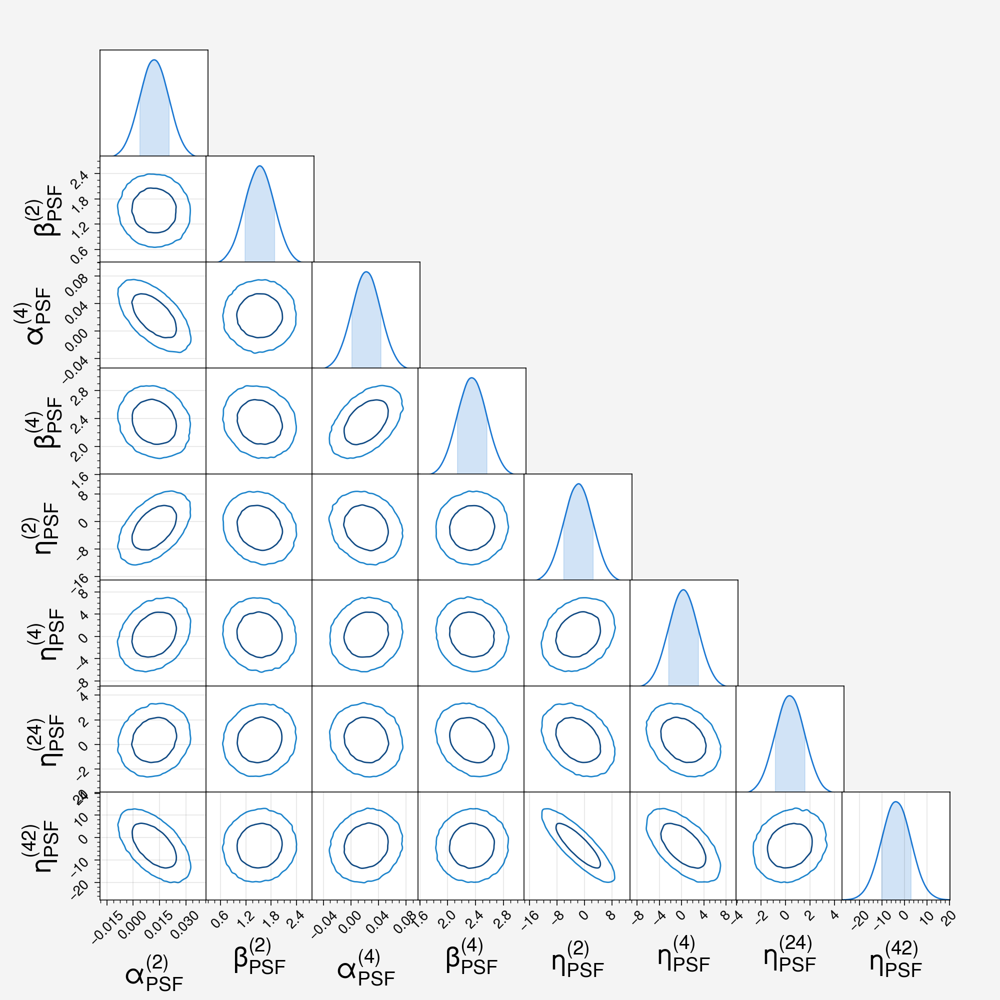

In [9]:
from chainconsumer import ChainConsumer
c  = ChainConsumer()
c.add_chain(chain, parameters=[r'$\alpha^{(2)}_\mathrm{PSF}$',r'$\beta^{(2)}_\mathrm{PSF}$',r'$\alpha^{(4)}_\mathrm{PSF}$',r'$\beta^{(4)}_\mathrm{PSF}$','$\eta^{(2)}_\mathrm{PSF}$', '$\eta^{(4)}_\mathrm{PSF}$', '$\eta^{(24)}_\mathrm{PSF}$', '$\eta^{(42)}_\mathrm{PSF}$'],kde=0., shade=False, color='blue', plot_point=False,)
c.configure(global_point=True,statistics='mean',label_font_size=20,)

plt.close()
fig = c.plotter.plot(figsize="PAGE")
stat=c.analysis.get_summary()

fig.subplots_adjust(wspace=-0.02,hspace=-0.02)
plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_paper/mcmc_posteriors_simgp_updated.pdf', bbox_inches='tight', dpi=100)
# gc.collect()

# Model fit for 8 parameters with 8 bins (<20arcmin)

In [5]:
outpath = "/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v5b/rho_tau_stats/median_galaxy_color/fiducial_8params_8bins_20arcmin_081123/"
set_alpha = False
chain, dv, tau_data = run_model_fit(outpath, "flatchain_simgp.txt", 8, 8, nbins=8, sim=True, ppcov=False, set_alpha=set_alpha)

hartlap factor is  1.9776145291296805
 final_simplex: (array([[ 0.0160155 ,  0.84780045,  0.0294956 ,  2.49799777, -1.1401972 ,
        -0.45126274, -2.45325515,  0.75875006],
       [ 0.01601435,  0.84776353,  0.02949798,  2.49803826, -1.14020237,
        -0.45126075, -2.453308  ,  0.75880611],
       [ 0.01601476,  0.8478557 ,  0.02949278,  2.49799025, -1.1402047 ,
        -0.4512729 , -2.45323201,  0.75869827],
       [ 0.01601767,  0.84780822,  0.02949041,  2.49799969, -1.14020389,
        -0.45126272, -2.45325455,  0.75874691],
       [ 0.01601625,  0.84775525,  0.02949172,  2.49804792, -1.14020812,
        -0.45125828, -2.45331945,  0.75882239],
       [ 0.01601555,  0.8477889 ,  0.0294878 ,  2.49797233, -1.14018573,
        -0.45125614, -2.45322923,  0.75874874],
       [ 0.01601664,  0.84787742,  0.02949548,  2.49802833, -1.14022689,
        -0.45128126, -2.45326805,  0.75870077],
       [ 0.01601444,  0.84781642,  0.02950031,  2.49806799, -1.14022461,
        -0.4512752 , -2.4

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

56 55.38712308035846 0.9890557692921152
0.4980130019719339


Text(0, 0.5, '$<\\hat{e}_{gal} e_{\\rm psf}*\\Delta T^{(4)}_{\\rm psf}/T^{(4)}_{\\rm psf}>$')

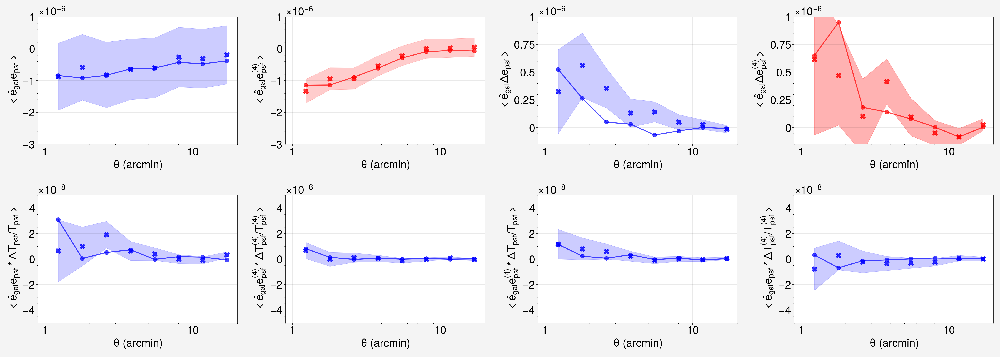

In [8]:
six_param_model = r'($\alpha, \beta, \alpha^{(4)}, \beta^{(4)}, \eta, \eta^{(4)}$) model'

matplotlib.rcParams.update({'font.size': 26, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = pplt.subplots(nrows=2,ncols=4,figsize = (28,10), sharex=False, sharey=False)

nbins = 8
gp = tau_data[0]
gq = tau_data[1]
gp4 = tau_data[2]
gq4 = tau_data[3]
gw = tau_data[4]
gw4 = tau_data[5]
gs = tau_data[6]
gt = tau_data[7]
gp_corr_cov = tau_data[8]
r = tau_data[9]


# leakage errors
gp_err = np.sqrt(np.diag(gp_corr_cov)[:nbins])
gp4_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[0,0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'blue' )
ax[0,0].fill_between(r , gp - gp_err, gp + gp_err, color = 'blue' , alpha = 0.2)
ax[0,0].plot(r, dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[0,0].set_xlim([0.9,20])
ax[0,0].set_ylim(-3e-6, 1e-6)
ax[0,0].set_xscale('log')
ax[0,0].set_xlabel(r'$\theta$ (arcmin)')
ax[0,0].set_ylabel(r'$<\hat{e}_{gal} e_{psf}>$')
# ax[0,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


ax[0,1].plot(r, gp4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{psf}>$' , color = 'red')
ax[0,1].fill_between(r, gp4 - gp4_err, gp4 + gp4_err,color = 'red' , alpha = 0.2)
ax[0,1].plot(r, dv[2], 'o-', linewidth = 2, alpha = 0.7, label = six_param_model, color = 'red')
ax[0,1].set_xlim([0.9,20])
ax[0,1].set_ylim(-3e-6, 1e-6)
# ax[0].set_title('leakage')
ax[0,1].set_xscale('log')
ax[0,1].set_xlabel(r'$\theta$ (arcmin)')
ax[0,1].set_ylabel(r'$<\hat{e}_{gal} e^{(4)}_{psf}>$')
# ax[1,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])
gq4_err = np.sqrt(np.diag(gp_corr_cov)[3*nbins:4*nbins])

ax[0,2].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'blue')
ax[0,2].fill_between(r , gq - gq_err, gq + gq_err, color = 'blue' , alpha = 0.2)
ax[0,2].plot(r, dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[0,2].set_xlim([0.9,20])
ax[0,2].set_ylim(-1.5e-7, 1e-6)
ax[0,2].set_xscale('log')
ax[0,2].set_xlabel(r'$\theta$ (arcmin)')
ax[0,2].set_ylabel(r'$<\hat{e}_{gal} \Delta e_{psf}>$')
# ax[0,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[0,3].plot(r, gq4, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$' , color = 'red')
ax[0,3].fill_between(r, gq4 - gq4_err, gq4 + gq4_err,color = 'red' , alpha = 0.3)
ax[0,3].plot(r, dv[3], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'red')
ax[0,3].set_xlim([0.9,20])
ax[0,3].set_ylim(-1.5e-7, 1e-6)
ax[0,3].set_xscale('log')
ax[0,3].set_xlabel(r'$\theta$ (arcmin)')
ax[0,3].set_ylabel(r'$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$')
# ax[1,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# size errors
gw_err = np.sqrt(np.diag(gp_corr_cov)[4*nbins:5*nbins])
gw4_err = np.sqrt(np.diag(gp_corr_cov)[5*nbins:6*nbins])

ax[1,0].plot(r, gw, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{\rm psf}*\Delta T_{\rm psf}/T_{\rm psf}>$' , color = 'blue' )
ax[1,0].fill_between(r , gw - gw_err, gw + gw_err, color = 'blue' , alpha = 0.2)
ax[1,0].plot(r, dv[4], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[1,0].set_xlim([0.9,20])
ax[1,0].set_ylim(-0.5e-7, 0.5e-7)
ax[1,0].set_xscale('log')
ax[1,0].set_xlabel(r'$\theta$ (arcmin)')
ax[1,0].set_ylabel(r'$<\hat{e}_{gal} e_{psf}*\Delta T_{\rm psf}/T_{\rm psf}>$')
# ax[0,2].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[1,1].plot(r, gw4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{\rm psf}*\Delta T_{\rm psf}/T_{\rm psf}>$' , color = 'blue' )
ax[1,1].fill_between(r , gw4 - gw4_err, gw4 + gw4_err, color = 'blue' , alpha = 0.2)
ax[1,1].plot(r, dv[5], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[1,1].set_xlim([0.9,20])
ax[1,1].set_ylim(-0.5e-7, 0.5e-7)
ax[1,1].set_xscale('log')
ax[1,1].set_xlabel(r'$\theta$ (arcmin)')
ax[1,1].set_ylabel(r'$<\hat{e}_{gal} e^{(4)}_{\rm psf}*\Delta T^{(4)}_{\rm psf}/T^{(4)}_{\rm psf}>$')

gs_err = np.sqrt(np.diag(gp_corr_cov)[6*nbins:7*nbins])
gt_err = np.sqrt(np.diag(gp_corr_cov)[7*nbins:8*nbins])

ax[1,2].plot(r, gs, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{\rm psf}*\Delta T_{\rm psf}/T_{\rm psf}>$' , color = 'blue' )
ax[1,2].fill_between(r , gs - gs_err, gs + gs_err, color = 'blue' , alpha = 0.2)
ax[1,2].plot(r, dv[6], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[1,2].set_xlim([0.9,20])
ax[1,2].set_ylim(-0.5e-7, 0.5e-7)
ax[1,2].set_xscale('log')
ax[1,2].set_xlabel(r'$\theta$ (arcmin)')
ax[1,2].set_ylabel(r'$<\hat{e}_{gal} e^{(4)}_{psf}*\Delta T_{\rm psf}/T_{\rm psf}>$')
# ax[0,2].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[1,3].plot(r, gt, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{\rm psf}*\Delta T_{\rm psf}/T_{\rm psf}>$' , color = 'blue' )
ax[1,3].fill_between(r , gt - gt_err, gt + gt_err, color = 'blue' , alpha = 0.2)
ax[1,3].plot(r, dv[7], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[1,3].set_xlim([0.9,20])
ax[1,3].set_ylim(-0.5e-7, 0.5e-7)
ax[1,3].set_xscale('log')
ax[1,3].set_xlabel(r'$\theta$ (arcmin)')
ax[1,3].set_ylabel(r'$<\hat{e}_{gal} e_{\rm psf}*\Delta T^{(4)}_{\rm psf}/T^{(4)}_{\rm psf}>$')

# plt.savefig(outpath + 'psf_systematics_bestfitxip_model_simgp.png', bbox_inches='tight')

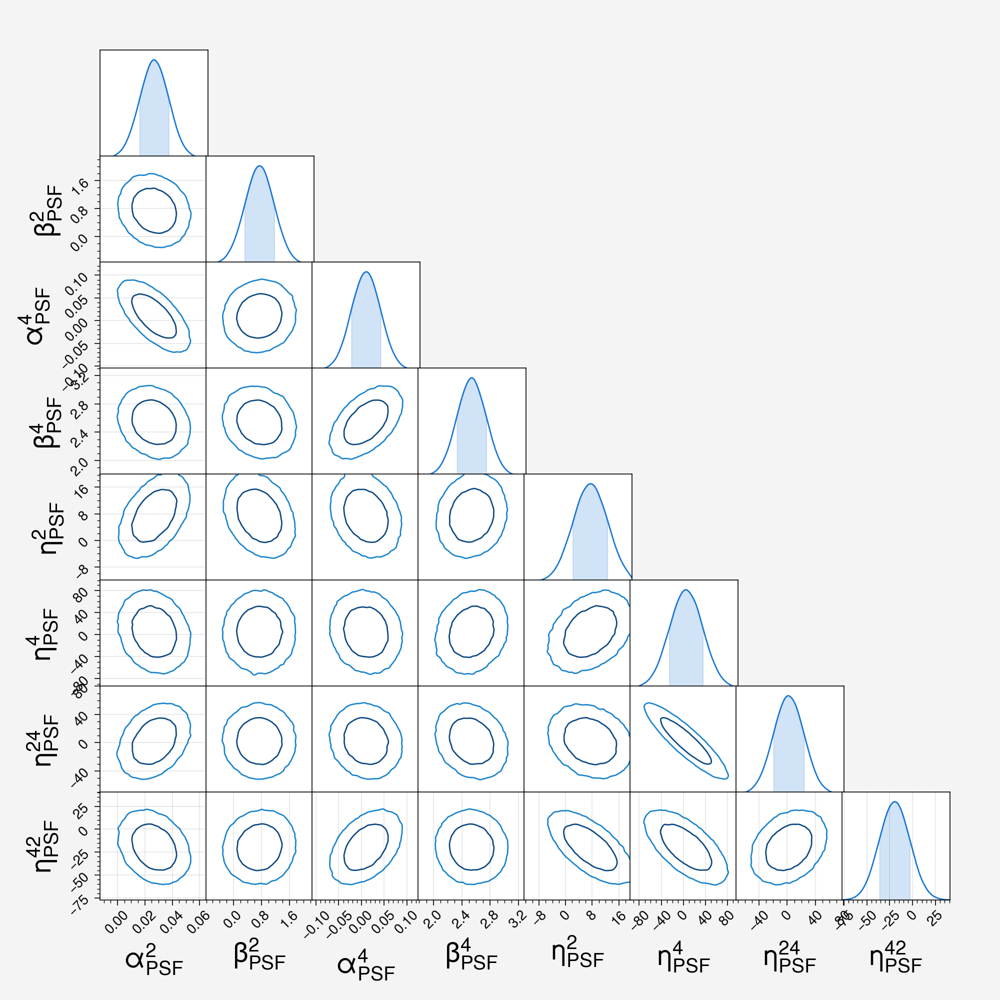

In [7]:
from chainconsumer import ChainConsumer
c  = ChainConsumer()
c.add_chain(chain, parameters=[r'$\alpha^2_\mathrm{PSF}$',r'$\beta^2_\mathrm{PSF}$',r'$\alpha^4_\mathrm{PSF}$',r'$\beta^4_\mathrm{PSF}$','$\eta^2_\mathrm{PSF}$', '$\eta^4_\mathrm{PSF}$', '$\eta^{24}_\mathrm{PSF}$', '$\eta^{42}_\mathrm{PSF}$'],kde=0., shade=False, color='blue', plot_point=False,)
c.configure(global_point=True,statistics='mean',label_font_size=20,)

plt.close()
fig = c.plotter.plot(figsize="PAGE")
stat=c.analysis.get_summary()

fig.subplots_adjust(wspace=-0.02,hspace=-0.02)
# plt.savefig(outpath + 'mcmc_posteriors_simgp+ppcov.png', bbox_inches='tight')
# gc.collect()

# Model fit for 8 parameters with 8 bins

In [33]:
outpath = "/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v5b/rho_tau_stats/median_galaxy_color/fiducial_8params_8bins_080423/"
set_alpha = False
chain, dv, tau_data = run_model_fit(outpath, "flatchain_simgp.txt", 8, 8, nbins=8, sim=True, ppcov=False, set_alpha=set_alpha)

hartlap factor is  1.9776145291296805
 final_simplex: (array([[ 0.01215469,  1.2987611 ,  0.0439787 ,  2.4753728 ,  0.53596506,
        -1.44391134,  0.31479958, -3.689223  ],
       [ 0.01215496,  1.29875324,  0.04397748,  2.47538074,  0.53597405,
        -1.44386426,  0.31475976, -3.6892006 ],
       [ 0.01215477,  1.29874867,  0.04397698,  2.47537125,  0.53596656,
        -1.44394881,  0.31483165, -3.68923478],
       [ 0.01215485,  1.29874158,  0.04397735,  2.47537409,  0.53597567,
        -1.44385676,  0.31475626, -3.6891846 ],
       [ 0.01215461,  1.29876152,  0.04397878,  2.47537343,  0.53596202,
        -1.44396509,  0.31484286, -3.68925261],
       [ 0.01215463,  1.29874542,  0.04397892,  2.47539068,  0.53597853,
        -1.44390606,  0.31479002, -3.68922843],
       [ 0.01215433,  1.29877575,  0.04397869,  2.47537534,  0.53595663,
        -1.44398417,  0.31485734, -3.68927143],
       [ 0.01215466,  1.29873983,  0.0439798 ,  2.47538746,  0.53598171,
        -1.44386203,  0.3

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

56 43.30013992109343 0.7732167843052399
0.8926426716012648


Text(0, 0.5, '$<\\hat{e}_{gal} e_{\\rm psf}*\\Delta T^{(4)}_{\\rm psf}/T^{(4)}_{\\rm psf}>$')

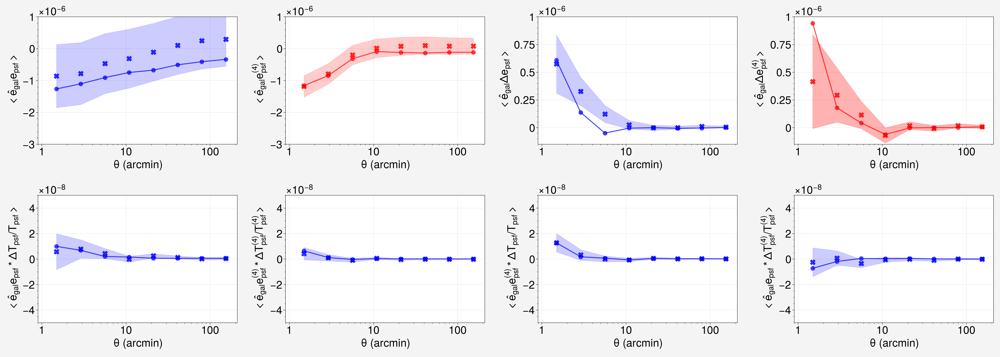

In [34]:
six_param_model = r'($\alpha, \beta, \alpha^{(4)}, \beta^{(4)}, \eta, \eta^{(4)}$) model'

matplotlib.rcParams.update({'font.size': 26, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = pplt.subplots(nrows=2,ncols=4,figsize = (28,10), sharex=False, sharey=False)

nbins = 8
gp = tau_data[0]
gq = tau_data[1]
gp4 = tau_data[2]
gq4 = tau_data[3]
gw = tau_data[4]
gw4 = tau_data[5]
gs = tau_data[6]
gt = tau_data[7]
gp_corr_cov = tau_data[8]
r = tau_data[9]


# leakage errors
gp_err = np.sqrt(np.diag(gp_corr_cov)[:nbins])
gp4_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[0,0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'blue' )
ax[0,0].fill_between(r , gp - gp_err, gp + gp_err, color = 'blue' , alpha = 0.2)
ax[0,0].plot(r, dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[0,0].set_xlim([0.9,210])
ax[0,0].set_ylim(-3e-6, 1e-6)
ax[0,0].set_xscale('log')
ax[0,0].set_xlabel(r'$\theta$ (arcmin)')
ax[0,0].set_ylabel(r'$<\hat{e}_{gal} e_{psf}>$')
# ax[0,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


ax[0,1].plot(r, gp4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{psf}>$' , color = 'red')
ax[0,1].fill_between(r, gp4 - gp4_err, gp4 + gp4_err,color = 'red' , alpha = 0.2)
ax[0,1].plot(r, dv[2], 'o-', linewidth = 2, alpha = 0.7, label = six_param_model, color = 'red')
ax[0,1].set_xlim([0.9,210])
ax[0,1].set_ylim(-3e-6, 1e-6)
# ax[0].set_title('leakage')
ax[0,1].set_xscale('log')
ax[0,1].set_xlabel(r'$\theta$ (arcmin)')
ax[0,1].set_ylabel(r'$<\hat{e}_{gal} e^{(4)}_{psf}>$')
# ax[1,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])
gq4_err = np.sqrt(np.diag(gp_corr_cov)[3*nbins:4*nbins])

ax[0,2].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'blue')
ax[0,2].fill_between(r , gq - gq_err, gq + gq_err, color = 'blue' , alpha = 0.2)
ax[0,2].plot(r, dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[0,2].set_xlim([0.9,210])
ax[0,2].set_ylim(-1.5e-7, 1e-6)
ax[0,2].set_xscale('log')
ax[0,2].set_xlabel(r'$\theta$ (arcmin)')
ax[0,2].set_ylabel(r'$<\hat{e}_{gal} \Delta e_{psf}>$')
# ax[0,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[0,3].plot(r, gq4, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$' , color = 'red')
ax[0,3].fill_between(r, gq4 - gq4_err, gq4 + gq4_err,color = 'red' , alpha = 0.3)
ax[0,3].plot(r, dv[3], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'red')
ax[0,3].set_xlim([0.9,210])
ax[0,3].set_ylim(-1.5e-7, 1e-6)
ax[0,3].set_xscale('log')
ax[0,3].set_xlabel(r'$\theta$ (arcmin)')
ax[0,3].set_ylabel(r'$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$')
# ax[1,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# size errors
gw_err = np.sqrt(np.diag(gp_corr_cov)[4*nbins:5*nbins])
gw4_err = np.sqrt(np.diag(gp_corr_cov)[5*nbins:6*nbins])

ax[1,0].plot(r, gw, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{\rm psf}*\Delta T_{\rm psf}/T_{\rm psf}>$' , color = 'blue' )
ax[1,0].fill_between(r , gw - gw_err, gw + gw_err, color = 'blue' , alpha = 0.2)
ax[1,0].plot(r, dv[4], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[1,0].set_xlim([0.9,210])
ax[1,0].set_ylim(-0.5e-7, 0.5e-7)
ax[1,0].set_xscale('log')
ax[1,0].set_xlabel(r'$\theta$ (arcmin)')
ax[1,0].set_ylabel(r'$<\hat{e}_{gal} e_{psf}*\Delta T_{\rm psf}/T_{\rm psf}>$')
# ax[0,2].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[1,1].plot(r, gw4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{\rm psf}*\Delta T_{\rm psf}/T_{\rm psf}>$' , color = 'blue' )
ax[1,1].fill_between(r , gw4 - gw4_err, gw4 + gw4_err, color = 'blue' , alpha = 0.2)
ax[1,1].plot(r, dv[5], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[1,1].set_xlim([0.9,210])
ax[1,1].set_ylim(-0.5e-7, 0.5e-7)
ax[1,1].set_xscale('log')
ax[1,1].set_xlabel(r'$\theta$ (arcmin)')
ax[1,1].set_ylabel(r'$<\hat{e}_{gal} e^{(4)}_{\rm psf}*\Delta T^{(4)}_{\rm psf}/T^{(4)}_{\rm psf}>$')

gs_err = np.sqrt(np.diag(gp_corr_cov)[6*nbins:7*nbins])
gt_err = np.sqrt(np.diag(gp_corr_cov)[7*nbins:8*nbins])

ax[1,2].plot(r, gs, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{\rm psf}*\Delta T_{\rm psf}/T_{\rm psf}>$' , color = 'blue' )
ax[1,2].fill_between(r , gs - gs_err, gs + gs_err, color = 'blue' , alpha = 0.2)
ax[1,2].plot(r, dv[6], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[1,2].set_xlim([0.9,210])
ax[1,2].set_ylim(-0.5e-7, 0.5e-7)
ax[1,2].set_xscale('log')
ax[1,2].set_xlabel(r'$\theta$ (arcmin)')
ax[1,2].set_ylabel(r'$<\hat{e}_{gal} e^{(4)}_{psf}*\Delta T_{\rm psf}/T_{\rm psf}>$')
# ax[0,2].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[1,3].plot(r, gt, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{\rm psf}*\Delta T_{\rm psf}/T_{\rm psf}>$' , color = 'blue' )
ax[1,3].fill_between(r , gt - gt_err, gt + gt_err, color = 'blue' , alpha = 0.2)
ax[1,3].plot(r, dv[7], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[1,3].set_xlim([0.9,210])
ax[1,3].set_ylim(-0.5e-7, 0.5e-7)
ax[1,3].set_xscale('log')
ax[1,3].set_xlabel(r'$\theta$ (arcmin)')
ax[1,3].set_ylabel(r'$<\hat{e}_{gal} e_{\rm psf}*\Delta T^{(4)}_{\rm psf}/T^{(4)}_{\rm psf}>$')

# plt.savefig(outpath + 'psf_systematics_bestfitxip_model_simgp.png', bbox_inches='tight')

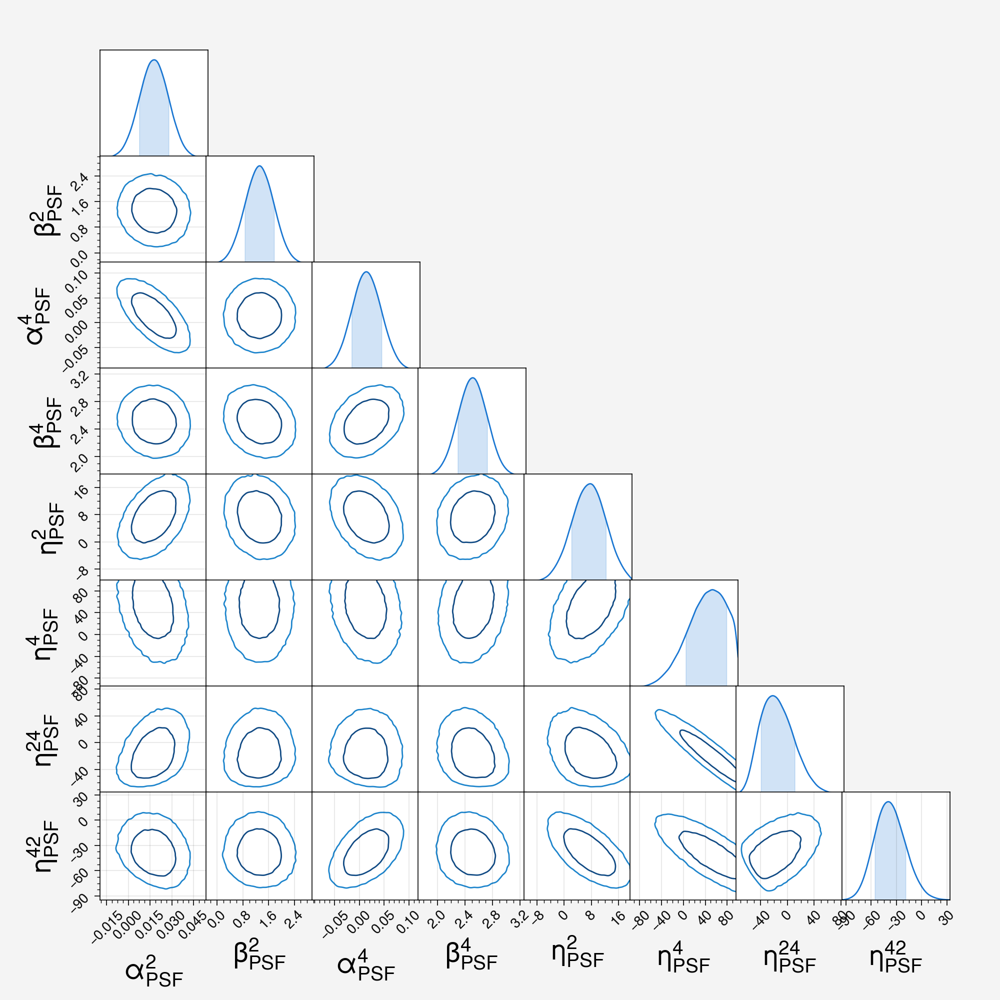

In [35]:
from chainconsumer import ChainConsumer
c  = ChainConsumer()
c.add_chain(chain, parameters=[r'$\alpha^2_\mathrm{PSF}$',r'$\beta^2_\mathrm{PSF}$',r'$\alpha^4_\mathrm{PSF}$',r'$\beta^4_\mathrm{PSF}$','$\eta^2_\mathrm{PSF}$', '$\eta^4_\mathrm{PSF}$', '$\eta^{24}_\mathrm{PSF}$', '$\eta^{42}_\mathrm{PSF}$'],kde=0., shade=False, color='blue', plot_point=False,)
c.configure(global_point=True,statistics='mean',label_font_size=20,)

plt.close()
fig = c.plotter.plot(figsize="PAGE")
stat=c.analysis.get_summary()

fig.subplots_adjust(wspace=-0.02,hspace=-0.02)
# plt.savefig(outpath + 'mcmc_posteriors_simgp+ppcov.png', bbox_inches='tight')
# gc.collect()

# Model fit with 3 parameters with 16 bins

In [80]:
outpath = "/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v5b/rho_tau_stats/median_galaxy_color/fiducial_3params_8bins_080123/"
set_alpha = False
chain, dv, tau_data = run_model_fit(outpath, "flatchain_simgp.txt", 3, nbins=8, sim=True, ppcov=False, set_alpha=set_alpha)

hartlap factor is  1.2536948001045205
 final_simplex: (array([[-0.00693695,  1.37885595, -0.2134254 ],
       [-0.00693698,  1.37888547, -0.21336907],
       [-0.00693755,  1.37891586, -0.21351217],
       [-0.00693664,  1.37891689, -0.21340932]]), array([26.24948883, 26.24948885, 26.24948885, 26.24948885]))
           fun: 26.24948883454756
       message: 'Optimization terminated successfully.'
          nfev: 292
           nit: 166
        status: 0
       success: True
             x: array([-0.00693695,  1.37885595, -0.2134254 ]) 26.24948883454756 [-0.00693695  1.37885595 -0.2134254 ]


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

21 26.250283412938742 1.2500134958542257
0.19706606994253129


Text(0, 0.5, '$<\\hat{e}_{gal} e_{psf}*\\Delta T_{\\rm psf}>$')

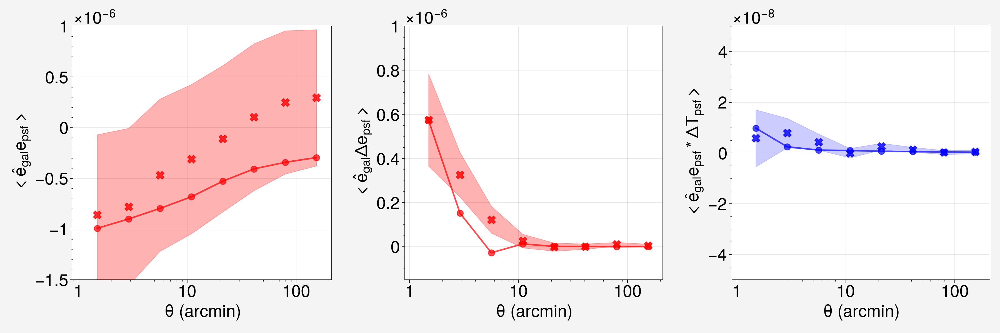

In [82]:

if set_alpha:
    ylabels = [r'$<\hat{e}_{gal} \Delta e_{psf}>$', r'$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$', r'$<\hat{e}_{gal} e_{psf}*\Delta T_{\rm psf}>$']
else:
    ylabels = [r'$<\hat{e}_{gal} e_{psf}>$', r'$<\hat{e}_{gal} \Delta e_{psf}>$', r'$<\hat{e}_{gal} e_{psf}*\Delta T_{\rm psf}>$']
    
matplotlib.rcParams.update({'font.size': 26, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = pplt.subplots(nrows=1,ncols=3,figsize = (18,6), sharex=False, sharey=False)

nbins = 8
gq = tau_data[0]
gq4 = tau_data[1]
gw = tau_data[2]
gp_corr_cov = tau_data[3]
r = tau_data[4]


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[0:nbins])
gq4_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])

ax[0].plot(r, gq, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'red')
ax[0].fill_between(r, gq - gq_err, gq + gq_err, color = 'red' , alpha = 0.3)
ax[0].plot(r, dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'red')
ax[0].set_xlim([0.9,210])
ax[0].set_ylim(-1.5e-6, 1e-6)
ax[0].set_xscale('log')
ax[0].set_xlabel(r'$\theta$ (arcmin)')
ax[0].set_ylabel(ylabels[0])

ax[1].plot(r, gq4, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$' , color = 'red')
ax[1].fill_between(r, gq4 - gq4_err, gq4 + gq4_err,color = 'red' , alpha = 0.3)
ax[1].plot(r, dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'red')
ax[1].set_xlim([0.9,210])
ax[1].set_ylim(-1.5e-7, 1e-6)
ax[1].set_xscale('log')
ax[1].set_xlabel(r'$\theta$ (arcmin)')
ax[1].set_ylabel(ylabels[1])
# ax[1,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# leakage errors
gw_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[2].plot(r, gw, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{\rm psf}*\Delta T_{\rm psf}>$' , color = 'blue' )
ax[2].fill_between(r , gw - gw_err, gw + gw_err, color = 'blue' , alpha = 0.2)
ax[2].plot(r, dv[2], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[2].set_xlim([0.9,210])
ax[2].set_ylim(-0.5e-7, 0.5e-7)
ax[2].set_xscale('log')
ax[2].set_xlabel(r'$\theta$ (arcmin)')
ax[2].set_ylabel(ylabels[2])
# ax[0,2].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# plt.savefig(outpath + 'psf_systematics_bestfitxip_model_simgp+ppcov.png', bbox_inches='tight')

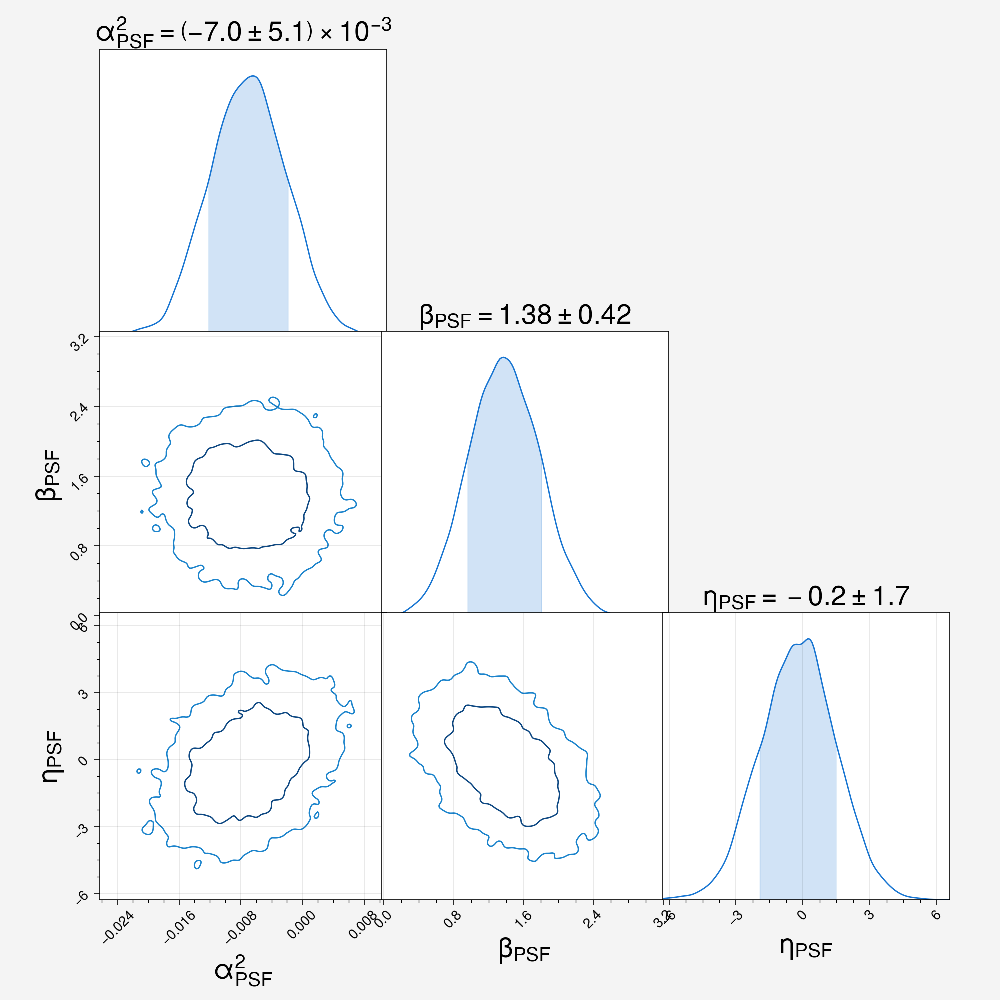

In [83]:
from chainconsumer import ChainConsumer
c  = ChainConsumer()
if set_alpha:
    param_labels = [r'$\beta^2_\mathrm{PSF}$',r'$\beta^4_\mathrm{PSF}$','$\eta_\mathrm{PSF}$']
else:
    param_labels = [r'$\alpha^2_\mathrm{PSF}$',r'$\beta_\mathrm{PSF}$','$\eta_\mathrm{PSF}$']
c.add_chain(chain, parameters=param_labels, kde=0., shade=False, color='blue', plot_point=False,)
c.configure(global_point=True,statistics='mean',label_font_size=20,)

plt.close()
fig = c.plotter.plot(figsize="PAGE")
stat=c.analysis.get_summary()

fig.subplots_adjust(wspace=-0.02,hspace=-0.02)
# plt.savefig(outpath + 'mcmc_posteriors_simgp.png', bbox_inches='tight')
# gc.collect()

# Model fit with 5 parameters with 8 bins and alphas=0 (08/01/2023)

In [142]:
outpath = "/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v5b/rho_tau_stats/median_galaxy_color/fiducial_5params_8bins_073123/"
set_alpha = False
chain, dv, tau_data = run_model_fit(outpath, "flatchain_simgp_3param5corr.txt", 3, 5, nbins=8, sim=True, ppcov=False, set_alpha=set_alpha)

hartlap factor is  1.2536948001045205
 final_simplex: (array([[ 1.38826188,  2.10093772, -3.53439408],
       [ 1.38827654,  2.10094036, -3.53446852],
       [ 1.38825652,  2.10094985, -3.53434975],
       [ 1.38827991,  2.10093914, -3.53440847]]), array([68.61075466, 68.61075466, 68.61075466, 68.61075466]))
           fun: 68.61075465657547
       message: 'Optimization terminated successfully.'
          nfev: 389
           nit: 216
        status: 0
       success: True
             x: array([ 1.38826188,  2.10093772, -3.53439408]) 68.61075465657547 [ 1.38826188  2.10093772 -3.53439408]


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

37 68.6113638169744 1.8543611842425514
0.001209463583217496


IndexError: index 3 is out of bounds for axis 0 with size 3

In [ ]:
if set_alpha:
    ylabels = [r'$<\hat{e}_{gal} \Delta e_{psf}>$', r'$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$', r'$<\hat{e}_{gal} e_{psf}*\Delta T_{\rm psf}>$']
else:
    ylabels = [r'$<\hat{e}_{gal} e_{psf}>$', r'$<\hat{e}_{gal} \Delta e_{psf}>$', r'$<\hat{e}_{gal} e_{psf}*\Delta T_{\rm psf}>$']
    
matplotlib.rcParams.update({'font.size': 26, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = pplt.subplots(nrows=1,ncols=3,figsize = (18,6), sharex=False, sharey=False)

nbins = 8
gq = tau_data[0]
gq4 = tau_data[1]
gw = tau_data[2]
gp_corr_cov = tau_data[3]
r = tau_data[4]


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[0:nbins])
gq4_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])

ax[0].plot(r, gq, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'red')
ax[0].fill_between(r, gq - gq_err, gq + gq_err, color = 'red' , alpha = 0.3)
ax[0].plot(r, dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'red')
ax[0].set_xlim([0.9,210])
ax[0].set_ylim(-1.5e-6, 1e-6)
ax[0].set_xscale('log')
ax[0].set_xlabel(r'$\theta$ (arcmin)')
ax[0].set_ylabel(ylabels[0])

ax[1].plot(r, gq4, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$' , color = 'red')
ax[1].fill_between(r, gq4 - gq4_err, gq4 + gq4_err,color = 'red' , alpha = 0.3)
ax[1].plot(r, dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'red')
ax[1].set_xlim([0.9,210])
ax[1].set_ylim(-1.5e-7, 1e-6)
ax[1].set_xscale('log')
ax[1].set_xlabel(r'$\theta$ (arcmin)')
ax[1].set_ylabel(ylabels[1])
# ax[1,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# leakage errors
gw_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[2].plot(r, gw, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{\rm psf}*\Delta T_{\rm psf}/T_{\rm psf}>$' , color = 'blue' )
ax[2].fill_between(r , gw - gw_err, gw + gw_err, color = 'blue' , alpha = 0.2)
ax[2].plot(r, dv[2], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[2].set_xlim([0.9,210])
ax[2].set_ylim(-0.5e-7, 0.5e-7)
ax[2].set_xscale('log')
ax[2].set_xlabel(r'$\theta$ (arcmin)')
ax[2].set_ylabel(ylabels[2])
# ax[0,2].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# plt.savefig(outpath + 'psf_systematics_bestfitxip_model_simgp+ppcov.png', bbox_inches='tight')

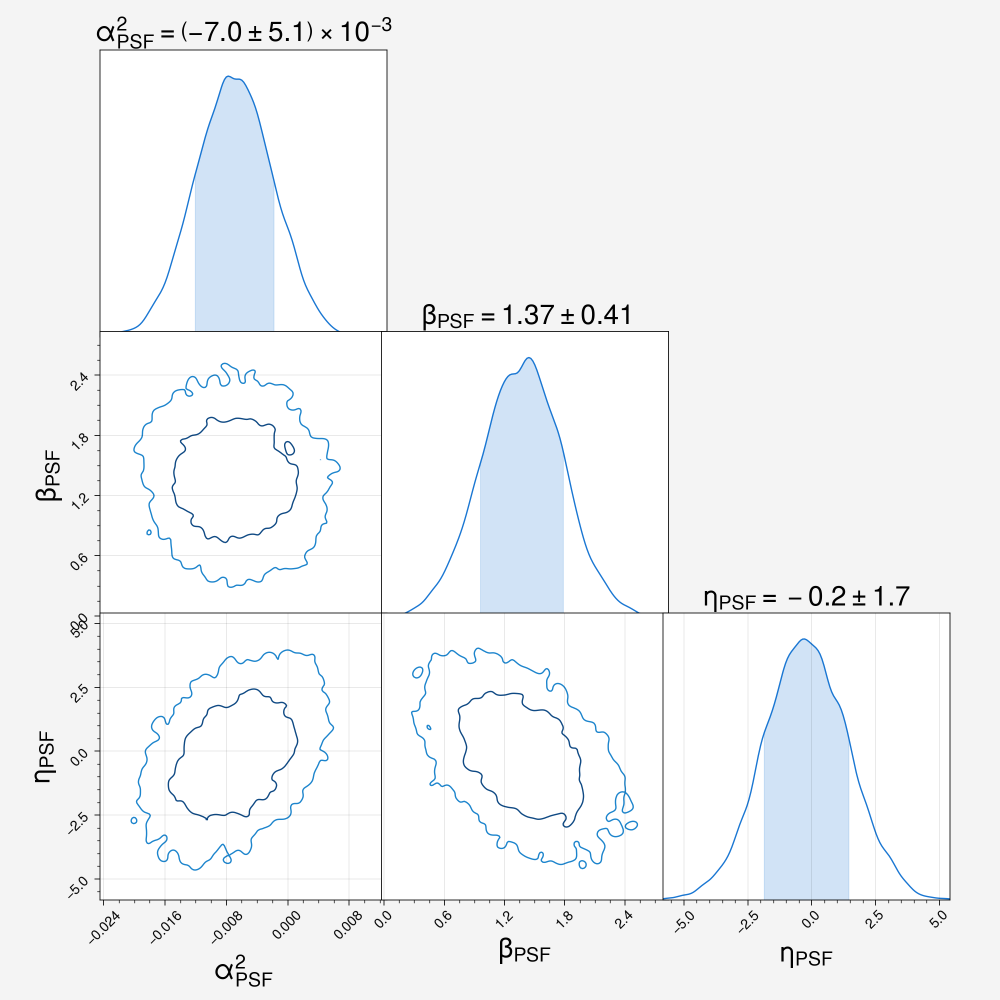

In [102]:
from chainconsumer import ChainConsumer
c  = ChainConsumer()
if set_alpha:
    param_labels = [r'$\beta^2_\mathrm{PSF}$',r'$\beta^4_\mathrm{PSF}$','$\eta_\mathrm{PSF}$']
else:
    param_labels = [r'$\alpha^2_\mathrm{PSF}$',r'$\beta_\mathrm{PSF}$','$\eta_\mathrm{PSF}$']
c.add_chain(chain, parameters=param_labels, kde=0., shade=False, color='blue', plot_point=False,)
c.configure(global_point=True,statistics='mean',label_font_size=20,)

plt.close()
fig = c.plotter.plot(figsize="PAGE", contour_labels='sigma')
stat=c.analysis.get_summary()

fig.subplots_adjust(wspace=-0.02,hspace=-0.02)
# plt.savefig(outpath + 'mcmc_posteriors_simgp.png', bbox_inches='tight')
# gc.collect()

# Model fit with 5 parameters with 8 bins (08/01/2023)

In [148]:
outpath = "/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v5b/rho_tau_stats/median_galaxy_color/fiducial_5params_8bins_073123/"
chain, dv, tau_data = run_model_fit(outpath, "flatchain_simgp_.txt", 5, 5, nbins=8, sim=True, ppcov=False)

hartlap factor is  1.4839428927670988
 final_simplex: (array([[ 0.00793828,  1.22103508,  0.0501349 ,  2.4800739 , -1.37096608],
       [ 0.00793843,  1.22101723,  0.05013457,  2.48007582, -1.37099031],
       [ 0.00793868,  1.22100712,  0.05013405,  2.48007191, -1.37086647],
       [ 0.00793832,  1.22102688,  0.05013391,  2.48006643, -1.37099551],
       [ 0.00793875,  1.22102509,  0.050134  ,  2.48007509, -1.37092266],
       [ 0.00793839,  1.22101574,  0.05013527,  2.48007177, -1.37099685]]), array([42.04018588, 42.04018589, 42.04018589, 42.04018589, 42.04018589,
       42.04018589]))
           fun: 42.04018588469218
       message: 'Optimization terminated successfully.'
          nfev: 913
           nit: 561
        status: 0
       success: True
             x: array([ 0.00793828,  1.22103508,  0.0501349 ,  2.4800739 , -1.37096608]) 42.04018588469218 [ 0.00793828  1.22103508  0.0501349   2.4800739  -1.37096608]


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

35 42.041901063579616 1.2011971732451319
0.19226551333874176


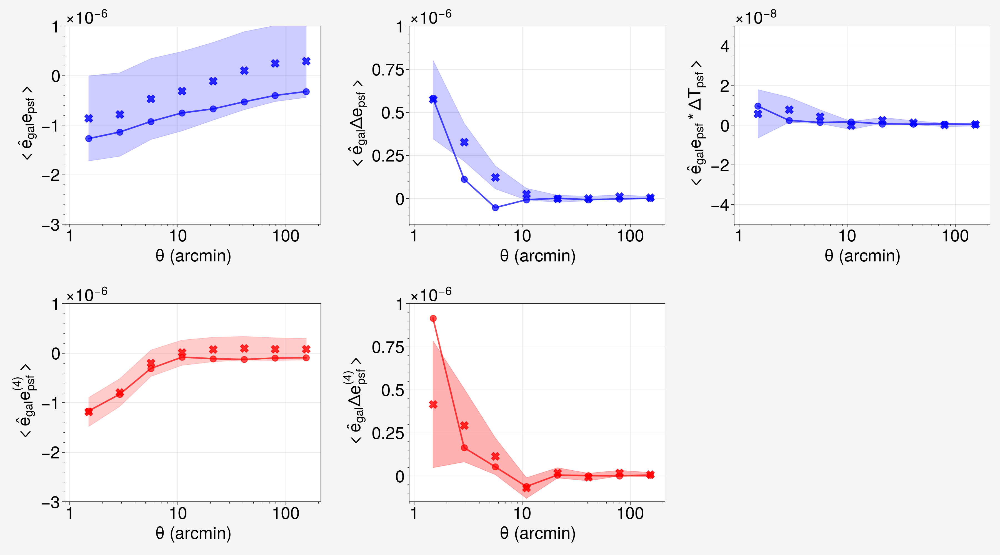

In [149]:
five_param_model = r'($\alpha, \beta, \alpha^{(4)}, \beta^{(4)}, \eta$) model'

matplotlib.rcParams.update({'font.size': 26, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = pplt.subplots(nrows=2,ncols=3,figsize = (18,10), sharex=False, sharey=False)

nbins = 8
gp = tau_data[0]
gq = tau_data[1]
gp4 = tau_data[2]
gq4 = tau_data[3]
gw = tau_data[4]
gp_corr_cov = tau_data[5]
r = tau_data[6]


# leakage errors
gp_err = np.sqrt(np.diag(gp_corr_cov)[:nbins])
gp4_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[0,0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'blue' )
ax[0,0].fill_between(r , gp - gp_err, gp + gp_err, color = 'blue' , alpha = 0.2)
ax[0,0].plot(r, dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[0,0].set_xlim([0.9,210])
ax[0,0].set_ylim(-3e-6, 1e-6)
ax[0,0].set_xscale('log')
ax[0,0].set_xlabel(r'$\theta$ (arcmin)')
ax[0,0].set_ylabel(r'$<\hat{e}_{gal} e_{psf}>$')
# ax[0,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


ax[1,0].plot(r, gp4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{psf}>$' , color = 'red')
ax[1,0].fill_between(r, gp4 - gp4_err, gp4 + gp4_err,color = 'red' , alpha = 0.2)
ax[1,0].plot(r, dv[2], 'o-', linewidth = 2, alpha = 0.7, label = five_param_model, color = 'red')
ax[1,0].set_xlim([0.9,210])
ax[1,0].set_ylim(-3e-6, 1e-6)
# ax[0].set_title('leakage')
ax[1,0].set_xscale('log')
ax[1,0].set_xlabel(r'$\theta$ (arcmin)')
ax[1,0].set_ylabel(r'$<\hat{e}_{gal} e^{(4)}_{psf}>$')
# ax[1,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])
gq4_err = np.sqrt(np.diag(gp_corr_cov)[3*nbins:4*nbins])

ax[0,1].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'blue')
ax[0,1].fill_between(r , gq - gq_err, gq + gq_err, color = 'blue' , alpha = 0.2)
ax[0,1].plot(r, dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[0,1].set_xlim([0.9,210])
ax[0,1].set_ylim(-1.5e-7, 1e-6)
ax[0,1].set_xscale('log')
ax[0,1].set_xlabel(r'$\theta$ (arcmin)')
ax[0,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e_{psf}>$')
# ax[0,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[1,1].plot(r, gq4, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$' , color = 'red')
ax[1,1].fill_between(r, gq4 - gq4_err, gq4 + gq4_err,color = 'red' , alpha = 0.3)
ax[1,1].plot(r, dv[3], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'red')
ax[1,1].set_xlim([0.9,210])
ax[1,1].set_ylim(-1.5e-7, 1e-6)
ax[1,1].set_xscale('log')
ax[1,1].set_xlabel(r'$\theta$ (arcmin)')
ax[1,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$')
# ax[1,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# leakage errors
gw_err = np.sqrt(np.diag(gp_corr_cov)[4*nbins:5*nbins])

ax[0,2].plot(r, gw, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{\rm psf}*\Delta T_{\rm psf}>$' , color = 'blue' )
ax[0,2].fill_between(r , gw - gw_err, gw + gw_err, color = 'blue' , alpha = 0.2)
ax[0,2].plot(r, dv[4], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[0,2].set_xlim([0.9,210])
ax[0,2].set_ylim(-0.5e-7, 0.5e-7)
ax[0,2].set_xscale('log')
ax[0,2].set_xlabel(r'$\theta$ (arcmin)')
ax[0,2].set_ylabel(r'$<\hat{e}_{gal} e_{psf}*\Delta T_{\rm psf}>$')
# ax[0,2].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

fig.delaxes(ax[1,2])

# plt.savefig(outpath + 'psf_systematics_bestfitxip_model_simgp.png', bbox_inches='tight')

In [150]:
from chainconsumer import ChainConsumer
c  = ChainConsumer()
c.add_chain(chain, parameters=[r'$\alpha_\mathrm{PSF}$',r'$\beta_\mathrm{PSF}$',r'$\alpha^{(4)}_\mathrm{PSF}$',r'$\beta^{(4)}_\mathrm{PSF}$','$\eta_\mathrm{PSF}$'],kde=0., shade=False, color='blue', plot_point=False,)
c.configure(global_point=True,statistics='mean',label_font_size=20,)

plt.close()
fig = c.plotter.plot(figsize="PAGE", contour_labels='sigma')
stat=c.analysis.get_summary()

fig.subplots_adjust(wspace=-0.02,hspace=-0.02)
# plt.savefig(outpath + 'mcmc_posteriors_simgp.png', bbox_inches='tight')
# gc.collect()

TypeError: plot() got an unexpected keyword argument 'contour_labels'

# Model fit with 6 parameters with 8 bins (07/27/2023)

In [21]:
outpath = "/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v5b/rho_tau_stats/median_galaxy_color/fiducial_6params_8bins_072723/"
chain, dv, tau_data = run_model_fit(outpath, "flatchain_simgp.txt", 6, nbins=8, sim=True, ppcov=False,)

hartlap factor is  1.624834266079468
 final_simplex: (array([[ 0.00735772,  1.37054163,  0.05040748,  2.47299087, -2.71582621,
        -0.52920069],
       [ 0.00735741,  1.37056258,  0.0504083 ,  2.47299623, -2.71585285,
        -0.52922224],
       [ 0.00735748,  1.37052125,  0.05040811,  2.4730022 , -2.71584897,
        -0.52919713],
       [ 0.00735742,  1.37052213,  0.05040939,  2.47300925, -2.71584819,
        -0.52919304],
       [ 0.00735659,  1.37052022,  0.05041073,  2.47299651, -2.71573572,
        -0.52913844],
       [ 0.00735742,  1.37051178,  0.05040777,  2.47297244, -2.71580952,
        -0.52919026],
       [ 0.00735646,  1.37056582,  0.05040963,  2.47298188, -2.71584284,
        -0.52922882]]), array([47.03533446, 47.03533446, 47.03533447, 47.03533447, 47.03533447,
       47.03533447, 47.03533448]))
           fun: 47.03533446209939
       message: 'Optimization terminated successfully.'
          nfev: 1185
           nit: 756
        status: 0
       success: True
  

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

42 42.607681771547334 1.01446861360827
0.4448355647706631


Text(0, 0.5, '$<\\hat{e}_{gal} e^{(4)}_{\\rm psf}*\\Delta T_{\\rm psf}/T_{\\rm psf}>$')

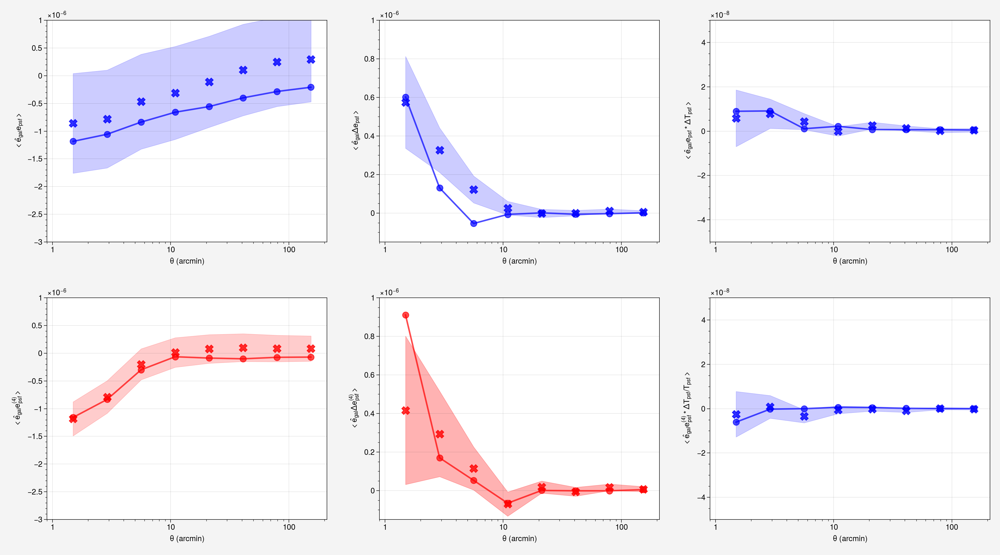

In [22]:
six_param_model = r'($\alpha, \beta, \alpha^{(4)}, \beta^{(4)}, \eta, \eta^{(4)}$) model'

matplotlib.rcParams.update({'font.size': 26, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = pplt.subplots(nrows=2,ncols=3,figsize = (18,10), sharex=False, sharey=False)

nbins = 8
gp = tau_data[0]
gq = tau_data[1]
gp4 = tau_data[2]
gq4 = tau_data[3]
gw = tau_data[4]
gw4 = tau_data[5]
gp_corr_cov = tau_data[6]
r = tau_data[7]


# leakage errors
gp_err = np.sqrt(np.diag(gp_corr_cov)[:nbins])
gp4_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[0,0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'blue' )
ax[0,0].fill_between(r , gp - gp_err, gp + gp_err, color = 'blue' , alpha = 0.2)
ax[0,0].plot(r, dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[0,0].set_xlim([0.9,210])
ax[0,0].set_ylim(-3e-6, 1e-6)
ax[0,0].set_xscale('log')
ax[0,0].set_xlabel(r'$\theta$ (arcmin)')
ax[0,0].set_ylabel(r'$<\hat{e}_{gal} e_{psf}>$')
# ax[0,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


ax[1,0].plot(r, gp4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{psf}>$' , color = 'red')
ax[1,0].fill_between(r, gp4 - gp4_err, gp4 + gp4_err,color = 'red' , alpha = 0.2)
ax[1,0].plot(r, dv[2], 'o-', linewidth = 2, alpha = 0.7, label = six_param_model, color = 'red')
ax[1,0].set_xlim([0.9,210])
ax[1,0].set_ylim(-3e-6, 1e-6)
# ax[0].set_title('leakage')
ax[1,0].set_xscale('log')
ax[1,0].set_xlabel(r'$\theta$ (arcmin)')
ax[1,0].set_ylabel(r'$<\hat{e}_{gal} e^{(4)}_{psf}>$')
# ax[1,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])
gq4_err = np.sqrt(np.diag(gp_corr_cov)[3*nbins:4*nbins])

ax[0,1].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'blue')
ax[0,1].fill_between(r , gq - gq_err, gq + gq_err, color = 'blue' , alpha = 0.2)
ax[0,1].plot(r, dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[0,1].set_xlim([0.9,210])
ax[0,1].set_ylim(-1.5e-7, 1e-6)
ax[0,1].set_xscale('log')
ax[0,1].set_xlabel(r'$\theta$ (arcmin)')
ax[0,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e_{psf}>$')
# ax[0,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[1,1].plot(r, gq4, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$' , color = 'red')
ax[1,1].fill_between(r, gq4 - gq4_err, gq4 + gq4_err,color = 'red' , alpha = 0.3)
ax[1,1].plot(r, dv[3], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'red')
ax[1,1].set_xlim([0.9,210])
ax[1,1].set_ylim(-1.5e-7, 1e-6)
ax[1,1].set_xscale('log')
ax[1,1].set_xlabel(r'$\theta$ (arcmin)')
ax[1,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$')
# ax[1,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# size errors
gw_err = np.sqrt(np.diag(gp_corr_cov)[4*nbins:5*nbins])
gw4_err = np.sqrt(np.diag(gp_corr_cov)[5*nbins:6*nbins])

ax[0,2].plot(r, gw, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{\rm psf}*\Delta T_{\rm psf}/T_{\rm psf}>$' , color = 'blue' )
ax[0,2].fill_between(r , gw - gw_err, gw + gw_err, color = 'blue' , alpha = 0.2)
ax[0,2].plot(r, dv[4], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[0,2].set_xlim([0.9,210])
ax[0,2].set_ylim(-0.5e-7, 0.5e-7)
ax[0,2].set_xscale('log')
ax[0,2].set_xlabel(r'$\theta$ (arcmin)')
ax[0,2].set_ylabel(r'$<\hat{e}_{gal} e_{psf}*\Delta T_{\rm psf}>$')
# ax[0,2].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[1,2].plot(r, gw4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{\rm psf}*\Delta T_{\rm psf}/T_{\rm psf}>$' , color = 'blue' )
ax[1,2].fill_between(r , gw4 - gw4_err, gw4 + gw4_err, color = 'blue' , alpha = 0.2)
ax[1,2].plot(r, dv[5], 'o-', linewidth = 2,alpha = 0.7,  label = six_param_model, color = 'blue')
ax[1,2].set_xlim([0.9,210])
ax[1,2].set_ylim(-0.5e-7, 0.5e-7)
ax[1,2].set_xscale('log')
ax[1,2].set_xlabel(r'$\theta$ (arcmin)')
ax[1,2].set_ylabel(r'$<\hat{e}_{gal} e^{(4)}_{\rm psf}*\Delta T_{\rm psf}/T_{\rm psf}>$')

# plt.savefig(outpath + 'psf_systematics_bestfitxip_model_simgp.png', bbox_inches='tight')

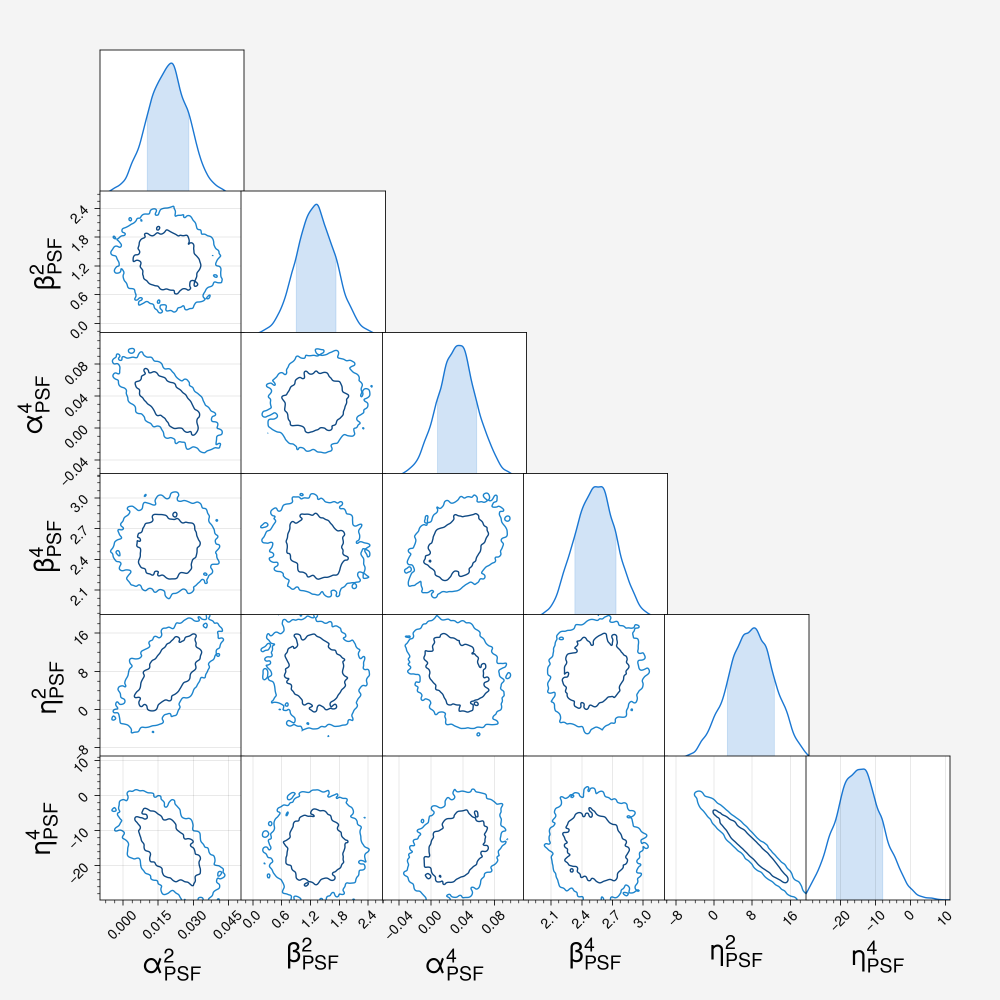

In [24]:
from chainconsumer import ChainConsumer
c  = ChainConsumer()
c.add_chain(chain, parameters=[r'$\alpha^2_\mathrm{PSF}$',r'$\beta^2_\mathrm{PSF}$',r'$\alpha^4_\mathrm{PSF}$',r'$\beta^4_\mathrm{PSF}$','$\eta^2_\mathrm{PSF}$', '$\eta^4_\mathrm{PSF}$'],kde=0., shade=False, color='blue', plot_point=False,)
c.configure(global_point=True,statistics='mean',label_font_size=20,)

plt.close()
fig = c.plotter.plot(figsize="PAGE")
stat=c.analysis.get_summary()

fig.subplots_adjust(wspace=-0.02,hspace=-0.02)
# plt.savefig(outpath + 'mcmc_posteriors_simgp+ppcov.png', bbox_inches='tight')
# gc.collect()

In [29]:
mean_params = np.mean(chain,axis = 0)
print(mean_params)

def corr(x, y, xbar, ybar):
    numer = np.sum((x-xbar)*(y-ybar))
    denom = np.sqrt(np.sum((x-xbar)**2))*np.sqrt(np.sum((y-ybar)**2))
    return numer/denom


corr(chain[:,4], chain[:,5], mean_params[4], mean_params[5])

[  0.0190851    1.30913377   0.03267574   2.53275799   7.61372106
 -14.51611778]


-0.9617811693770685

# Model fit with 16bins (07/26/2023)

In [32]:
outpath = "/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v5b/rho_tau_stats/median_galaxy_color/fiducial_16bins_5taus_072623/"
chain, dv, tau_data = run_model_fit(outpath, "flatchain_simgp.txt", 5, nbins=16, sim=True, ppcov=False,)

hartlap factor is  2.6337305222422676
 final_simplex: (array([[ 0.00796715,  0.83631907,  0.03310124,  2.39461988, -2.35018103],
       [ 0.00796696,  0.8363041 ,  0.03310169,  2.39462677, -2.35022451],
       [ 0.00796728,  0.83630952,  0.03310002,  2.39461376, -2.35023131],
       [ 0.00796722,  0.83632428,  0.03310104,  2.39460859, -2.35019597],
       [ 0.00796707,  0.83631023,  0.03309999,  2.39461303, -2.3501326 ],
       [ 0.00796716,  0.83628785,  0.03310146,  2.39461703, -2.35010659]]), array([56.77871939, 56.77871939, 56.77871939, 56.7787194 , 56.7787194 ,
       56.7787194 ]))
           fun: 56.77871939336066
       message: 'Optimization terminated successfully.'
          nfev: 910
           nit: 573
        status: 0
       success: True
             x: array([ 0.00796715,  0.83631907,  0.03310124,  2.39461988, -2.35018103]) 56.77871939336066 [ 0.00796715  0.83631907  0.03310124  2.39461988 -2.35018103]


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

75 56.780229415991876 0.7570697255465584
0.9421474288682202


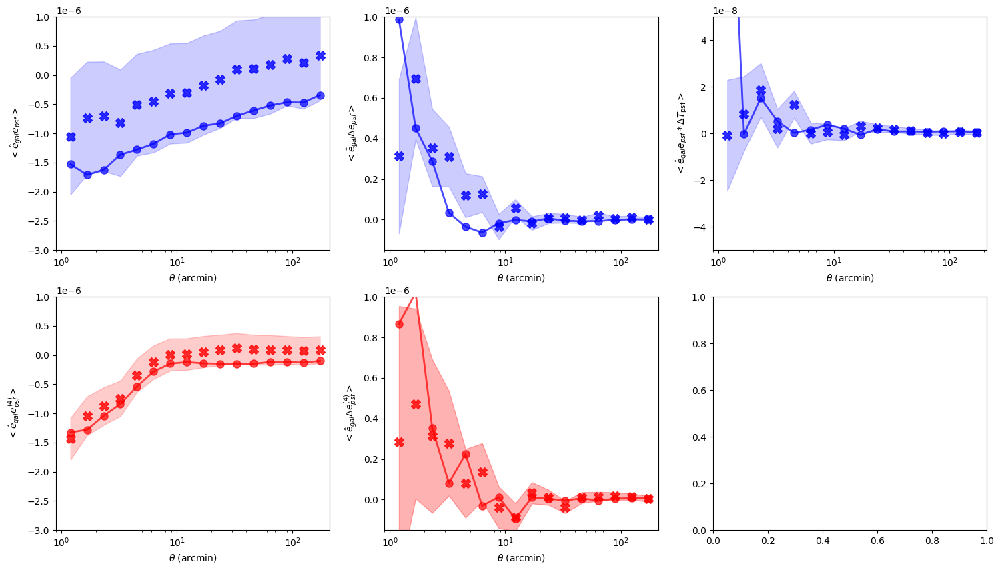

In [97]:
five_param_model = r'($\alpha, \beta, \alpha^{(4)}, \beta^{(4)}, \eta$) model'

matplotlib.rcParams.update({'font.size': 26, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = plt.subplots(nrows=2,ncols=3,figsize = (18,10), sharex=False, sharey=False)

nbins = 16
gp = tau_data[0]
gq = tau_data[1]
gp4 = tau_data[2]
gq4 = tau_data[3]
gw = tau_data[4]
gp_corr_cov = tau_data[5]
r = tau_data[6]


# leakage errors
gp_err = np.sqrt(np.diag(gp_corr_cov)[:nbins])
gp4_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[0,0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'blue' )
ax[0,0].fill_between(r , gp - gp_err, gp + gp_err, color = 'blue' , alpha = 0.2)
ax[0,0].plot(r, dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[0,0].set_xlim([0.9,210])
ax[0,0].set_ylim(-3e-6, 1e-6)
ax[0,0].set_xscale('log')
ax[0,0].set_xlabel(r'$\theta$ (arcmin)')
ax[0,0].set_ylabel(r'$<\hat{e}_{gal} e_{psf}>$')
# ax[0,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


ax[1,0].plot(r, gp4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{psf}>$' , color = 'red')
ax[1,0].fill_between(r, gp4 - gp4_err, gp4 + gp4_err,color = 'red' , alpha = 0.2)
ax[1,0].plot(r, dv[2], 'o-', linewidth = 2, alpha = 0.7, label = five_param_model, color = 'red')
ax[1,0].set_xlim([0.9,210])
ax[1,0].set_ylim(-3e-6, 1e-6)
# ax[0].set_title('leakage')
ax[1,0].set_xscale('log')
ax[1,0].set_xlabel(r'$\theta$ (arcmin)')
ax[1,0].set_ylabel(r'$<\hat{e}_{gal} e^{(4)}_{psf}>$')
# ax[1,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])
gq4_err = np.sqrt(np.diag(gp_corr_cov)[3*nbins:4*nbins])

ax[0,1].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'blue')
ax[0,1].fill_between(r , gq - gq_err, gq + gq_err, color = 'blue' , alpha = 0.2)
ax[0,1].plot(r, dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[0,1].set_xlim([0.9,210])
ax[0,1].set_ylim(-1.5e-7, 1e-6)
ax[0,1].set_xscale('log')
ax[0,1].set_xlabel(r'$\theta$ (arcmin)')
ax[0,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e_{psf}>$')
# ax[0,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[1,1].plot(r, gq4, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$' , color = 'red')
ax[1,1].fill_between(r, gq4 - gq4_err, gq4 + gq4_err,color = 'red' , alpha = 0.3)
ax[1,1].plot(r, dv[3], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'red')
ax[1,1].set_xlim([0.9,210])
ax[1,1].set_ylim(-1.5e-7, 1e-6)
ax[1,1].set_xscale('log')
ax[1,1].set_xlabel(r'$\theta$ (arcmin)')
ax[1,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$')
# ax[1,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# leakage errors
gw_err = np.sqrt(np.diag(gp_corr_cov)[4*nbins:5*nbins])

ax[0,2].plot(r, gw, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{\rm psf}*\Delta T_{\rm psf}>$' , color = 'blue' )
ax[0,2].fill_between(r , gw - gw_err, gw + gw_err, color = 'blue' , alpha = 0.2)
ax[0,2].plot(r, dv[4], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[0,2].set_xlim([0.9,210])
ax[0,2].set_ylim(-0.5e-7, 0.5e-7)
ax[0,2].set_xscale('log')
ax[0,2].set_xlabel(r'$\theta$ (arcmin)')
ax[0,2].set_ylabel(r'$<\hat{e}_{gal} e_{psf}*\Delta T_{\rm psf}>$')
# ax[0,2].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

plt.savefig(outpath + 'psf_systematics_bestfitxip_model_simgp+ppcov.png', bbox_inches='tight')

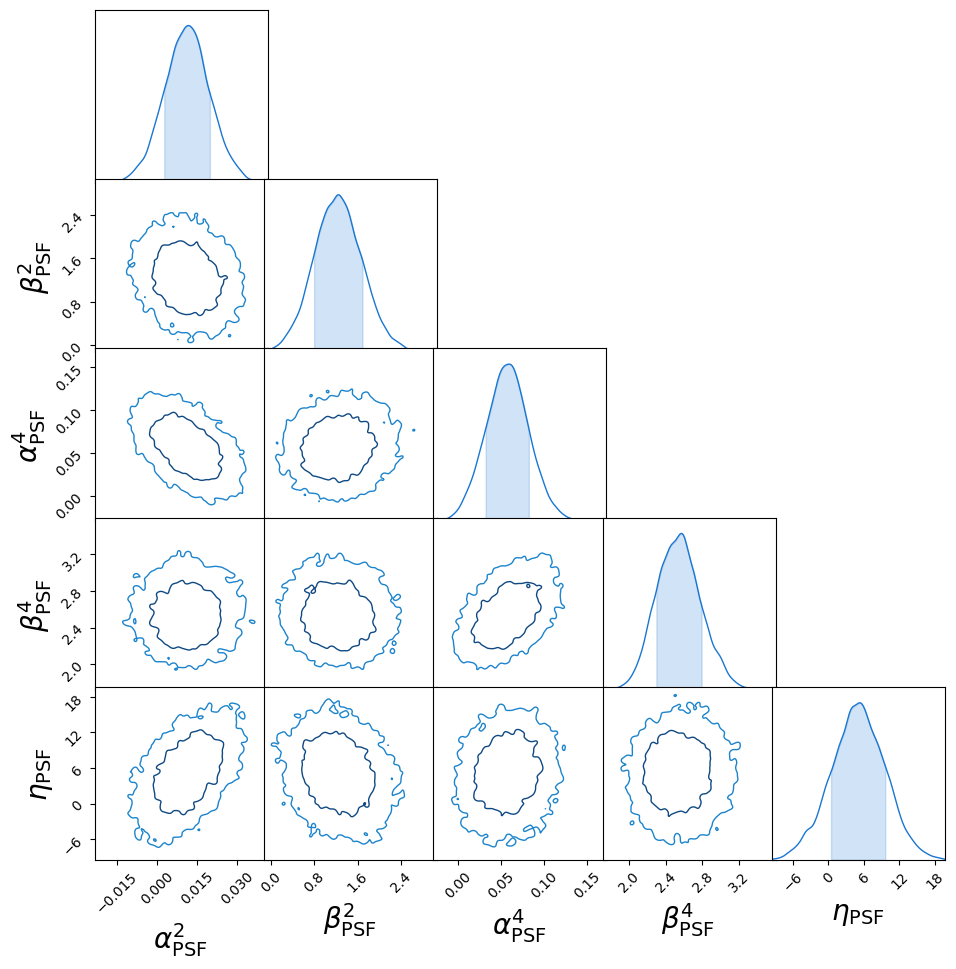

In [98]:
from chainconsumer import ChainConsumer
c  = ChainConsumer()
c.add_chain(chain, parameters=[r'$\alpha^2_\mathrm{PSF}$',r'$\beta^2_\mathrm{PSF}$',r'$\alpha^4_\mathrm{PSF}$',r'$\beta^4_\mathrm{PSF}$','$\eta_\mathrm{PSF}$'],kde=0., shade=False, color='blue', plot_point=False,)
c.configure(global_point=True,statistics='mean',label_font_size=20,)

plt.close()
fig = c.plotter.plot(figsize="PAGE")
stat=c.analysis.get_summary()

fig.subplots_adjust(wspace=-0.02,hspace=-0.02)
plt.savefig(outpath + 'mcmc_posteriors_simgp+ppcov.png', bbox_inches='tight')
# gc.collect()

# Mode fit where alphas are set to 0 (07/26/2023) 

In [35]:
outpath = "/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v5b/rho_tau_stats/median_galaxy_color/fiducial_5taus_072523/"
chain, dv, tau_data = run_model_fit(outpath, "flatchain_simgp_zeroalpha.txt", 3, sim=True, ppcov=False, set_alpha=True)

hartlap factor is  3.606350980032973
 final_simplex: (array([[-0.00016602, -0.000461  ,  0.00074516],
       [-0.00016403, -0.00045241,  0.00073957],
       [-0.00016519, -0.00045775,  0.00074197],
       [-0.00016363, -0.0004596 ,  0.00073801]]), array([60.01259787, 60.01262801, 60.01263379, 60.01267918]))
           fun: 60.012597866716135
       message: 'Optimization terminated successfully.'
          nfev: 56
           nit: 30
        status: 0
       success: True
             x: array([-0.00016602, -0.000461  ,  0.00074516]) 60.012597866716135 [-0.00016602 -0.000461    0.00074516]


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

93 60.013480496373724 0.6453062418964917
0.996865762201286


Text(0, 0.5, '$<\\hat{e}_{gal} e_{psf}*\\Delta T_{\\rm psf}>$')

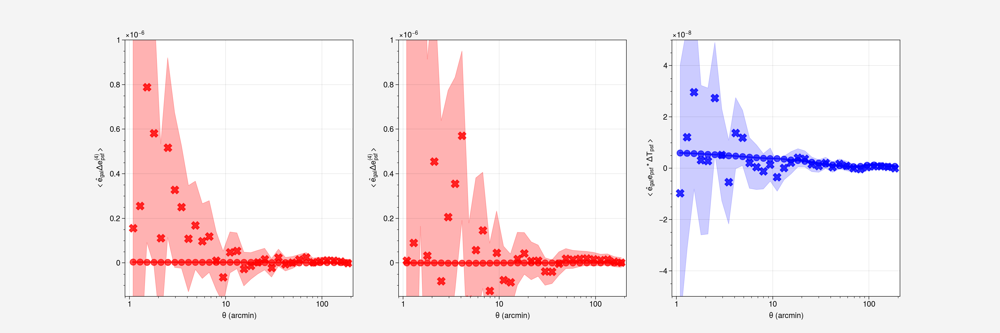

In [38]:
five_param_model = r'($\beta, \beta^{(4)}, \eta$) model'

matplotlib.rcParams.update({'font.size': 26, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = plt.subplots(nrows=1,ncols=3,figsize = (18,6), sharex=False, sharey=False)

nbins = 32
gq = tau_data[0]
gq4 = tau_data[1]
gw = tau_data[2]
gp_corr_cov = tau_data[3]
r = tau_data[4]


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[0:nbins])
gq4_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])

ax[0].plot(r, gq, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'red')
ax[0].fill_between(r, gq - gq_err, gq + gq_err, color = 'red' , alpha = 0.3)
ax[0].plot(r, dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'red')
ax[0].set_xlim([0.9,210])
ax[0].set_ylim(-1.5e-7, 1e-6)
ax[0].set_xscale('log')
ax[0].set_xlabel(r'$\theta$ (arcmin)')
ax[0].set_ylabel(r'$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$')

ax[1].plot(r, gq4, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$' , color = 'red')
ax[1].fill_between(r, gq4 - gq4_err, gq4 + gq4_err,color = 'red' , alpha = 0.3)
ax[1].plot(r, dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'red')
ax[1].set_xlim([0.9,210])
ax[1].set_ylim(-1.5e-7, 1e-6)
ax[1].set_xscale('log')
ax[1].set_xlabel(r'$\theta$ (arcmin)')
ax[1].set_ylabel(r'$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$')
# ax[1,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# leakage errors
gw_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[2].plot(r, gw, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{\rm psf}*\Delta T_{\rm psf}>$' , color = 'blue' )
ax[2].fill_between(r , gw - gw_err, gw + gw_err, color = 'blue' , alpha = 0.2)
ax[2].plot(r, dv[2], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[2].set_xlim([0.9,210])
ax[2].set_ylim(-0.5e-7, 0.5e-7)
ax[2].set_xscale('log')
ax[2].set_xlabel(r'$\theta$ (arcmin)')
ax[2].set_ylabel(r'$<\hat{e}_{gal} e_{psf}*\Delta T_{\rm psf}>$')
# ax[0,2].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# plt.savefig(outpath + 'psf_systematics_bestfitxip_model_simgp+ppcov.png', bbox_inches='tight')

# Model fit where hartlap factor is corrected (07/25/2023)

In [99]:
outpath = "/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v5b/rho_tau_stats/median_galaxy_color/fiducial_5taus_072523/"
chain, dv, tau_data = run_model_fit(outpath, "flatchain_simgp+ppcov.txt", 5, nbins=32, sim=True, ppcov=True,)

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159]
       message: Optimization terminated successfully.
       success: True
        status: 0
           fun: 95.2350043569223
             x: [ 1.136e-02  1.384e+00  3.112e-02  2.357e+00  1.004e+00]
           nit: 371
          nfev: 593
 final_simplex: (array([[ 1.136e-02,  1.384e+00, ...,  2.357e+00,
                         1.004e+00],
        

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

155 94.61967396450414 0.6104495094484138
0.9999649380278594


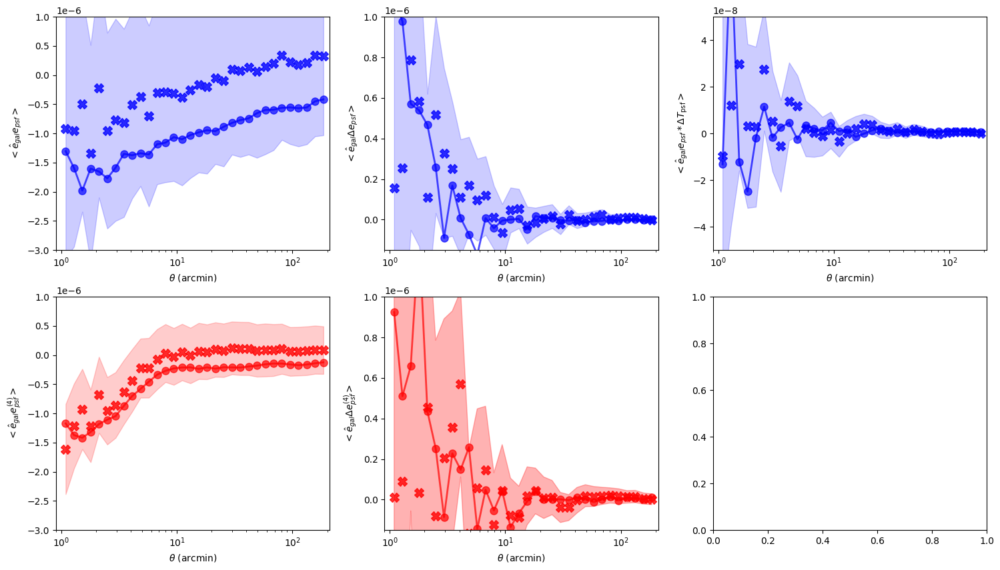

In [100]:
five_param_model = r'($\alpha, \beta, \alpha^{(4)}, \beta^{(4)}, \eta$) model'

matplotlib.rcParams.update({'font.size': 26, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = plt.subplots(nrows=2,ncols=3,figsize = (18,10), sharex=False, sharey=False)

nbins = 32
gp = tau_data[0]
gq = tau_data[1]
gp4 = tau_data[2]
gq4 = tau_data[3]
gw = tau_data[4]
gp_corr_cov = tau_data[5]
r = tau_data[6]


# leakage errors
gp_err = np.sqrt(np.diag(gp_corr_cov)[:nbins])
gp4_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[0,0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'blue' )
ax[0,0].fill_between(r , gp - gp_err, gp + gp_err, color = 'blue' , alpha = 0.2)
ax[0,0].plot(r, dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[0,0].set_xlim([0.9,210])
ax[0,0].set_ylim(-3e-6, 1e-6)
ax[0,0].set_xscale('log')
ax[0,0].set_xlabel(r'$\theta$ (arcmin)')
ax[0,0].set_ylabel(r'$<\hat{e}_{gal} e_{psf}>$')
# ax[0,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


ax[1,0].plot(r, gp4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{psf}>$' , color = 'red')
ax[1,0].fill_between(r, gp4 - gp4_err, gp4 + gp4_err,color = 'red' , alpha = 0.2)
ax[1,0].plot(r, dv[2], 'o-', linewidth = 2, alpha = 0.7, label = five_param_model, color = 'red')
ax[1,0].set_xlim([0.9,210])
ax[1,0].set_ylim(-3e-6, 1e-6)
# ax[0].set_title('leakage')
ax[1,0].set_xscale('log')
ax[1,0].set_xlabel(r'$\theta$ (arcmin)')
ax[1,0].set_ylabel(r'$<\hat{e}_{gal} e^{(4)}_{psf}>$')
# ax[1,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])
gq4_err = np.sqrt(np.diag(gp_corr_cov)[3*nbins:4*nbins])

ax[0,1].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'blue')
ax[0,1].fill_between(r , gq - gq_err, gq + gq_err, color = 'blue' , alpha = 0.2)
ax[0,1].plot(r, dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[0,1].set_xlim([0.9,210])
ax[0,1].set_ylim(-1.5e-7, 1e-6)
ax[0,1].set_xscale('log')
ax[0,1].set_xlabel(r'$\theta$ (arcmin)')
ax[0,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e_{psf}>$')
# ax[0,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[1,1].plot(r, gq4, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$' , color = 'red')
ax[1,1].fill_between(r, gq4 - gq4_err, gq4 + gq4_err,color = 'red' , alpha = 0.3)
ax[1,1].plot(r, dv[3], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'red')
ax[1,1].set_xlim([0.9,210])
ax[1,1].set_ylim(-1.5e-7, 1e-6)
ax[1,1].set_xscale('log')
ax[1,1].set_xlabel(r'$\theta$ (arcmin)')
ax[1,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$')
# ax[1,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# leakage errors
gw_err = np.sqrt(np.diag(gp_corr_cov)[4*nbins:5*nbins])

ax[0,2].plot(r, gw, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{\rm psf}*\Delta T_{\rm psf}>$' , color = 'blue' )
ax[0,2].fill_between(r , gw - gw_err, gw + gw_err, color = 'blue' , alpha = 0.2)
ax[0,2].plot(r, dv[4], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[0,2].set_xlim([0.9,210])
ax[0,2].set_ylim(-0.5e-7, 0.5e-7)
ax[0,2].set_xscale('log')
ax[0,2].set_xlabel(r'$\theta$ (arcmin)')
ax[0,2].set_ylabel(r'$<\hat{e}_{gal} e_{psf}*\Delta T_{\rm psf}>$')
# ax[0,2].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

plt.savefig(outpath + 'psf_systematics_bestfitxip_model_simgp+ppcov.png', bbox_inches='tight')

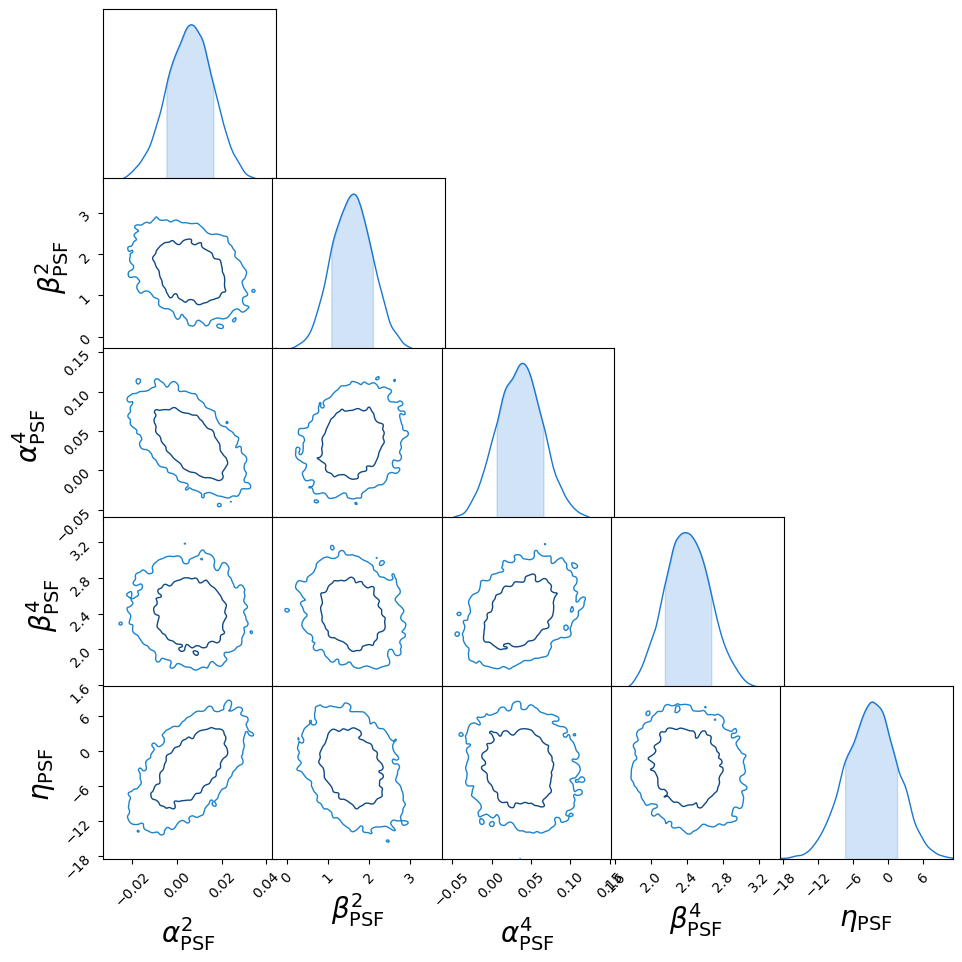

In [101]:
from chainconsumer import ChainConsumer
c  = ChainConsumer()
c.add_chain(chain, parameters=[r'$\alpha^2_\mathrm{PSF}$',r'$\beta^2_\mathrm{PSF}$',r'$\alpha^4_\mathrm{PSF}$',r'$\beta^4_\mathrm{PSF}$','$\eta_\mathrm{PSF}$'],kde=0., shade=False, color='blue', plot_point=False,)
c.configure(global_point=True,statistics='mean',label_font_size=20,)

plt.close()
fig = c.plotter.plot(figsize="PAGE")
stat=c.analysis.get_summary()

fig.subplots_adjust(wspace=-0.02,hspace=-0.02)
plt.savefig(outpath + 'mcmc_posteriors_simgp+ppcov.png', bbox_inches='tight')
# gc.collect()

# Fit by hand (07/25/2023)

In [48]:
mean_params = [ 1.136e-02, 1.384e+00, 3.112e-02, 2.357e+00, 1.004e+00]
outpath = "/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v5b/rho_tau_stats/median_galaxy_color/newstarcat_eta_071123/"
with open(os.path.join(outpath, "full_correlation_psf.pkl"), "rb") as f:
        (   r,
            gp_corr,
            pp_corr,
            psf_const1,
            psf_const2,
            egal_mean,
            pp_corr_cov,
            pp_joint_cov,
            gp_corr_cov
        ) = pickle.load(f)

scale_cut = 0
num_of_corr = 5
slice_skip = 1
nbins = 32

gp = gp_corr[0, :]
gq = gp_corr[1, :]
gp4 = gp_corr[2, :] 
gq4 = gp_corr[3, :]
gw = gp_corr[4, :]
observe_dv = np.concatenate((gp, gq, gp4, gq4, gw))

bestfit_list = []
for i in range(num_of_corr):
    this_gp = np.zeros(nbins)
    for j in range(num_of_corr):
        this_gp += mean_params[j] * pp_corr[i][j]

    bestfit_list.append(this_gp)

dv = np.array(bestfit_list)
gp_corr_cov = np.loadtxt(outpath + "gp_covariance_psf.txt")

Text(0, 0.5, '$<\\hat{e}_{gal} e_{psf}*\\Delta T_{\\rm psf}>$')

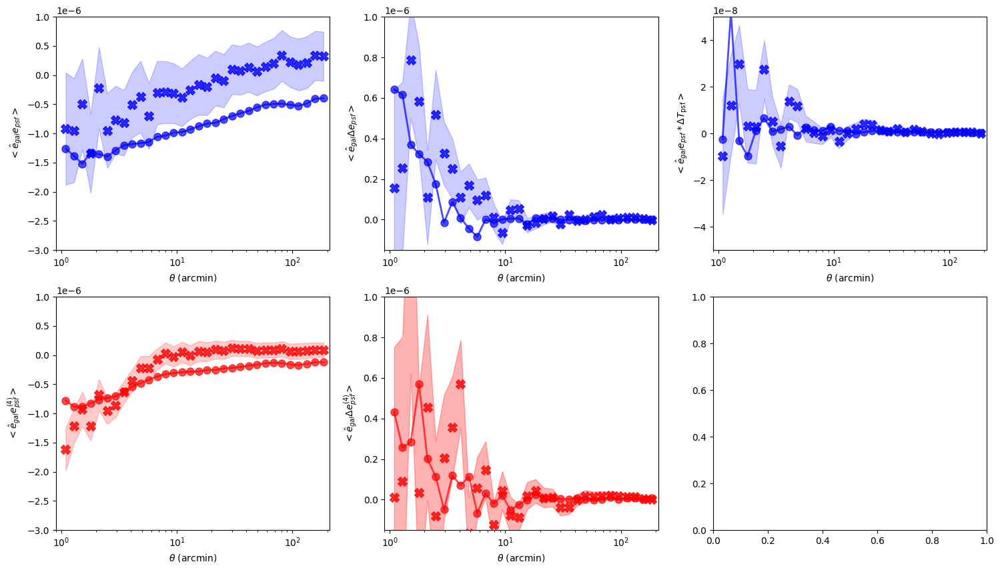

In [49]:
five_param_model = r'($\alpha, \beta, \alpha^{(4)}, \beta^{(4)}, \eta$) model'

matplotlib.rcParams.update({'font.size': 26, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = plt.subplots(nrows=2,ncols=3,figsize = (18,10), sharex=False, sharey=False)

# leakage errors
gp_err = np.sqrt(np.diag(gp_corr_cov)[:nbins])
gp4_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[0,0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'blue' )
ax[0,0].fill_between(r , gp - gp_err, gp + gp_err, color = 'blue' , alpha = 0.2)
ax[0,0].plot(r, dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[0,0].set_xlim([0.9,210])
ax[0,0].set_ylim(-3e-6, 1e-6)
ax[0,0].set_xscale('log')
ax[0,0].set_xlabel(r'$\theta$ (arcmin)')
ax[0,0].set_ylabel(r'$<\hat{e}_{gal} e_{psf}>$')
# ax[0,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


ax[1,0].plot(r, gp4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{psf}>$' , color = 'red')
ax[1,0].fill_between(r, gp4 - gp4_err, gp4 + gp4_err,color = 'red' , alpha = 0.2)
ax[1,0].plot(r, dv[2], 'o-', linewidth = 2, alpha = 0.7, label = five_param_model, color = 'red')
ax[1,0].set_xlim([0.9,210])
ax[1,0].set_ylim(-3e-6, 1e-6)
# ax[0].set_title('leakage')
ax[1,0].set_xscale('log')
ax[1,0].set_xlabel(r'$\theta$ (arcmin)')
ax[1,0].set_ylabel(r'$<\hat{e}_{gal} e^{(4)}_{psf}>$')
# ax[1,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])
gq4_err = np.sqrt(np.diag(gp_corr_cov)[3*nbins:4*nbins])

ax[0,1].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'blue')
ax[0,1].fill_between(r , gq - gq_err, gq + gq_err, color = 'blue' , alpha = 0.2)
ax[0,1].plot(r, dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[0,1].set_xlim([0.9,210])
ax[0,1].set_ylim(-1.5e-7, 1e-6)
ax[0,1].set_xscale('log')
ax[0,1].set_xlabel(r'$\theta$ (arcmin)')
ax[0,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e_{psf}>$')
# ax[0,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[1,1].plot(r, gq4, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$' , color = 'red')
ax[1,1].fill_between(r, gq4 - gq4_err, gq4 + gq4_err,color = 'red' , alpha = 0.3)
ax[1,1].plot(r, dv[3], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'red')
ax[1,1].set_xlim([0.9,210])
ax[1,1].set_ylim(-1.5e-7, 1e-6)
ax[1,1].set_xscale('log')
ax[1,1].set_xlabel(r'$\theta$ (arcmin)')
ax[1,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$')
# ax[1,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# leakage errors
gw_err = np.sqrt(np.diag(gp_corr_cov)[4*nbins:5*nbins])

ax[0,2].plot(r, gw, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{\rm psf}*\Delta T_{\rm psf}>$' , color = 'blue' )
ax[0,2].fill_between(r , gw - gw_err, gw + gw_err, color = 'blue' , alpha = 0.2)
ax[0,2].plot(r, dv[4], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[0,2].set_xlim([0.9,210])
ax[0,2].set_ylim(-0.5e-7, 0.5e-7)
ax[0,2].set_xscale('log')
ax[0,2].set_xlabel(r'$\theta$ (arcmin)')
ax[0,2].set_ylabel(r'$<\hat{e}_{gal} e_{psf}*\Delta T_{\rm psf}>$')
# ax[0,2].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


# plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v5/psf_systematics_bestfitxip_model_bootstrap_const_weighted_fullcov.png', bbox_inches='tight')

# Model fit with NumPyro

In [3]:
import jax.numpy as jnp
import jax.random as random
import numpyro
import numpyro.distributions as dist
import numpyro.infer as infer
from numpyro.infer import MCMC, NUTS

def construct_param_matrix(param, num_of_corr, nbins, parametrize=True):

    if parametrize: 
        res = jnp.zeros(shape=(num_of_corr*nbins, num_of_corr*num_of_corr*nbins))

        basic_block = jnp.zeros(shape=(nbins, num_of_corr*nbins))
        for i in range(num_of_corr):
            # basic_block[0:nbins, i * nbins : (i + 1) * nbins] = jnp.diag(jnp.ones(nbins)*param[i])
            basic_block = basic_block.at[0:nbins, i * nbins : (i + 1) * nbins].set(jnp.diag(jnp.ones(nbins)*param[i]))

        for i in range(num_of_corr):
            # res[i * nbins : (i + 1) * nbins, i*num_of_corr*nbins : (i + 1)*num_of_corr*nbins] = basic_block
            res = res.at[i * nbins : (i + 1) * nbins, i*num_of_corr*nbins : (i + 1)*num_of_corr*nbins].set(basic_block)
    else:
        res = jnp.ones(shape=(num_of_corr*nbins, num_of_corr*num_of_corr*nbins))

    return res

def model(x, yerr=None, y=None, xerr=None, nbins=32, num_of_corr=5):

    # define parameters (incl. prior ranges)
    if num_of_corr == 5:
        a = numpyro.sample('a', dist.Uniform(-0.1, 0.1))
        b = numpyro.sample('b', dist.Uniform(-5, 5))
        a4 = numpyro.sample('a4', dist.Uniform(-0.1, 0.1))
        b4 = numpyro.sample('b4', dist.Uniform(-5, 5))
        e = numpyro.sample('e', dist.Uniform(-10, 10))
    elif num_of_corr == 3:
        a = numpyro.sample('a', dist.Uniform(-0.1, 0.1))
        b = numpyro.sample('b', dist.Uniform(-5, 5))
        e = numpyro.sample('e', dist.Uniform(-10, 10))

    # implement the model
    # needs jax numpy for differentiability here
    n_b = nbins
    gp_theory = jnp.zeros(shape = (num_of_corr,n_b))
    
    if yerr is not None:
        # include pp cov
        if num_of_corr == 5:
            param = [a, b, a4, b4, e]
        elif num_of_corr == 3:
            param = [a, b, e]
        param_matrix = construct_param_matrix(param, num_of_corr, nbins)
        pp_cov = jnp.zeros(shape=(num_of_corr*nbins, num_of_corr*nbins))
        # pp_cov[0:num_of_corr*nbins, 0:num_of_corr*nbins] = (param_matrix @ xerr) @ param_matrix.T
        pp_cov = pp_cov.at[0:num_of_corr*nbins, 0:num_of_corr*nbins].set((param_matrix @ xerr) @ param_matrix.T)
    else:
        if num_of_corr == 5:
            param = [a, b, a4, b4, e]
        elif num_of_corr == 3:
            param = [a, b, e]
        yerr = jnp.zeros((2*nbins*num_of_corr, 2*nbins*num_of_corr))
        pp_cov = jnp.zeros((2*nbins*num_of_corr, 2*nbins*num_of_corr))

    # i is row, j is column
    for i in range(num_of_corr):
        this_gp = jnp.zeros(n_b)
        for j in range(num_of_corr):
            this_gp += param[j] * x[i][j]
        
        # gp_theory[i] = this_gp
        gp_theory = gp_theory.at[i].set(this_gp)
    
    gp_theory_db = gp_theory.reshape(-1)
    y_model = gp_theory_db
    
    #slice is angular scale cut
    slice_ = []
    for i in range(num_of_corr):
        slice_.append(np.arange(0, n_b) + i*n_b)
    slice_ = np.array(slice_).reshape(-1)
    yerr_ = (yerr + pp_cov)[slice_,:][:,slice_]

    # notice that we clamp the outcome of this sampling to the observation y
    numpyro.sample('y', dist.MultivariateNormal(loc=y_model, covariance_matrix=yerr_), obs=y)
    
def compute_chi2(x, y, yerr, xerr, nbins=32, num_of_corr=5, param=None, pred=None, mean=False):
    
    n_b = nbins 
    
    if mean:
        chi2_ = []
        for i,p in enumerate(pred):
            res = y - p

            param_matrix = construct_param_matrix(param[i], num_of_corr, nbins)
            pp_cov = jnp.zeros(shape=(num_of_corr*nbins, num_of_corr*nbins))
            # pp_cov[0:num_of_corr*nbins, 0:num_of_corr*nbins] = (param_matrix @ xerr) @ param_matrix.T
            pp_cov = pp_cov.at[0:num_of_corr*nbins, 0:num_of_corr*nbins].set((param_matrix @ xerr) @ param_matrix.T)
            slice_ = []
            for i in range(num_of_corr):
                slice_.append(np.arange(0, n_b) + i*n_b)
            slice_ = np.array(slice_).reshape(-1)
            yerr_ = (yerr + pp_cov)[slice_,:][:,slice_]

            cov_inv = np.linalg.inv(yerr_)
            chi2 = res.T @ cov_inv @ res
            df = (n_b*num_of_corr) - num_of_corr
            chi2_.append(chi2/df)
        return np.mean(chi2_)
    else:
        res = y - pred

        param_matrix = construct_param_matrix(param, num_of_corr, nbins)
        pp_cov = jnp.zeros(shape=(num_of_corr*nbins, num_of_corr*nbins))
        # pp_cov[0:num_of_corr*nbins, 0:num_of_corr*nbins] = (param_matrix @ xerr) @ param_matrix.T
        pp_cov = pp_cov.at[0:num_of_corr*nbins, 0:num_of_corr*nbins].set((param_matrix @ xerr) @ param_matrix.T)
        slice_ = []
        for i in range(num_of_corr):
            slice_.append(np.arange(0, n_b) + i*n_b)
        slice_ = np.array(slice_).reshape(-1)
        yerr_ = (yerr + pp_cov)[slice_,:][:,slice_]

        cov_inv = np.linalg.inv(yerr_)
        chi2=res.T @ cov_inv @ res
        df = (n_b*num_of_corr) - num_of_corr

        return chi2/df
    
    
def plot_results(x, y, yerr, r, param_model, nbins=32, num_of_corr=5, predict=None):
    
    matplotlib.rcParams.update({'font.size': 22, 'legend.fontsize':'x-small', 'lines.markersize':8})
    
    if num_of_corr == 5:
        fig,ax = plt.subplots(nrows=2,ncols=3,figsize = (18,10), sharex=False, sharey=False)

        # leakage errors
        gp_err = np.sqrt(np.diag(yerr)[:nbins])
        gp4_err = np.sqrt(np.diag(yerr)[2*nbins:3*nbins])

        ax[0,0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'red' )
        ax[0,0].fill_between(r , gp - gp_err, gp + gp_err, color = 'red' , alpha = 0.2)
        for i,pred in enumerate(predict):
            ax[0,0].plot(r, pred[:nbins], '-', linewidth = 1,alpha = 0.1,  label = 'predictions', color = 'grey')
        ax[0,0].set_xlim([0.9,210])
        ax[0,0].set_ylim(-3e-6, 1e-6)
        ax[0,0].set_xscale('log')
        ax[0,0].set_xlabel(r'$\theta$ (arcmin)')
        ax[0,0].set_ylabel(r'$<\hat{e}_{gal} e_{psf}>$')
        # ax[0,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


        ax[1,0].plot(r, gp4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{psf}>$' , color = 'red')
        ax[1,0].fill_between(r, gp4 - gp4_err, gp4 + gp4_err,color = 'red' , alpha = 0.2)
        for i,pred in enumerate(predict):
            ax[1,0].plot(r, pred[2*nbins:3*nbins], '-', linewidth = 1, alpha = 0.1, label = 'predictions', color = 'grey')
        ax[1,0].set_xlim([0.9,210])
        ax[1,0].set_ylim(-3e-6, 1e-6)
        # ax[0].set_title('leakage')
        ax[1,0].set_xscale('log')
        ax[1,0].set_xlabel(r'$\theta$ (arcmin)')
        ax[1,0].set_ylabel(r'$<\hat{e}_{gal} e^{(4)}_{psf}>$')
        # ax[1,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

        # modeling errors
        gq_err = np.sqrt(np.diag(yerr)[nbins:2*nbins])
        gq4_err = np.sqrt(np.diag(yerr)[3*nbins:4*nbins])

        ax[0,1].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'red')
        ax[0,1].fill_between(r , gq - gq_err, gq + gq_err, color = 'red' , alpha = 0.2)
        for i,pred in enumerate(predict):
            ax[0,1].plot(r, pred[nbins:2*nbins], '-', linewidth = 1, alpha = 0.1, label = 'predictions', color = 'grey')
        ax[0,1].set_xlim([0.9,210])
        ax[0,1].set_ylim(-1.5e-7, 1e-6)
        ax[0,1].set_xscale('log')
        ax[0,1].set_xlabel(r'$\theta$ (arcmin)')
        ax[0,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e_{psf}>$')
        # ax[0,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

        ax[1,1].plot(r, gq4, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$' , color = 'red')
        ax[1,1].fill_between(r, gq4 - gq4_err, gq4 + gq4_err,color = 'red' , alpha = 0.3)
        for i,pred in enumerate(predict):
            ax[1,1].plot(r, pred[3*nbins:4*nbins], '-', linewidth = 1, alpha = 0.1, label = 'predictions', color = 'grey')
        ax[1,1].set_xlim([0.9,210])
        ax[1,1].set_ylim(-1.5e-7, 1e-6)
        ax[1,1].set_xscale('log')
        ax[1,1].set_xlabel(r'$\theta$ (arcmin)')
        ax[1,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$')
        # ax[1,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

        # leakage errors
        gw_err = np.sqrt(np.diag(yerr)[4*nbins:5*nbins])

        ax[0,2].plot(r, gw, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = 'data' , color = 'red' )
        ax[0,2].fill_between(r , gw - gw_err, gw + gw_err, color = 'red' , alpha = 0.2)
        for i,pred in enumerate(predict):
            if i==0:
                ax[0,2].plot(r, pred[4*nbins:5*nbins], '-', linewidth = 1, alpha = 0.1, label = 'predictions', color = 'grey')
            else:
                ax[0,2].plot(r, pred[4*nbins:5*nbins], '-', linewidth = 1, alpha = 0.1, color = 'grey')
        ax[0,2].set_xlim([0.9,210])
        ax[0,2].set_ylim(-0.5e-7, 0.5e-7)
        ax[0,2].set_xscale('log')
        ax[0,2].set_xlabel(r'$\theta$ (arcmin)')
        ax[0,2].set_ylabel(r'$<\hat{e}_{gal} e_{psf}*\Delta T_{\rm psf}>$')
        # ax[0,2].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)
        ax[0,2].legend()

        fig.delaxes(ax[1,2])
    elif num_of_corr == 3:
        fig,ax = plt.subplots(nrows=1,ncols=3,figsize = (18,6), sharex=False, sharey=False)

        # leakage errors
        gp_err = np.sqrt(np.diag(yerr)[:nbins])

        ax[0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'red' )
        ax[0].fill_between(r , gp - gp_err, gp + gp_err, color = 'red' , alpha = 0.2)
        for i,pred in enumerate(predict):
            ax[0].plot(r, pred[:nbins], '-', linewidth = 1,alpha = 0.1,  label = 'predictions', color = 'grey')
        ax[0].set_xlim([0.9,210])
        ax[0].set_ylim(-3e-6, 1e-6)
        ax[0].set_xscale('log')
        ax[0].set_xlabel(r'$\theta$ (arcmin)')
        ax[0].set_ylabel(r'$<\hat{e}_{gal} e_{psf}>$')
        # ax[0,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

        # modeling errors
        gq_err = np.sqrt(np.diag(yerr)[nbins:2*nbins])

        ax[1].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'red')
        ax[1].fill_between(r , gq - gq_err, gq + gq_err, color = 'red' , alpha = 0.2)
        for i,pred in enumerate(predict):
            ax[1].plot(r, pred[nbins:2*nbins], '-', linewidth = 1, alpha = 0.1, label = 'predictions', color = 'grey')
        ax[1].set_xlim([0.9,210])
        ax[1].set_ylim(-1.5e-7, 1e-6)
        ax[1].set_xscale('log')
        ax[1].set_xlabel(r'$\theta$ (arcmin)')
        ax[1].set_ylabel(r'$<\hat{e}_{gal} \Delta e_{psf}>$')
        # ax[0,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

        # leakage errors
        gw_err = np.sqrt(np.diag(yerr)[2*nbins:3*nbins])

        ax[2].plot(r, gw, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = 'data' , color = 'red' )
        ax[2].fill_between(r , gw - gw_err, gw + gw_err, color = 'red' , alpha = 0.2)
        for i,pred in enumerate(predict):
            if i==0:
                ax[2].plot(r, pred[2*nbins:3*nbins], '-', linewidth = 1, alpha = 0.1, label = 'predictions', color = 'grey')
            else:
                ax[2].plot(r, pred[2*nbins:3*nbins], '-', linewidth = 1, alpha = 0.1, color = 'grey')
        ax[2].set_xlim([0.9,210])
        ax[2].set_ylim(-0.5e-7, 0.5e-7)
        ax[2].set_xscale('log')
        ax[2].set_xlabel(r'$\theta$ (arcmin)')
        ax[2].set_ylabel(r'$<\hat{e}_{gal} e_{psf}*\Delta T_{\rm psf}>$')
        # ax[0,2].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)
        ax[2].legend()

    plt.tight_layout()

/global/homes/m/myamamot/miniforge3/envs/mcmc_viz/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
outpath = "/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v5b/rho_tau_stats/median_galaxy_color/zbandonly_072123/"
with open(os.path.join(outpath, "full_correlation_psf.pkl"), "rb") as f:
        (   r,
            gp_corr,
            pp_corr,
            psf_const1,
            psf_const2,
            egal_mean,
            pp_corr_cov,
            pp_joint_cov,
            gp_corr_cov
        ) = pickle.load(f)
    
scale_cut = 0
num_of_corr = 5
slice_skip = 1
nbins = 32

if num_of_corr == 5:
    gp = gp_corr[0, :]
    gq = gp_corr[1, :]
    gp4 = gp_corr[2, :] 
    gq4 = gp_corr[3, :]
    gw = gp_corr[4, :]
    observe_dv = np.concatenate((gp, gq, gp4, gq4, gw))
elif num_of_corr == 3:
    gp = gp_corr[0, :]
    gq = gp_corr[1, :]
    gw = gp_corr[2, :]
    observe_dv = np.concatenate((gp, gq, gw))

gp_corr_cov = np.loadtxt(outpath + "gp_covariance_psf.txt")
# # Make covariance from mock data
# sims = os.path.join(outpath, 'sims')
# obs = np.zeros((200, nbins*num_of_corr))
# for i in range(200):
#     with open(os.path.join(sims, 'full_correlation_psf_'+str(i+1)+'.pkl'), 'rb') as f:
#         gp_all = pickle.load(f)
#         gp_full = gp_all[1]
#     obs[i, 0:nbins*num_of_corr] = np.concatenate((gp_full[0,:], gp_full[1,:], gp_full[2,:], gp_full[3,:], gp_full[4,:]))

# f_hartlap = (200 - nbins - 2)/(200 - 1)
# gp_corr_cov = np.cov(obs.T) * f_hartlap
# # gp_corr_cov_inv = np.linalg.inv(gp_corr_cov)

In [6]:
# need to split the key for jax's random implementation
rng_key = random.PRNGKey(0)
rng_key, rng_key_ = random.split(rng_key)

# run HMC with NUTS
kernel = NUTS(model, target_accept_prob=0.95)
mcmc = MCMC(kernel, num_warmup=1000, num_samples=5000, num_chains=25, progress_bar=True)
mcmc.run(rng_key_, pp_corr, yerr=gp_corr_cov, y=observe_dv, xerr=pp_joint_cov, num_of_corr=num_of_corr)
mcmc.print_summary()


No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
/tmp/ipykernel_336444/1981292675.py:7: UserWarning: There are not enough devices to run parallel chains: expected 25 but got 1. Chains will be drawn sequentially. If you are running MCMC in CPU, consider using `numpyro.set_host_device_count(25)` at the beginning of your program. You can double-check how many devices are available in your system using `jax.local_device_count()`.
  mcmc = MCMC(kernel, num_warmup=1000, num_samples=5000, num_chains=25, progress_bar=True)
sample: 100%|██████████| 6000/6000 [04:33<00:00, 21.91it/s, 7 steps of size 3.44e-01. acc. prob=0.95] 



                mean       std    median      5.0%     95.0%     n_eff     r_hat
         a      0.00      0.00      0.00     -0.00      0.01  68310.92      1.00
        a4      0.03      0.01      0.03      0.01      0.04  72180.30      1.00
         b      0.45      0.15      0.45      0.21      0.69  75414.47      1.00
        b4      0.66      0.06      0.66      0.56      0.77  78036.68      1.00
         e      1.55      1.07      1.47     -0.19      3.27  82234.98      1.00

Number of divergences: 0


In [15]:
import corner
import arviz as az
az.style.use("arviz-doc")

# d = az.from_numpyro(mcmc)
fig = corner.corner(mcmc)
# fig.savefig(outpath+'mcmc_corner.png')

AttributeError: module 'matplotlib' has no attribute 'colormaps'

In [13]:
# make predictions from posterior
hmc_samples = mcmc.get_samples()
predictive = infer.Predictive(model, hmc_samples)
# need to set noise to zero
# since the full model contains noise contribution
predictions_ = predictive(rng_key_, pp_corr, yerr=gp_corr_cov, xerr=pp_joint_cov, num_of_corr=num_of_corr)['y']
if num_of_corr == 5:
    params_ = np.zeros(len(predictions_), dtype=[('a','f8'), ('b','f8'), ('a4','f8'), ('b4','f8'), ('e','f8')])
    params_['a'] = hmc_samples['a']; params_['b'] = hmc_samples['b']
    params_['a4'] = hmc_samples['a4']; params_['b4'] = hmc_samples['b4']
    params_['e'] = hmc_samples['e'];
elif num_of_corr == 3:
    params_ = np.zeros(len(predictions_), dtype=[('a','f8'), ('b','f8'), ('e','f8')])
    params_['a'] = hmc_samples['a']; params_['b'] = hmc_samples['b']
    params_['e'] = hmc_samples['e'];

# select 100 predictions to show
inds = random.randint(rng_key_, (100,) , 0, mcmc.num_samples)
predictions = predictions_[inds]

if num_of_corr == 5:
    params = np.zeros(len(inds), dtype=[('a','f8'), ('b','f8'), ('a4','f8'), ('b4','f8'), ('e','f8')])
    params['a'] = hmc_samples['a'][inds]; params['b'] = hmc_samples['b'][inds]
    params['a4'] = hmc_samples['a4'][inds]; params['b4'] = hmc_samples['b4'][inds]
    params['e'] = hmc_samples['e'][inds];
elif num_of_corr == 3:
    params = np.zeros(len(inds), dtype=[('a','f8'), ('b','f8'), ('e','f8')])
    params['a'] = hmc_samples['a'][inds]; params['b'] = hmc_samples['b'][inds]
    params['e'] = hmc_samples['e'][inds];

# compute_chi2(pp_corr, observe_dv, gp_corr_cov, pp_joint_cov, param=params, pred=predictions, mean=True, num_of_corr=num_of_corr)
chi2_list = []
for i,p in enumerate(predictions_):
    chi2_dof = compute_chi2(pp_corr, observe_dv, gp_corr_cov, pp_joint_cov, param=params_[i], pred=p, num_of_corr=num_of_corr)
    chi2_list.append(chi2_dof)
print(min(chi2_list))

2.6829615


In [164]:
# Compute the max likelihood and get the chi2 at the sample.
loglike = []
for i,p in enumerate(predictions):
    # Compute the log likelihood for each data point
    log_likelihoods = jnp.sum(dist.MultivariateNormal(loc=p, covariance_matrix=gp_corr_cov).log_prob(observe_dv))
    loglike.append(log_likelihoods)

indmax = jnp.argmax(np.array(loglike))
print(indmax)

compute_chi2(pp_corr, observe_dv, gp_corr_cov, pp_joint_cov, param=params_[indmax], pred=predictions_[indmax], mean=False)

4


Array(3.3748083, dtype=float32)

3.26904


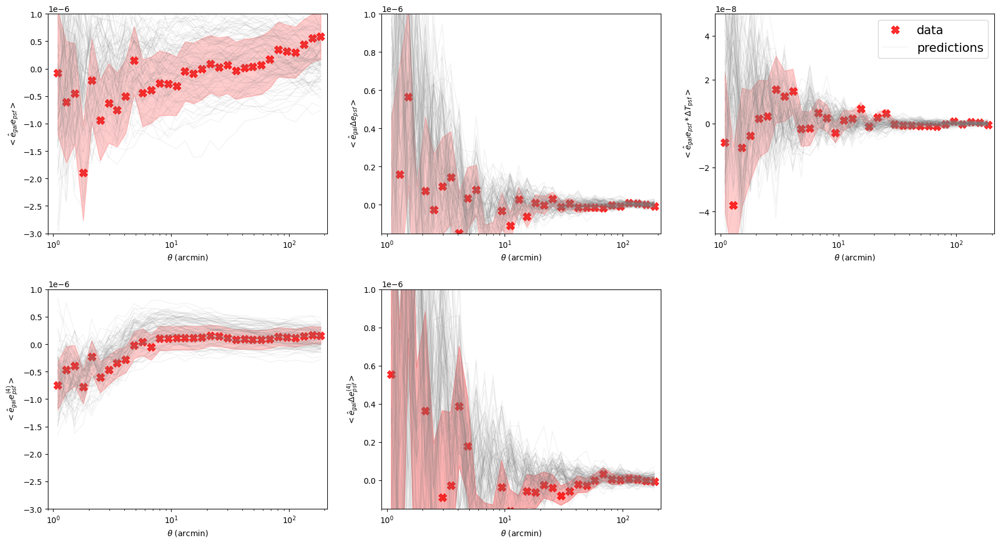

In [14]:
five_param_model = r'($\alpha, \beta, \alpha^{(4)}, \beta^{(4)}, \eta$) model'
plot_results(pp_corr, gp_corr, gp_corr_cov, r, five_param_model, predict=predictions, num_of_corr=num_of_corr)
chi2_list = []
for i,p in enumerate(predictions):
    chi2_dof = compute_chi2(pp_corr, observe_dv, gp_corr_cov, pp_joint_cov, param=params[i], pred=p, num_of_corr=num_of_corr)
    chi2_list.append(chi2_dof)
print(min(chi2_list))

In [ ]:
# df = (num_of_corr*nbins) - num_of_param
# print(df)

# chi2 = forward_model_ppcov(mean_params, observe_dv, gp_corr_cov, pp_corr_dv, pp_joint_cov, nbins, num_of_corr)
# p_value = 1 - stats.chi2.cdf(chi2 , df)
# print(chi2, chi2/df)
# print(p_value)

"""
bestfit_list = []
for i in range(num_of_corr):
    this_gp = np.zeros(nbins)
    for j in range(num_of_corr):
        this_gp += params[j] * pp_corr[i][j]

    bestfit_list.append(this_gp)
dv = np.array(bestfit_list)
"""

five_param_model = r'($\alpha, \beta, \alpha^{(4)}, \beta^{(4)}, \eta$) model'

matplotlib.rcParams.update({'font.size': 26, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = pplt.subplots(nrows=2,ncols=3,figsize = (18,10), sharex=False, sharey=False)


# leakage errors
gp_err = np.sqrt(np.diag(gp_corr_cov)[:nbins])
gp4_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[0,0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'blue' )
ax[0,0].fill_between(r , gp - gp_err, gp + gp_err, color = 'blue' , alpha = 0.2)
ax[0,0].plot(r, dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[0,0].set_xlim([0.9,210])
ax[0,0].set_ylim(-3e-6, 1e-6)
ax[0,0].set_xscale('log')
ax[0,0].set_xlabel(r'$\theta$ (arcmin)')
ax[0,0].set_ylabel(r'$<\hat{e}_{gal} e_{psf}>$')
# ax[0,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


ax[1,0].plot(r, gp4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{psf}>$' , color = 'red')
ax[1,0].fill_between(r, gp4 - gp4_err, gp4 + gp4_err,color = 'red' , alpha = 0.2)
ax[1,0].plot(r, dv[2], 'o-', linewidth = 2, alpha = 0.7, label = five_param_model, color = 'red')
ax[1,0].set_xlim([0.9,210])
ax[1,0].set_ylim(-3e-6, 1e-6)
# ax[0].set_title('leakage')
ax[1,0].set_xscale('log')
ax[1,0].set_xlabel(r'$\theta$ (arcmin)')
ax[1,0].set_ylabel(r'$<\hat{e}_{gal} e^{(4)}_{psf}>$')
# ax[1,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])
gq4_err = np.sqrt(np.diag(gp_corr_cov)[3*nbins:4*nbins])

ax[0,1].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'blue')
ax[0,1].fill_between(r , gq - gq_err, gq + gq_err, color = 'blue' , alpha = 0.2)
ax[0,1].plot(r, dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[0,1].set_xlim([0.9,210])
ax[0,1].set_ylim(-1.5e-7, 1e-6)
ax[0,1].set_xscale('log')
ax[0,1].set_xlabel(r'$\theta$ (arcmin)')
ax[0,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e_{psf}>$')
# ax[0,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[1,1].plot(r, gq4, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$' , color = 'red')
ax[1,1].fill_between(r, gq4 - gq4_err, gq4 + gq4_err,color = 'red' , alpha = 0.3)
ax[1,1].plot(r, dv[3], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'red')
ax[1,1].set_xlim([0.9,210])
ax[1,1].set_ylim(-1.5e-7, 1e-6)
ax[1,1].set_xscale('log')
ax[1,1].set_xlabel(r'$\theta$ (arcmin)')
ax[1,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$')
# ax[1,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# leakage errors
gw_err = np.sqrt(np.diag(gp_corr_cov)[4*nbins:5*nbins])

ax[0,2].plot(r, gw, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{\rm psf}*\Delta T_{\rm psf}>$' , color = 'blue' )
ax[0,2].fill_between(r , gw - gw_err, gw + gw_err, color = 'blue' , alpha = 0.2)
ax[0,2].plot(r, dv[4], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[0,2].set_xlim([0.9,210])
ax[0,2].set_ylim(-0.5e-7, 0.5e-7)
ax[0,2].set_xscale('log')
ax[0,2].set_xlabel(r'$\theta$ (arcmin)')
ax[0,2].set_ylabel(r'$<\hat{e}_{gal} e_{psf}*\Delta T_{\rm psf}>$')
# ax[0,2].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


# plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v5/psf_systematics_bestfitxip_model_bootstrap_const_weighted_fullcov.png', bbox_inches='tight')

# Model fit with a function (alpha, beta, eta) (07/17/2023)

In [20]:
outpath = "/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v5b/rho_tau_stats/median_galaxy_color/newcat_abe_071723/"
chain, dv, tau_data = run_model_fit(outpath, "flatchain.txt", 3)

       message: Optimization terminated successfully.
       success: True
        status: 0
           fun: 167.56067175905957
             x: [-4.532e-03  2.267e+00 -3.170e+00]
           nit: 227
          nfev: 396
 final_simplex: (array([[-4.532e-03,  2.267e+00, -3.170e+00],
                       [-4.532e-03,  2.267e+00, -3.169e+00],
                       [-4.532e-03,  2.267e+00, -3.170e+00],
                       [-4.532e-03,  2.267e+00, -3.169e+00]]), array([ 1.676e+02,  1.676e+02,  1.676e+02,  1.676e+02])) 167.56067175905957 [-0.00453195  2.26730224 -3.16950916]


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

93
169.12197456362367 1.8185158555228351
2.3860327899027922e-06


Text(0, 0.5, '$<\\hat{e}_{gal} e_{psf}*\\Delta T_{\\rm psf}>$')

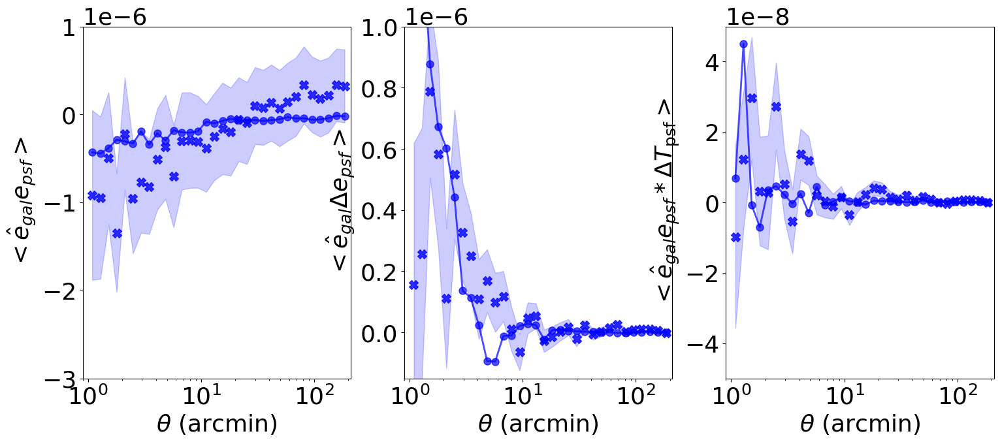

In [23]:
three_param_model = r'($\alpha, \beta, \eta$) model'

matplotlib.rcParams.update({'font.size': 26, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = plt.subplots(nrows=1,ncols=3,figsize = (18,7), sharex=False, sharey=False)

nbins = 32
gp = tau_data[0]
gq = tau_data[1]
gw = tau_data[2]
gp_corr_cov = tau_data[3]
r = tau_data[4]


# leakage errors
gp_err = np.sqrt(np.diag(gp_corr_cov)[:nbins])

ax[0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'blue' )
ax[0].fill_between(r , gp - gp_err, gp + gp_err, color = 'blue' , alpha = 0.2)
ax[0].plot(r, dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = three_param_model, color = 'blue')
ax[0].set_xlim([0.9,210])
ax[0].set_ylim(-3e-6, 1e-6)
ax[0].set_xscale('log')
ax[0].set_xlabel(r'$\theta$ (arcmin)')
ax[0].set_ylabel(r'$<\hat{e}_{gal} e_{psf}>$')
# ax[0,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])

ax[1].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'blue')
ax[1].fill_between(r , gq - gq_err, gq + gq_err, color = 'blue' , alpha = 0.2)
ax[1].plot(r, dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = three_param_model, color = 'blue')
ax[1].set_xlim([0.9,210])
ax[1].set_ylim(-1.5e-7, 1e-6)
ax[1].set_xscale('log')
ax[1].set_xlabel(r'$\theta$ (arcmin)')
ax[1].set_ylabel(r'$<\hat{e}_{gal} \Delta e_{psf}>$')
# ax[0,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


# leakage errors
gw_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[2].plot(r, gw, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{\rm psf}*\Delta T_{\rm psf}>$' , color = 'blue' )
ax[2].fill_between(r , gw - gw_err, gw + gw_err, color = 'blue' , alpha = 0.2)
ax[2].plot(r, dv[2], 'o-', linewidth = 2,alpha = 0.7,  label = three_param_model, color = 'blue')
ax[2].set_xlim([0.9,210])
ax[2].set_ylim(-0.5e-7, 0.5e-7)
ax[2].set_xscale('log')
ax[2].set_xlabel(r'$\theta$ (arcmin)')
ax[2].set_ylabel(r'$<\hat{e}_{gal} e_{psf}*\Delta T_{\rm psf}>$')
# ax[0,2].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


# plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v5/psf_systematics_bestfitxip_model_bootstrap_const_weighted_fullcov.png', bbox_inches='tight')

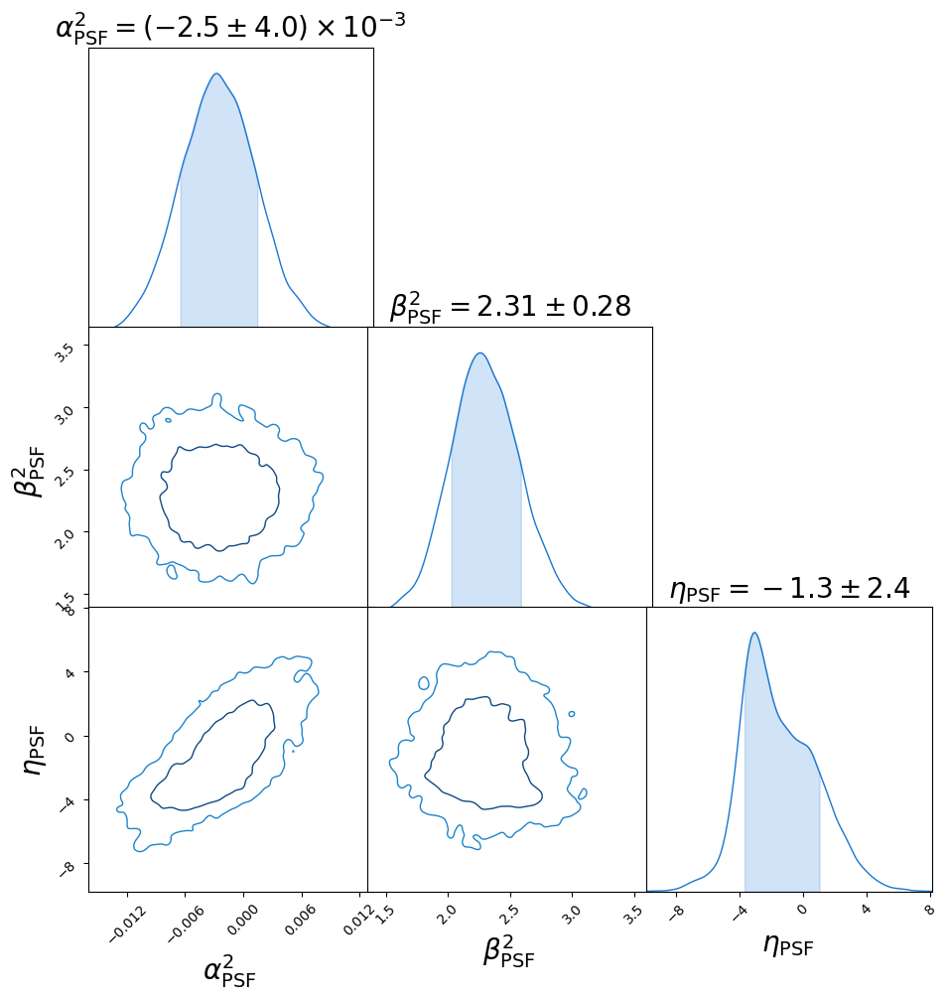

In [24]:
from chainconsumer import ChainConsumer
c  = ChainConsumer()
c.add_chain(chain, parameters=[r'$\alpha^2_\mathrm{PSF}$',r'$\beta^2_\mathrm{PSF}$','$\eta_\mathrm{PSF}$'],kde=0., shade=False, color='blue', plot_point=False,)
c.configure(global_point=True,statistics='mean',label_font_size=20,)

plt.close()
fig = c.plotter.plot(figsize="PAGE")
stat=c.analysis.get_summary()

fig.subplots_adjust(wspace=-0.02,hspace=-0.02)
# plt.savefig('/tigress/rdalal/fourier_space_shear/PSF_systematics/fourth_moment_coadd_alpha_beta_snr_cut_lmin_300_lmax_1800_final.png')
# gc.collect()

# Model fit with a function (07/12/2023)

In [54]:
outpath = "/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v5b/rho_tau_stats/median_galaxy_color/newstarcat_eta_071123/"
chain, dv, tau_data = run_model_fit(outpath, "flatchain_hartlap.txt", 5, sim=True, ppcov=True)

(160, 160)
       message: Optimization terminated successfully.
       success: True
        status: 0
           fun: 95.2350043569223
             x: [ 1.136e-02  1.384e+00  3.112e-02  2.357e+00  1.004e+00]
           nit: 371
          nfev: 593
 final_simplex: (array([[ 1.136e-02,  1.384e+00, ...,  2.357e+00,
                         1.004e+00],
                       [ 1.136e-02,  1.384e+00, ...,  2.357e+00,
                         1.004e+00],
                       ...,
                       [ 1.136e-02,  1.384e+00, ...,  2.356e+00,
                         1.004e+00],
                       [ 1.136e-02,  1.384e+00, ...,  2.356e+00,
                         1.004e+00]]), array([ 9.524e+01,  9.524e+01,  9.524e+01,  9.524e+01,
                        9.524e+01,  9.524e+01])) 95.2350043569223 [0.01136081 1.38424412 0.03112291 2.35653083 1.00404233]


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

155
94.61862731382594 0.6104427568633931
0.9999649502774308


Text(0, 0.5, '$<\\hat{e}_{gal} e_{psf}*\\Delta T_{\\rm psf}>$')

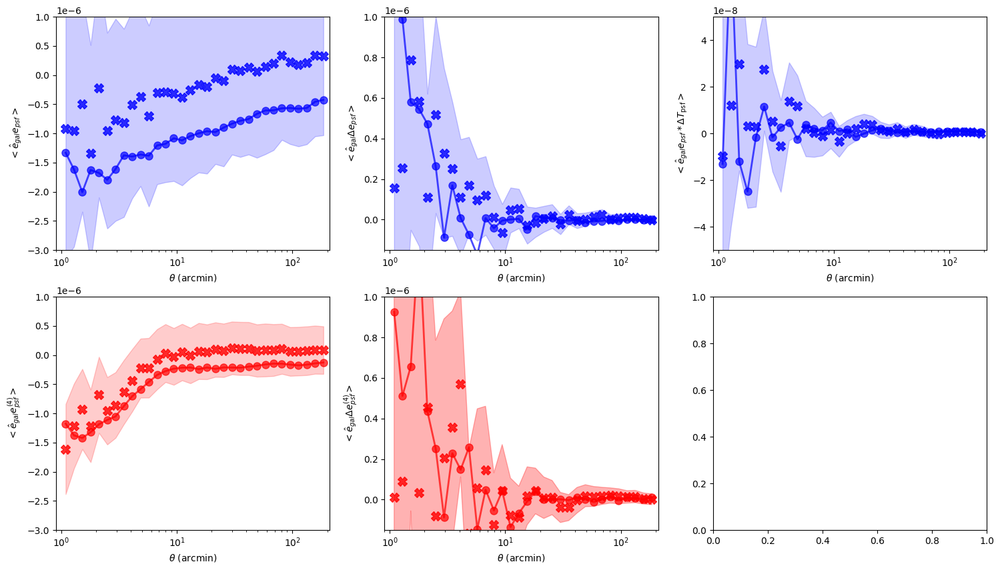

In [58]:
five_param_model = r'($\alpha, \beta, \alpha^{(4)}, \beta^{(4)}, \eta$) model'

matplotlib.rcParams.update({'font.size': 26, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = plt.subplots(nrows=2,ncols=3,figsize = (18,10), sharex=False, sharey=False)

nbins = 32
gp = tau_data[0]
gq = tau_data[1]
gp4 = tau_data[2]
gq4 = tau_data[3]
gw = tau_data[4]
gp_corr_cov = tau_data[5]
r = tau_data[6]


# leakage errors
gp_err = np.sqrt(np.diag(gp_corr_cov)[:nbins])
gp4_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[0,0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'blue' )
ax[0,0].fill_between(r , gp - gp_err, gp + gp_err, color = 'blue' , alpha = 0.2)
ax[0,0].plot(r, dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[0,0].set_xlim([0.9,210])
ax[0,0].set_ylim(-3e-6, 1e-6)
ax[0,0].set_xscale('log')
ax[0,0].set_xlabel(r'$\theta$ (arcmin)')
ax[0,0].set_ylabel(r'$<\hat{e}_{gal} e_{psf}>$')
# ax[0,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


ax[1,0].plot(r, gp4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{psf}>$' , color = 'red')
ax[1,0].fill_between(r, gp4 - gp4_err, gp4 + gp4_err,color = 'red' , alpha = 0.2)
ax[1,0].plot(r, dv[2], 'o-', linewidth = 2, alpha = 0.7, label = five_param_model, color = 'red')
ax[1,0].set_xlim([0.9,210])
ax[1,0].set_ylim(-3e-6, 1e-6)
# ax[0].set_title('leakage')
ax[1,0].set_xscale('log')
ax[1,0].set_xlabel(r'$\theta$ (arcmin)')
ax[1,0].set_ylabel(r'$<\hat{e}_{gal} e^{(4)}_{psf}>$')
# ax[1,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])
gq4_err = np.sqrt(np.diag(gp_corr_cov)[3*nbins:4*nbins])

ax[0,1].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'blue')
ax[0,1].fill_between(r , gq - gq_err, gq + gq_err, color = 'blue' , alpha = 0.2)
ax[0,1].plot(r, dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[0,1].set_xlim([0.9,210])
ax[0,1].set_ylim(-1.5e-7, 1e-6)
ax[0,1].set_xscale('log')
ax[0,1].set_xlabel(r'$\theta$ (arcmin)')
ax[0,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e_{psf}>$')
# ax[0,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[1,1].plot(r, gq4, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$' , color = 'red')
ax[1,1].fill_between(r, gq4 - gq4_err, gq4 + gq4_err,color = 'red' , alpha = 0.3)
ax[1,1].plot(r, dv[3], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'red')
ax[1,1].set_xlim([0.9,210])
ax[1,1].set_ylim(-1.5e-7, 1e-6)
ax[1,1].set_xscale('log')
ax[1,1].set_xlabel(r'$\theta$ (arcmin)')
ax[1,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$')
# ax[1,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# leakage errors
gw_err = np.sqrt(np.diag(gp_corr_cov)[4*nbins:5*nbins])

ax[0,2].plot(r, gw, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{\rm psf}*\Delta T_{\rm psf}>$' , color = 'blue' )
ax[0,2].fill_between(r , gw - gw_err, gw + gw_err, color = 'blue' , alpha = 0.2)
ax[0,2].plot(r, dv[4], 'o-', linewidth = 2,alpha = 0.7,  label = five_param_model, color = 'blue')
ax[0,2].set_xlim([0.9,210])
ax[0,2].set_ylim(-0.5e-7, 0.5e-7)
ax[0,2].set_xscale('log')
ax[0,2].set_xlabel(r'$\theta$ (arcmin)')
ax[0,2].set_ylabel(r'$<\hat{e}_{gal} e_{psf}*\Delta T_{\rm psf}>$')
# ax[0,2].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


# plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v5/psf_systematics_bestfitxip_model_bootstrap_const_weighted_fullcov.png', bbox_inches='tight')

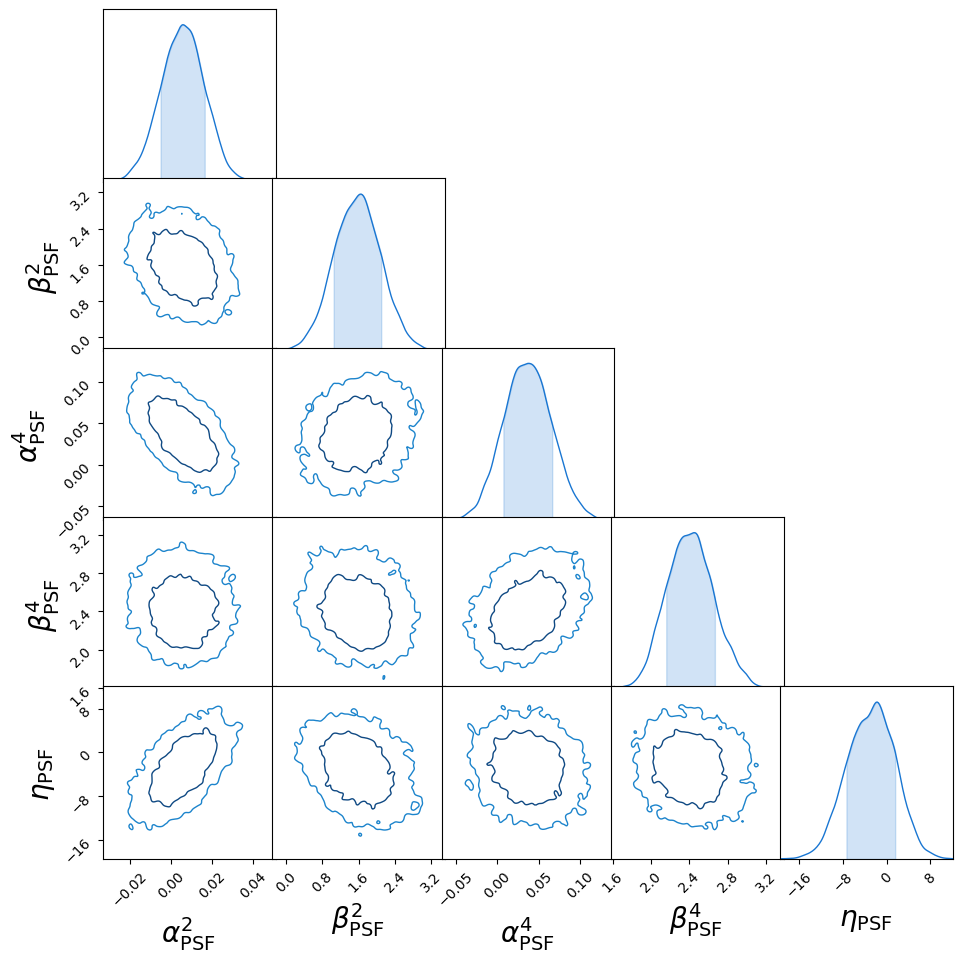

In [56]:
from chainconsumer import ChainConsumer
c  = ChainConsumer()
c.add_chain(chain, parameters=[r'$\alpha^2_\mathrm{PSF}$',r'$\beta^2_\mathrm{PSF}$',r'$\alpha^4_\mathrm{PSF}$',r'$\beta^4_\mathrm{PSF}$','$\eta_\mathrm{PSF}$'],kde=0., shade=False, color='blue', plot_point=False,)
c.configure(global_point=True,statistics='mean',label_font_size=20,)

plt.close()
fig = c.plotter.plot(figsize="PAGE")
stat=c.analysis.get_summary()

fig.subplots_adjust(wspace=-0.02,hspace=-0.02)
# plt.savefig('/tigress/rdalal/fourier_space_shear/PSF_systematics/fourth_moment_coadd_alpha_beta_snr_cut_lmin_300_lmax_1800_final.png')
# gc.collect()

# Model (alpha, beta, alpha4, beta4, eta; without constant)

In [54]:
def forward_model(param, pg, cov_inv, pp, nbins, num_of_corr):
    n_b = nbins
    gp_theory = np.zeros(shape = (num_of_corr,n_b))

    # i is row, j is column
    for i in range(num_of_corr):
        this_gp = np.zeros(n_b)
        for j in range(num_of_corr):
            this_gp += param[j] * pp[i][j]
        
        gp_theory[i] = this_gp
    
    gp_theory_db = gp_theory.reshape(-1)
    res=gp_theory_db - pg
    
    #slice is angular scale cut
    slice_ = []
    for i in range(num_of_corr):
        slice_.append(np.arange(0, 32) + i*32)
    slice_ = np.array(slice_).reshape(-1)
    res = res[slice_]
    
    #invert covariance first before calling this function
    #use covariance after scale cut
    chi2=res.T @ cov_inv @ res
    return chi2

def get_prior(param):
    a,b,a4,b4,eta = param
    # boo = abs(a)>1e-8 or abs(b)>1e-8 or abs(a4)>1e-8 or abs(b4)>1e-8
    # if boo:
    #     return np.inf
    if abs(a)<1 and abs(b)<5 and abs(a4)<1 and abs(b4)<5 and abs(eta)<20:
        return 0
    # print(param, 'out of bounds')
    return -np.inf

def log_prob(param, pg, cov_inv, pp, nbins, num_of_corr):
    prior = get_prior(param)
    if not np.isfinite(prior):
        return -np.inf
    loss = forward_model(param, pg, cov_inv, pp, nbins, num_of_corr)
    return -0.5 * loss


def construct_param_matrix(param, num_of_corr, nbins, parametrize=True):

    if parametrize: 
        res = np.zeros(shape=(num_of_corr*nbins, num_of_corr*num_of_corr*nbins))

        basic_block = np.zeros(shape=(nbins, num_of_corr*nbins))
        for i in range(num_of_corr):
            basic_block[0:nbins, i * nbins : (i + 1) * nbins] = np.diag([param[i]] * nbins)

        for i in range(num_of_corr):
            res[i * nbins : (i + 1) * nbins, i*num_of_corr*nbins : (i + 1)*num_of_corr*nbins] = basic_block
    else:
        res = np.ones(shape=(num_of_corr*nbins, num_of_corr*num_of_corr*nbins))

    return res

def forward_model_ppcov(param, pg, cov, pp, pp_joint_cov, nbins, num_of_corr):
    
    prior = get_prior(param)
    
    n_b = nbins
    gp_theory = np.zeros(shape = (num_of_corr,n_b))
    
    # include pp cov
    param_matrix = construct_param_matrix(param, num_of_corr, nbins)
    pp_cov = np.zeros(shape=(num_of_corr*nbins, num_of_corr*nbins))
    pp_cov[0:num_of_corr*nbins, 0:num_of_corr*nbins] = (param_matrix @ pp_joint_cov) @ param_matrix.T


    # i is row, j is column
    for i in range(num_of_corr):
        this_gp = np.zeros(n_b)
        for j in range(num_of_corr):
            this_gp += param[j] * pp[i][j]
        
        gp_theory[i] = this_gp
    
    
    gp_theory_db = gp_theory.reshape(-1)
    # gp_theory_db = np.concatenate([gp_theory.reshape(-1), np.array([e1gal_theory, e2gal_theory])])
    res=gp_theory_db - pg
    
    #slice is angular scale cut
    slice_ = []
    for i in range(num_of_corr):
        slice_.append(np.arange(0, 32) + i*32)
    slice_ = np.array(slice_).reshape(-1)
    # slice_ = np.concatenate([slice_, np.array([128,129])])
    
    res = res[slice_]
    new_cov = (cov + pp_cov)[slice_,:][:,slice_]
    cov_inv = np.linalg.inv(new_cov)
    logdet = np.linalg.slogdet(new_cov)
    
    #invert covariance first before calling this function
    #use covariance after scale cut
    chi2=res.dot(cov_inv).dot(res)
    return chi2+prior+logdet

def log_prob_ppcov(param, pg, cov, pp, pp_joint_cov, nbins, num_of_corr):
    
    loss = forward_model_ppcov(param, pg, cov, pp, pp_joint_cov, nbins, num_of_corr)
    return -0.5 * loss

In [55]:
# Read in galaxy-PSF, PSF-PSF correlations
outpath = "/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v5b/rho_tau_stats/median_galaxy_color/newstarcat_eta_071123/"
with open(outpath+"full_correlation_psf.pkl", "rb") as f:
    (   r,
        gp_corr,
        pp_corr,
        psf_const1,
        psf_const2,
        egal_mean,
        pp_corr_cov,
        pp_joint_cov,
        gp_corr_cov
    ) = pickle.load(f)
scale_cut = 0
r_ = r[scale_cut:]
num_of_corr = 5
slice_skip = 1
nbins = 32

# pp = pp_corr[0,0,:]; pq = pp_corr[0,1,:]; pp4 = pp_corr[0,2,:]; pq4 = pp_corr[0,3,:]
# qp = pp_corr[1,0,:]; qq = pp_corr[1,1,:]; qp4 = pp_corr[1,2,:]; qq4 = pp_corr[1,3,:]
# p4p = pp_corr[2,0,:]; p4q = pp_corr[2,1,:]; p4p4 = pp_corr[2,2,:]; p4q4 = pp_corr[2,3,:]
# q4p = pp_corr[3,0,:]; q4q = pp_corr[3,1,:]; q4p4 = pp_corr[3,2,:]; q4q4 = pp_corr[3,3,:]

gp = gp_corr[0, :] #- (egal_mean[0]*psf_const1[0] + egal_mean[1]*psf_const2[0])
gq = gp_corr[1, :] #- (egal_mean[0]*psf_const1[1] + egal_mean[1]*psf_const2[1])
gp4 = gp_corr[2, :] #- (egal_mean[0]*psf_const1[2] + egal_mean[1]*psf_const2[2])
gq4 = gp_corr[3, :] #- (egal_mean[0]*psf_const1[3] + egal_mean[1]*psf_const2[3])
gw = gp_corr[4, :]

gp_corr_cov = np.loadtxt(outpath + "gp_covariance_psf.txt")
# gp_corr_cov = np.diag(np.diag(gp_corr_cov))
# gp_corr_cov_ = np.zeros((128, 128))
# for i in range(num_of_corr):
#     gp_corr_cov_[i*nbins:(i+1)*nbins, i*nbins:(i+1)*nbins] = gp_corr_cov[i,:,:]

In [49]:
pp_joint_cov.shape

(800, 800)

In [57]:
#run mcmc
ppcov = True
num_of_param = num_of_corr
bounds = [(-np.inf, np.inf),(-np.inf, np.inf),(-np.inf, np.inf),(-np.inf, np.inf),(-np.inf, np.inf)]

observe_dv = np.concatenate((gp, gq, gp4, gq4, gw))
# observe_dv = np.concatenate((gp, gp4))
pp_corr_dv = pp_corr

if ppcov:
    best_fit = scipy.optimize.minimize(forward_model_ppcov, 
                                       x0=np.zeros(num_of_param), 
                                       # bounds=bounds,
                                       method='Nelder-Mead',
                                       args=(observe_dv, gp_corr_cov, pp_corr_dv, pp_joint_cov, nbins, num_of_corr))
else:
    slice_ = []
    for i in range(num_of_corr):
        slice_.append(np.arange(scale_cut, nbins) + i*slice_skip*nbins)
    slice_ = np.array(slice_).reshape(-1)

    gp_corr_cov_ = gp_corr_cov[slice_, :][:, slice_]
    covI = np.linalg.inv(gp_corr_cov_)
    best_fit = scipy.optimize.minimize(forward_model, 
                                       x0=np.zeros(num_of_param), 
                                       # bounds=bounds,
                                       method='Nelder-Mead',
                                       args=(observe_dv, covI, pp_corr_dv, nbins, num_of_corr))
print(best_fit.fun, best_fit.x)


nwalkers=50
pos = best_fit.x + np.random.randn(nwalkers, num_of_param)*1e-10

if ppcov:
    sampler = emcee.EnsembleSampler(nwalkers, num_of_param, log_prob_ppcov, args=(observe_dv, gp_corr_cov, pp_corr_dv, pp_joint_cov, nbins, num_of_corr))
else:
    sampler = emcee.EnsembleSampler(nwalkers, num_of_param, log_prob, args=(observe_dv, covI, pp_corr_dv, nbins, num_of_corr))

# print(pos)
state = sampler.run_mcmc(pos, 5000)
flatchain=sampler.get_chain(discard=200, thin=25, flat=True)

mean_params = np.mean(flatchain,axis = 0)

from IPython.display import display, Math
labels = [r'$\alpha$', r'$\beta$', r'$\alpha^4$', r'$\beta^4$', r'$\eta$']
for i in range(num_of_param):
    mcmc = np.percentile(flatchain[:, i], [16, 50, 84])
    q = np.diff(mcmc)
    txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
    txt = txt.format(mcmc[1], q[0], q[1], labels[i])
    display(Math(txt))



# if self.save_chain == True:
#     filename = '{}_chain_{}_const={}.txt'.format(self.prefix, self.mode, constant_mode )

#     np.savetxt(self.chain_root+filename, flatchain)

df = (num_of_corr*nbins) - 5
print(df)

if ppcov:
    chi2 = forward_model_ppcov(mean_params, observe_dv, gp_corr_cov, pp_corr_dv, pp_joint_cov, nbins, num_of_corr)
else:
    chi2 = forward_model(mean_params, observe_dv ,covI, pp_corr_dv, nbins, num_of_corr)
p_value = 1 - stats.chi2.cdf(chi2 , df)
print(chi2, chi2/df)
print(p_value)


bestfit_list = []
for i in range(num_of_corr):
    this_gp = np.zeros(nbins)
    for j in range(num_of_corr):
        this_gp += mean_params[j] * pp_corr[i][j]

    bestfit_list.append(this_gp)

bestfit_dv = np.array(bestfit_list)

801.1893883056857 [ 0.01656824  1.33491479 -0.04818197  1.33066062 -4.32047461]


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

155
-inf -inf
1.0


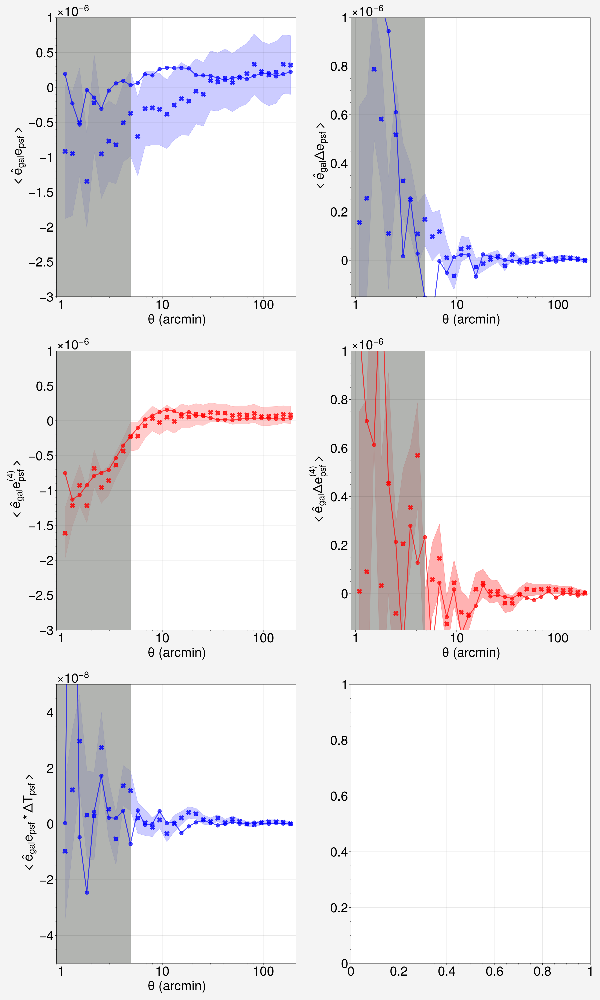

In [51]:
four_param_model = r'($\alpha, \beta, \alpha^{(4)}, \beta^{(4)}, \eta$) model'
two_param_model = r'($\alpha, \beta$) model'

matplotlib.rcParams.update({'font.size': 26, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = pplt.subplots(nrows=3,ncols=2,figsize = (18,30), sharex=False, sharey=False)

# leakage errors
gp_err = np.sqrt(np.diag(gp_corr_cov)[:nbins])
gp4_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[0,0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'blue' )
ax[0,0].fill_between(r , gp - gp_err, gp + gp_err, color = 'blue' , alpha = 0.2)
ax[0,0].plot(r, bestfit_dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = four_param_model, color = 'blue')
ax[0,0].set_xlim([0.9,210])
ax[0,0].set_ylim(-3e-6, 1e-6)
ax[0,0].set_xscale('log')
ax[0,0].set_xlabel(r'$\theta$ (arcmin)')
ax[0,0].set_ylabel(r'$<\hat{e}_{gal} e_{psf}>$')
ax[0,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


ax[1,0].plot(r, gp4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{psf}>$' , color = 'red')
ax[1,0].fill_between(r, gp4 - gp4_err, gp4 + gp4_err,color = 'red' , alpha = 0.2)
ax[1,0].plot(r, bestfit_dv[2], 'o-', linewidth = 2, alpha = 0.7, label = four_param_model, color = 'red')
ax[1,0].set_xlim([0.9,210])
ax[1,0].set_ylim(-3e-6, 1e-6)
# ax[0].set_title('leakage')
ax[1,0].set_xscale('log')
ax[1,0].set_xlabel(r'$\theta$ (arcmin)')
ax[1,0].set_ylabel(r'$<\hat{e}_{gal} e^{(4)}_{psf}>$')
ax[1,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])
gq4_err = np.sqrt(np.diag(gp_corr_cov)[3*nbins:4*nbins])

ax[0,1].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'blue')
ax[0,1].fill_between(r , gq - gq_err, gq + gq_err, color = 'blue' , alpha = 0.2)
ax[0,1].plot(r, bestfit_dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = four_param_model, color = 'blue')
ax[0,1].set_xlim([0.9,210])
ax[0,1].set_ylim(-1.5e-7, 1e-6)
ax[0,1].set_xscale('log')
ax[0,1].set_xlabel(r'$\theta$ (arcmin)')
ax[0,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e_{psf}>$')
ax[0,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[1,1].plot(r, gq4, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$' , color = 'red')
ax[1,1].fill_between(r, gq4 - gq4_err, gq4 + gq4_err,color = 'red' , alpha = 0.3)
ax[1,1].plot(r, bestfit_dv[3], 'o-', linewidth = 2,alpha = 0.7,  label = four_param_model, color = 'red')
ax[1,1].set_xlim([0.9,210])
ax[1,1].set_ylim(-1.5e-7, 1e-6)
ax[1,1].set_xscale('log')
ax[1,1].set_xlabel(r'$\theta$ (arcmin)')
ax[1,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$')
ax[1,1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# leakage errors
gw_err = np.sqrt(np.diag(gp_corr_cov)[4*nbins:5*nbins])

ax[2,0].plot(r, gw, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{\rm psf}*\Delta T_{\rm psf}>$' , color = 'blue' )
ax[2,0].fill_between(r , gw - gw_err, gw + gw_err, color = 'blue' , alpha = 0.2)
ax[2,0].plot(r, bestfit_dv[4], 'o-', linewidth = 2,alpha = 0.7,  label = four_param_model, color = 'blue')
ax[2,0].set_xlim([0.9,210])
ax[2,0].set_ylim(-0.5e-7, 0.5e-7)
ax[2,0].set_xscale('log')
ax[2,0].set_xlabel(r'$\theta$ (arcmin)')
ax[2,0].set_ylabel(r'$<\hat{e}_{gal} e_{psf}*\Delta T_{\rm psf}>$')
ax[2,0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)


# plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v5/psf_systematics_bestfitxip_model_bootstrap_const_weighted_fullcov.png', bbox_inches='tight')

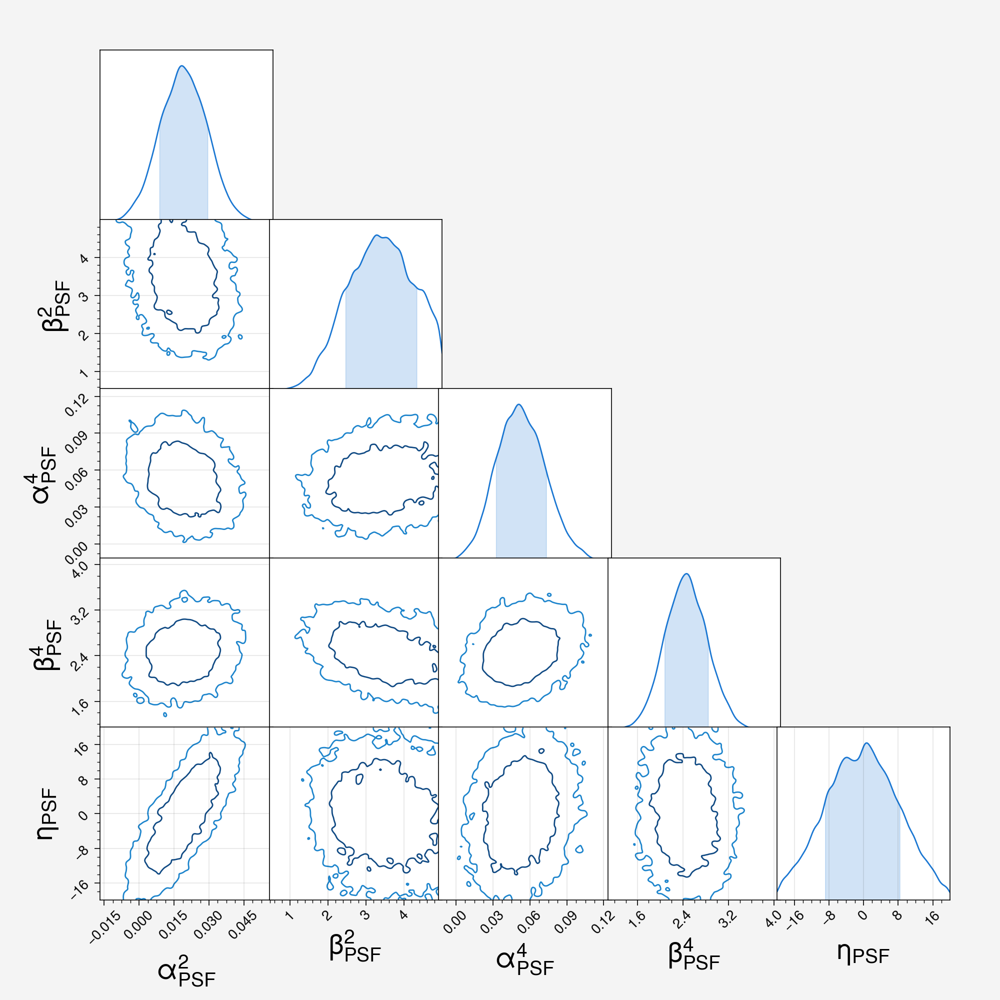

In [52]:
from chainconsumer import ChainConsumer
c  = ChainConsumer()
c.add_chain(flatchain, parameters=[r'$\alpha^2_\mathrm{PSF}$',r'$\beta^2_\mathrm{PSF}$',r'$\alpha^4_\mathrm{PSF}$',r'$\beta^4_\mathrm{PSF}$','$\eta_\mathrm{PSF}$'],kde=0., shade=False, color='blue', plot_point=False,)
c.configure(global_point=True,statistics='mean',label_font_size=20,)

plt.close()
fig = c.plotter.plot(figsize="PAGE")
stat=c.analysis.get_summary()

fig.subplots_adjust(wspace=-0.02,hspace=-0.02)
# plt.savefig('/tigress/rdalal/fourier_space_shear/PSF_systematics/fourth_moment_coadd_alpha_beta_snr_cut_lmin_300_lmax_1800_final.png')
# gc.collect()

# Model (alpha, beta, eta; without constant)

In [ ]:
def forward_model(param, pg, cov_inv, pp, nbins, num_of_corr):
    n_b = nbins
    gp_theory = np.zeros(shape = (num_of_corr,n_b))

    # i is row, j is column
    for i in range(num_of_corr):
        this_gp = np.zeros(n_b)
        for j in range(num_of_corr):
            this_gp += param[j] * pp[i][j]
        
        gp_theory[i] = this_gp
    
    gp_theory_db = gp_theory.reshape(-1)
    res=gp_theory_db - pg
    
    #slice is angular scale cut
    slice_ = []
    for i in range(num_of_corr):
        slice_.append(np.arange(0, 32) + i*32)
    slice_ = np.array(slice_).reshape(-1)
    res = res[slice_]
    
    #invert covariance first before calling this function
    #use covariance after scale cut
    chi2=res.T @ cov_inv @ res
    return chi2

def get_prior(param):
    a,b,eta = param
    if abs(a)<1 and abs(b)<5 and abs(eta)<10:
        return 0
    print(param, 'out of bounds')
    return -np.inf

def log_prob(param, pg, cov_inv, pp, nbins, num_of_corr):
    prior = get_prior(param)
    if not np.isfinite(prior):
        return -np.inf
    loss = forward_model(param, pg, cov_inv, pp, nbins, num_of_corr)
    return -0.5 * loss + prior


def construct_param_matrix(param, num_of_corr, nbins, parametrize=True):

    if parametrize: 
        res = np.zeros(shape=(num_of_corr*nbins, num_of_corr*num_of_corr*nbins))

        basic_block = np.zeros(shape=(nbins, num_of_corr*nbins))
        for i in range(num_of_corr):
            basic_block[0:nbins, i * nbins : (i + 1) * nbins] = np.diag([param[i]] * nbins)

        for i in range(num_of_corr):
            res[i * nbins : (i + 1) * nbins, i*num_of_corr*nbins : (i + 1)*num_of_corr*nbins] = basic_block
    else:
        res = np.ones(shape=(num_of_corr*nbins, num_of_corr*num_of_corr*nbins))

    return res

def forward_model_ppcov(param, pg, cov, pp, pp_joint_cov, nbins, num_of_corr):
    
    n_b = nbins
    gp_theory = np.zeros(shape = (num_of_corr,n_b))
    
    # include pp cov
    param_matrix = construct_param_matrix(param, num_of_corr, nbins)
    pp_cov = np.zeros(shape=(num_of_corr*nbins, num_of_corr*nbins))
    pp_cov[0:num_of_corr*nbins, 0:num_of_corr*nbins] = (param_matrix @ pp_joint_cov) @ param_matrix.T


    # i is row, j is column
    for i in range(num_of_corr):
        this_gp = np.zeros(n_b)
        for j in range(num_of_corr):
            this_gp += param[j] * pp[i][j]
        
        gp_theory[i] = this_gp
    
    
    gp_theory_db = gp_theory.reshape(-1)
    # gp_theory_db = np.concatenate([gp_theory.reshape(-1), np.array([e1gal_theory, e2gal_theory])])
    res=gp_theory_db - pg
    
    #slice is angular scale cut
    slice_ = []
    for i in range(num_of_corr):
        slice_.append(np.arange(0, 32) + i*32)
    slice_ = np.array(slice_).reshape(-1)
    # slice_ = np.concatenate([slice_, np.array([128,129])])
    
    res = res[slice_]
    new_cov = (cov + pp_cov)[slice_,:][:,slice_]
    cov_inv = np.linalg.inv(new_cov)
    
    #invert covariance first before calling this function
    #use covariance after scale cut
    chi2=res.dot(cov_inv).dot(res)
    return chi2

def log_prob_ppcov(param, pg, cov, pp, pp_joint_cov, nbins, num_of_corr):
    # prior = get_prior(param)
    # if not np.isfinite(prior):
    #     return -np.inf
    loss = forward_model_ppcov(param, pg, cov, pp, pp_joint_cov, nbins, num_of_corr)
    return -0.5 * loss #+ prior

In [ ]:
# Read in galaxy-PSF, PSF-PSF correlations
outpath = "/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v5b/rho_tau_stats/median_galaxy_color/abe_fit_071123/"
with open(outpath+"full_correlation_psf.pkl", "rb") as f:
    (   r,
        gp_corr,
        pp_corr,
        psf_const1,
        psf_const2,
        egal_mean,
        pp_corr_cov,
        pp_joint_cov,
        gp_corr_cov
    ) = pickle.load(f)
scale_cut = 0
r_ = r[scale_cut:]
num_of_corr = 3
slice_skip = 1
nbins = 32

# pp = pp_corr[0,0,:]; pq = pp_corr[0,1,:]; pp4 = pp_corr[0,2,:]; pq4 = pp_corr[0,3,:]
# qp = pp_corr[1,0,:]; qq = pp_corr[1,1,:]; qp4 = pp_corr[1,2,:]; qq4 = pp_corr[1,3,:]
# p4p = pp_corr[2,0,:]; p4q = pp_corr[2,1,:]; p4p4 = pp_corr[2,2,:]; p4q4 = pp_corr[2,3,:]
# q4p = pp_corr[3,0,:]; q4q = pp_corr[3,1,:]; q4p4 = pp_corr[3,2,:]; q4q4 = pp_corr[3,3,:]

gp = gp_corr[0, :] #- (egal_mean[0]*psf_const1[0] + egal_mean[1]*psf_const2[0])
gq = gp_corr[1, :] #- (egal_mean[0]*psf_const1[1] + egal_mean[1]*psf_const2[1])
gw = gp_corr[2, :] #- (egal_mean[0]*psf_const1[2] + egal_mean[1]*psf_const2[2])

gp_corr_cov = np.loadtxt(outpath + "gp_covariance_psf.txt")
# gp_corr_cov = np.diag(np.diag(gp_corr_cov))
# gp_corr_cov_ = np.zeros((128, 128))
# for i in range(num_of_corr):
#     gp_corr_cov_[i*nbins:(i+1)*nbins, i*nbins:(i+1)*nbins] = gp_corr_cov[i,:,:]

In [ ]:
#run mcmc
ppcov = False
num_of_param = num_of_corr
bounds = [(-np.inf, np.inf),(-np.inf, np.inf),(-np.inf, np.inf)]

observe_dv = np.concatenate((gp, gq, gw))
# observe_dv = np.concatenate((gp, gp4))
pp_corr_dv = pp_corr

if ppcov:
    best_fit = scipy.optimize.minimize(forward_model_ppcov, 
                                       x0=np.zeros(num_of_param), 
                                       bounds=bounds,
                                       method='Nelder-Mead',
                                       args=(observe_dv, gp_corr_cov, pp_corr_dv, pp_joint_cov, nbins, num_of_corr))
else:
    slice_ = []
    for i in range(num_of_corr):
        slice_.append(np.arange(scale_cut, nbins) + i*slice_skip*nbins)
    slice_ = np.array(slice_).reshape(-1)

    gp_corr_cov_ = gp_corr_cov[slice_, :][:, slice_]
    covI = np.linalg.inv(gp_corr_cov_)
    best_fit = scipy.optimize.minimize(forward_model, 
                                       x0=np.zeros(num_of_param), 
                                       bounds=bounds,
                                       method='Nelder-Mead',
                                       args=(observe_dv, covI, pp_corr_dv, nbins, num_of_corr))
print(best_fit.fun, best_fit.x)


nwalkers=50
pos = best_fit.x + np.random.randn(nwalkers, num_of_param)*1e-4

if ppcov:
    sampler = emcee.EnsembleSampler(nwalkers, num_of_param, log_prob_ppcov, args=(observe_dv, gp_corr_cov, pp_corr_dv, pp_joint_cov, nbins, num_of_corr))
else:
    sampler = emcee.EnsembleSampler(nwalkers, num_of_param, log_prob, args=(observe_dv, covI, pp_corr_dv, nbins, num_of_corr))

# print(pos)
state = sampler.run_mcmc(pos, 5000)
flatchain=sampler.get_chain(discard=200, thin=25, flat=True)

mean_params = np.mean(flatchain,axis = 0)

from IPython.display import display, Math
labels = ['\alpha', '\beta', '\eta']
for i in range(num_of_param):
    mcmc = np.percentile(flatchain[:, i], [16, 50, 84])
    q = np.diff(mcmc)
    txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
    txt = txt.format(mcmc[1], q[0], q[1], labels[i])
    display(Math(txt))



# if self.save_chain == True:
#     filename = '{}_chain_{}_const={}.txt'.format(self.prefix, self.mode, constant_mode )

#     np.savetxt(self.chain_root+filename, flatchain)

df = (num_of_corr*nbins) - num_of_corr
print(df)

if ppcov:
    chi2 = forward_model_ppcov(mean_params, observe_dv, gp_corr_cov, pp_corr_dv, pp_joint_cov, nbins, num_of_corr)
else:
    chi2 = forward_model(mean_params, observe_dv ,covI, pp_corr_dv, nbins, num_of_corr)
p_value = 1 - stats.chi2.cdf(chi2 , df)
print(chi2, chi2/df)
print(p_value)


bestfit_list = []
for i in range(num_of_corr):
    this_gp = np.zeros(nbins)
    for j in range(num_of_corr):
        this_gp += mean_params[j] * pp_corr[i][j]

    bestfit_list.append(this_gp)

bestfit_dv = np.array(bestfit_list)

In [ ]:
four_param_model = r'($\alpha, \beta, \eta$) model'

matplotlib.rcParams.update({'font.size': 26, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = pplt.subplots(nrows=1,ncols=3,figsize = (18,6), sharex=False, sharey=False)

# leakage errors
gp_err = np.sqrt(np.diag(gp_corr_cov)[:nbins])

ax[0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'blue' )
ax[0].fill_between(r , gp - gp_err, gp + gp_err, color = 'blue' , alpha = 0.2)
ax[0].plot(r, bestfit_dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = four_param_model, color = 'blue')
ax[0].set_xlim([0.9,210])
ax[0].set_ylim(-3e-6, 1e-6)
ax[0].set_xscale('log')
ax[0].set_xlabel(r'$\theta$ (arcmin)')
ax[0].set_ylabel(r'$<\hat{e}_{gal} e_{psf}>$')

# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])

ax[1].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'blue')
ax[1].fill_between(r , gq - gq_err, gq + gq_err, color = 'blue' , alpha = 0.2)
ax[1].plot(r, bestfit_dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = four_param_model, color = 'blue')
ax[1].set_xlim([0.9,210])
ax[1].set_ylim(-1.5e-7, 1e-6)
ax[1].set_xscale('log')
ax[1].set_xlabel(r'$\theta$ (arcmin)')
ax[1].set_ylabel(r'$<\hat{e}_{gal} \Delta e_{psf}>$')


# leakage errors
gw_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[2].plot(r, gw, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{\rm psf}*\Delta T_{\rm psf}>$' , color = 'blue' )
ax[2].fill_between(r , gw - gw_err, gw + gw_err, color = 'blue' , alpha = 0.2)
ax[2].plot(r, bestfit_dv[2], 'o-', linewidth = 2,alpha = 0.7,  label = four_param_model, color = 'blue')
ax[2].set_xlim([0.9,210])
ax[2].set_ylim(-0.5e-7, 0.5e-7)
ax[2].set_xscale('log')
ax[2].set_xlabel(r'$\theta$ (arcmin)')
ax[2].set_ylabel(r'$<\hat{e}_{gal} e_{psf}*\Delta T_{\rm psf}>$')


# plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v5/psf_systematics_bestfitxip_model_bootstrap_const_weighted_fullcov.png', bbox_inches='tight')

In [ ]:
from chainconsumer import ChainConsumer
c  = ChainConsumer()
c.add_chain([flatchain[:,0],flatchain[:,1],flatchain[:,2]],
             parameters=[r'$\alpha_\mathrm{PSF}$',r'$\beta_\mathrm{PSF}$',r'$\eta_\mathrm{PSF}$'],kde=0., shade=False, color='blue', plot_point=False,)
c.configure(global_point=True,statistics='mean',label_font_size=20)

plt.close()
fig = c.plotter.plot(figsize="PAGE")
stat=c.analysis.get_summary()

fig.subplots_adjust(wspace=-0.02,hspace=-0.02)
# plt.savefig('/tigress/rdalal/fourier_space_shear/PSF_systematics/fourth_moment_coadd_alpha_beta_snr_cut_lmin_300_lmax_1800_final.png')
# gc.collect()

# Model (alpha, beta, alpha4, beta4, ec; includes constant)

In [ ]:
def forward_model_const(param, pg, cov_inv, pp, psf_const1, psf_const2, nbins, num_of_corr):
    n_b = nbins
    gp_theory = np.zeros(shape = (num_of_corr,n_b))

    # i is row, j is column
    for i in range(num_of_corr):
        this_gp = np.zeros(n_b)
        for j in range(num_of_corr):
            this_gp += param[j] * pp[i][j]
        
        this_gp+=param[-2]*psf_const1[i]
        this_gp+=param[-1]*psf_const2[i]
        gp_theory[i] = this_gp
    
    # add constant
    e1gal_theory = (
            np.sum([param[i] * psf_const1[i] for i in range(num_of_corr)])
            + param[-2]
        )
    e2gal_theory = (
            np.sum([param[i] * psf_const2[i] for i in range(num_of_corr)])
            + param[-1]
        )
    
    gp_theory_db = gp_theory.reshape(-1)
    # gp_theory_db = np.concatenate([gp_theory.reshape(-1), np.array([e1gal_theory, e2gal_theory])])
    res=gp_theory_db - pg
    
    #slice is angular scale cut
    slice_ = []
    for i in range(num_of_corr):
        slice_.append(np.arange(0, 32) + i*32)
    slice_ = np.array(slice_).reshape(-1)
    # slice_ = np.concatenate([slice_, np.array([128,129])])
    res = res[slice_]
    
    #invert covariance first before calling this function
    #use covariance after scale cut
    chi2=res.dot(cov_inv).dot(res)
    return chi2

def log_prob_const(param, pg, cov_inv, pp, psf_const1, psf_const2, nbins, num_of_corr):
    loss = forward_model_const(param, pg, cov_inv, pp, psf_const1, psf_const2, nbins, num_of_corr)
    return -0.5 * loss

def construct_param_matrix(param, num_of_corr, nbins, parametrize=False):

    if parametrize: 
        res = np.zeros(shape=(num_of_corr*nbins, 4*num_of_corr*nbins))

        basic_block = np.zeros(shape=(nbins, num_of_corr*nbins))
        for i in range(4):
            basic_block[0:nbins, i * nbins : (i + 1) * nbins] = np.diag([param[i]] * nbins)

        for i in range(4):
            res[i * nbins : (i + 1) * nbins, i*num_of_corr*nbins : (i + 1)*num_of_corr*nbins] = basic_block
    else:
        res = np.ones(shape=(num_of_corr*nbins, 4*num_of_corr*nbins))

    return res

def forward_model_const_ppcov(param, pg, cov, pp, pp_joint_cov, psf_const1, psf_const2, nbins, num_of_corr):
    
    n_b = nbins
    gp_theory = np.zeros(shape = (num_of_corr,n_b))
    
    # include pp cov
    param_matrix = construct_param_matrix(param, num_of_corr, nbins)
    pp_cov = np.zeros(shape=(num_of_corr*nbins + 2, num_of_corr*nbins + 2))
    pp_cov[0:num_of_corr*nbins, 0:num_of_corr*nbins] = (param_matrix @ pp_joint_cov) @ param_matrix.T


    # i is row, j is column
    for i in range(num_of_corr):
        this_gp = np.zeros(n_b)
        for j in range(num_of_corr):
            this_gp += param[j] * pp[i][j]
        
        this_gp+=param[-2]*psf_const1[i]
        this_gp+=param[-1]*psf_const2[i]
        gp_theory[i] = this_gp
    
    # add constant
    e1gal_theory = (
            np.sum([param[i] * psf_const1[i] for i in range(num_of_corr)])
            + param[-2]
        )
    e2gal_theory = (
            np.sum([param[i] * psf_const2[i] for i in range(num_of_corr)])
            + param[-1]
        )
    
    gp_theory_db = gp_theory.reshape(-1)
    # gp_theory_db = np.concatenate([gp_theory.reshape(-1), np.array([e1gal_theory, e2gal_theory])])
    res=gp_theory_db - pg
    
    #slice is angular scale cut
    slice_ = []
    for i in range(num_of_corr):
        slice_.append(np.arange(0, 32) + i*32)
    slice_ = np.array(slice_).reshape(-1)
    # slice_ = np.concatenate([slice_, np.array([128,129])])
    
    res = res[slice_]
    new_cov = (cov + pp_cov)[slice_,:][:,slice_]
    cov_inv = np.linalg.inv(new_cov)
    
    #invert covariance first before calling this function
    #use covariance after scale cut
    chi2=res.dot(cov_inv).dot(res)
    return chi2

def log_prob_const_ppcov(param, pg, cov, pp, pp_joint_cov, psf_const1, psf_const2, nbins, num_of_corr):
    loss = forward_model_const_ppcov(param, pg, cov, pp, pp_joint_cov, psf_const1, psf_const2, nbins, num_of_corr)
    return -0.5 * loss



In [ ]:
# Read in galaxy-PSF, PSF-PSF correlations
outpath = "/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v5b/rho_tau_stats/median_galaxy_color/add_eta2_071023/"
with open(outpath+"full_correlation_psf.pkl", "rb") as f:
    (   r,
        gp_corr,
        pp_corr,
        psf_const1,
        psf_const2,
        egal_mean,
        pp_corr_cov,
        pp_joint_cov,
        gp_corr_cov
    ) = pickle.load(f)
scale_cut = 0
r_ = r[scale_cut:]
num_of_corr = 4
slice_skip = 1
nbins = 32

# pp = pp_corr[0,0,:]; pq = pp_corr[0,1,:]; pp4 = pp_corr[0,2,:]; pq4 = pp_corr[0,3,:]
# qp = pp_corr[1,0,:]; qq = pp_corr[1,1,:]; qp4 = pp_corr[1,2,:]; qq4 = pp_corr[1,3,:]
# p4p = pp_corr[2,0,:]; p4q = pp_corr[2,1,:]; p4p4 = pp_corr[2,2,:]; p4q4 = pp_corr[2,3,:]
# q4p = pp_corr[3,0,:]; q4q = pp_corr[3,1,:]; q4p4 = pp_corr[3,2,:]; q4q4 = pp_corr[3,3,:]

gp = gp_corr[0, :]
gq = gp_corr[1, :]
gp4 = gp_corr[2, :]
gq4 = gp_corr[3, :]

gp_corr_cov = np.loadtxt(outpath + "gp_covariance_psf.txt")
# gp_corr_cov = np.diag(np.diag(gp_corr_cov))

In [ ]:
egal_mean

In [ ]:
print(psf_const1, psf_const2)


In [ ]:
gp_corr.shape

In [ ]:
# Make covariance from mock data
sims = os.path.join(outpath, 'sims')
obs = np.zeros((200, 32*4+2))
for i in range(200):
    with open(os.path.join(sims, 'full_correlation_psf_'+str(i+1)+'.pkl'), 'rb') as f:
        gp_all = pickle.load(f)
        gp_full = gp_all[1]
        g_const = gp_all[5]
    obs[i, 0:32*4] = np.concatenate((gp_full[0,:], gp_full[1,:], gp_full[2,:], gp_full[3,:]))
    obs[i,128:130] = g_const
    
sim_cov = np.cov(obs.T)
print(sim_cov.shape)
sim_cov_inv = np.linalg.pinv(sim_cov)

In [ ]:
gp_corr_cov.shape

In [ ]:
#run mcmc
const = True
ppcov = False

num_of_param = num_of_corr+2
bounds = [(-np.inf, np.inf),(-np.inf, np.inf),(-np.inf, np.inf),(-np.inf, np.inf),(-np.inf, np.inf),(-np.inf, np.inf)]

observe_dv = np.concatenate((gp, gq, gp4, gq4))
# observe_dv = np.concatenate([observe_dv, egal_mean])
pp_corr_dv = pp_corr

if ppcov:
    best_fit = scipy.optimize.minimize(forward_model_const_ppcov, 
                                       x0=np.zeros(num_of_param), 
                                       bounds=bounds,
                                       method='Nelder-Mead', 
                                       args=(observe_dv, gp_corr_cov, pp_corr_dv, pp_joint_cov, psf_const1, psf_const2, nbins, num_of_corr))
else:
    slice_ = []
    for i in range(num_of_corr):
        slice_.append(np.arange(scale_cut, nbins) + i*slice_skip*nbins)
    slice_ = np.array(slice_).reshape(-1)
    # slice_ = np.concatenate([slice_, np.array([128, 129])])

    gp_corr_cov = gp_corr_cov[slice_, :][:, slice_]
    # blowing up one of the components
    # gp_corr_cov[64:128, 64:128] *= 100
    covI = np.linalg.inv(gp_corr_cov)
    best_fit = scipy.optimize.minimize(forward_model_const, 
                                       x0=np.zeros(num_of_param), 
                                       bounds=bounds,
                                       method='Nelder-Mead', 
                                       args=(observe_dv, covI, pp_corr_dv, psf_const1, psf_const2, nbins, num_of_corr))

print(best_fit.fun, best_fit.x, best_fit)


nwalkers=50
pos = best_fit.x + np.random.randn(nwalkers, num_of_param)*0.1

if ppcov:
    sampler = emcee.EnsembleSampler(nwalkers, num_of_param, log_prob_const_ppcov, args=(observe_dv, gp_corr_cov, pp_corr_dv, pp_joint_cov, psf_const1, psf_const2, nbins, num_of_corr))
else:
    sampler = emcee.EnsembleSampler(nwalkers, num_of_param, log_prob_const, args=(observe_dv, covI, pp_corr_dv, psf_const1, psf_const2, nbins, num_of_corr))

# print(pos)
state = sampler.run_mcmc(pos, 5000)
flatchain=sampler.get_chain(discard=200,  flat=True)

mean_params = np.mean(flatchain,axis = 0)

print(mean_params)
print(np.std(flatchain, axis=0))

df = (gp_corr_cov.shape[0]) - 1 
print(df)

if ppcov:
    chi2 = forward_model_const_ppcov(mean_params, observe_dv , gp_corr_cov, pp_corr_dv, pp_joint_cov, psf_const1, psf_const2, nbins, num_of_corr)
else:
    chi2 = forward_model_const(mean_params, observe_dv ,covI, pp_corr_dv, psf_const1, psf_const2, nbins, num_of_corr)
p_value = 1 - stats.chi2.cdf(chi2 , df)
print(chi2)
print(p_value)


bestfit_list = []
for i in range(num_of_corr):
    this_gp = np.zeros(nbins)
    for j in range(num_of_corr):
        this_gp += mean_params[j] * pp_corr[i][j]

    this_gp+=mean_params[-2]*psf_const1[i]
    this_gp+=mean_params[-1]*psf_const2[i]
    bestfit_list.append(this_gp)

bestfit_dv = np.array(bestfit_list)

In [ ]:
# Check multicolinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor

gp_names = ['g epsf', 'g depsf', 'g e4psf', 'g de4psf']
for i in range(4):
    indv = np.zeros((4, 32))
    for j in range(4):
        indv[j,:] = pp_corr[i][j]

    vif = [variance_inflation_factor(indv.T, k) for k in range(4)]
    print(gp_names[i], vif)

In [ ]:
four_param_model = r'($\alpha, \beta, \alpha^{(4)}, \beta^{(4)}, e_c$) model'
two_param_model = r'($\alpha, \beta$) model'

matplotlib.rcParams.update({'font.size': 26, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = pplt.subplots(nrows=1,ncols=2,figsize = (18,10), sharex=False, sharey=False)

# leakage errors
gp_err = np.sqrt(np.diag(gp_corr_cov)[:nbins])
gp4_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'blue' )
ax[0].fill_between(r , gp - gp_err, gp + gp_err, color = 'blue' , alpha = 0.2)
ax[0].plot(r, bestfit_dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = four_param_model, color = 'blue')


ax[0].plot(r, gp4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{psf}>$' , color = 'red')
ax[0].fill_between(r, gp4 - gp4_err, gp4 + gp4_err,color = 'red' , alpha = 0.2)
ax[0].plot(r, bestfit_dv[2], 'o-', linewidth = 2, alpha = 0.7, label = four_param_model, color = 'red')

ax[0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# ax[0].plot([-1,400], [0,0], '--', color = 'black', linewidth = 4, alpha = 0.7)
ax[0].legend(ncol = 1)
ax[0].set_xlim([0.9,210])
ax[0].set_ylim(-3e-6, 1e-6)
# ax[0].set_title('leakage')
ax[0].set_xscale('log')
ax[0].set_xlabel(r'$\theta$ (arcmin)')
ax[0].set_ylabel(r'$\xi_{+}(\theta)$')


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])
gq4_err = np.sqrt(np.diag(gp_corr_cov)[3*nbins:4*nbins])

ax[1].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'blue')
ax[1].fill_between(r , gq - gq_err, gq + gq_err, color = 'blue' , alpha = 0.2)
ax[1].plot(r, bestfit_dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = four_param_model, color = 'blue')


ax[1].plot(r, gq4, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$' , color = 'red')
ax[1].fill_between(r, gq4 - gq4_err, gq4 + gq4_err,color = 'red' , alpha = 0.3)
ax[1].plot(r, bestfit_dv[3], 'o-', linewidth = 2,alpha = 0.7,  label = four_param_model, color = 'red')

ax[1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[1].legend(ncol = 1)
ax[1].set_ylim(-1.5e-7, 1e-6)
# plt.fill_betweenx([-1,1], theta_min,theta_max,color = 'grey' , alpha = 0.2)
ax[1].set_xscale('log')
ax[1].set_xlim([0.9,210])
# plt.plot([-1,400], [0,0], '--', color = 'black', linewidth = 4, alpha = 0.7)
# ax[1].set_title('modeling error')
ax[1].set_xlabel(r'$\theta$ (arcmin)')

# plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v5/psf_systematics_bestfitxip_model_bootstrap_const_ppcov.jpg', bbox_inches='tight')

In [ ]:
four_param_model = r'($\alpha, \beta, \alpha^{(4)}, \beta^{(4)}, e_c$) model'
two_param_model = r'($\alpha, \beta$) model'

matplotlib.rcParams.update({'font.size': 26, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = pplt.subplots(nrows=2,ncols=2,figsize = (18,18), sharex=False, sharey=False)

# leakage errors
gp_err = np.sqrt(np.diag(gp_corr_cov)[:nbins])
gp4_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[0,0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'blue' )
ax[0,0].fill_between(r , gp - gp_err, gp + gp_err, color = 'blue' , alpha = 0.2)
ax[0,0].plot(r, bestfit_dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = four_param_model, color = 'blue')
ax[0,0].set_xlim([0.9,210])
ax[0,0].set_ylim(-3e-6, 1e-6)
ax[0,0].set_xscale('log')
ax[0,0].set_xlabel(r'$\theta$ (arcmin)')
ax[0,0].set_ylabel(r'$<\hat{e}_{gal} e_{psf}>$')


ax[1,0].plot(r, gp4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{psf}>$' , color = 'red')
ax[1,0].fill_between(r, gp4 - gp4_err, gp4 + gp4_err,color = 'red' , alpha = 0.2)
ax[1,0].plot(r, bestfit_dv[2], 'o-', linewidth = 2, alpha = 0.7, label = four_param_model, color = 'red')
ax[1,0].set_xlim([0.9,210])
ax[1,0].set_ylim(-3e-6, 1e-6)
# ax[0].set_title('leakage')
ax[1,0].set_xscale('log')
ax[1,0].set_xlabel(r'$\theta$ (arcmin)')
ax[1,0].set_ylabel(r'$<\hat{e}_{gal} e^{(4)}_{psf}>$')


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])
gq4_err = np.sqrt(np.diag(gp_corr_cov)[3*nbins:4*nbins])

ax[0,1].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'blue')
ax[0,1].fill_between(r , gq - gq_err, gq + gq_err, color = 'blue' , alpha = 0.2)
ax[0,1].plot(r, bestfit_dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = four_param_model, color = 'blue')
ax[0,1].set_xlim([0.9,210])
ax[0,1].set_ylim(-1.5e-7, 1e-6)
ax[0,1].set_xscale('log')
ax[0,1].set_xlabel(r'$\theta$ (arcmin)')
ax[0,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e_{psf}>$')

ax[1,1].plot(r, gq4, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$' , color = 'red')
ax[1,1].fill_between(r, gq4 - gq4_err, gq4 + gq4_err,color = 'red' , alpha = 0.3)
ax[1,1].plot(r, bestfit_dv[3], 'o-', linewidth = 2,alpha = 0.7,  label = four_param_model, color = 'red')
ax[1,1].set_xlim([0.9,210])
ax[1,1].set_ylim(-1.5e-7, 1e-6)
ax[1,1].set_xscale('log')
ax[1,1].set_xlabel(r'$\theta$ (arcmin)')
ax[1,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$')

# plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v5/psf_systematics_bestfitxip_model_bootstrap_const_weighted_fullcov.png', bbox_inches='tight')

In [ ]:
from chainconsumer import ChainConsumer
c  = ChainConsumer()
c.add_chain([flatchain[:,0],flatchain[:,1],flatchain[:,2],flatchain[:,3]],
             parameters=[r'$\alpha^2_\mathrm{PSF}$',r'$\beta^2_\mathrm{PSF}$',r'$\alpha^4_\mathrm{PSF}$',r'$\beta^4_\mathrm{PSF}$'],kde=0., shade=False, color='blue', plot_point=False,)
c.configure(global_point=True,statistics='mean',label_font_size=20)

plt.close()
fig = c.plotter.plot(figsize="PAGE")
stat=c.analysis.get_summary()

fig.subplots_adjust(wspace=-0.02,hspace=-0.02)
# plt.savefig('/tigress/rdalal/fourier_space_shear/PSF_systematics/fourth_moment_coadd_alpha_beta_snr_cut_lmin_300_lmax_1800_final.png')
# gc.collect()

# Model (without constant)

In [ ]:
def forward_model(param, pg, cov_inv, pp, nbins, num_of_corr):
    n_b = nbins
    gp_theory = np.zeros(shape = (num_of_corr,n_b))

    # i is row, j is column
    for i in range(num_of_corr):
        this_gp = np.zeros(n_b)
        for j in range(num_of_corr):
            this_gp += param[j] * pp[i][j]
        
        gp_theory[i] = this_gp
    
    gp_theory_db = gp_theory.reshape(-1)
    res=gp_theory_db - pg
    
    #slice is angular scale cut
    slice_ = []
    for i in range(num_of_corr):
        slice_.append(np.arange(0, 32) + i*32)
    slice_ = np.array(slice_).reshape(-1)
    res = res[slice_]
    
    #invert covariance first before calling this function
    #use covariance after scale cut
    chi2=res.T @ cov_inv @ res
    return chi2

def get_prior(param):
    a,b,a4,b4 = param
    if abs(a)<1 and abs(b)<5 and abs(a4)<1 and abs(b4)<5:
        return 0
    print(param, 'out of bounds')
    return -np.inf

def log_prob(param, pg, cov_inv, pp, nbins, num_of_corr):
    prior = get_prior(param)
    if not np.isfinite(prior):
        return -np.inf
    loss = forward_model(param, pg, cov_inv, pp, nbins, num_of_corr)
    return -0.5 * loss + prior

In [ ]:
# Read in galaxy-PSF, PSF-PSF correlations
outpath = "/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v5b/rho_tau_stats/median_galaxy_color/weighted_bugfix_061323/"
with open(outpath+"full_correlation_psf.pkl", "rb") as f:
    (   r,
        gp_corr,
        pp_corr,
        psf_const1,
        psf_const2,
        egal_mean,
        pp_corr_cov,
        pp_joint_cov,
        gp_corr_cov
    ) = pickle.load(f)
scale_cut = 0
r_ = r[scale_cut:]
num_of_corr = 4
slice_skip = 1
nbins = 32

# pp = pp_corr[0,0,:]; pq = pp_corr[0,1,:]; pp4 = pp_corr[0,2,:]; pq4 = pp_corr[0,3,:]
# qp = pp_corr[1,0,:]; qq = pp_corr[1,1,:]; qp4 = pp_corr[1,2,:]; qq4 = pp_corr[1,3,:]
# p4p = pp_corr[2,0,:]; p4q = pp_corr[2,1,:]; p4p4 = pp_corr[2,2,:]; p4q4 = pp_corr[2,3,:]
# q4p = pp_corr[3,0,:]; q4q = pp_corr[3,1,:]; q4p4 = pp_corr[3,2,:]; q4q4 = pp_corr[3,3,:]

gp = gp_corr[0, :] - (egal_mean[0]*psf_const1[0] + egal_mean[1]*psf_const2[0])
gq = gp_corr[1, :] - (egal_mean[0]*psf_const1[1] + egal_mean[1]*psf_const2[1])
gp4 = gp_corr[2, :] - (egal_mean[0]*psf_const1[2] + egal_mean[1]*psf_const2[2])
gq4 = gp_corr[3, :] - (egal_mean[0]*psf_const1[3] + egal_mean[1]*psf_const2[3])

gp_corr_cov = np.loadtxt(outpath + "gp_covariance_psf.txt")[:128, :128]
# gp_corr_cov = np.diag(np.diag(gp_corr_cov))
# gp_corr_cov_ = np.zeros((128, 128))
# for i in range(num_of_corr):
#     gp_corr_cov_[i*nbins:(i+1)*nbins, i*nbins:(i+1)*nbins] = gp_corr_cov[i,:,:]

slice_ = []
for i in range(num_of_corr):
    slice_.append(np.arange(scale_cut, nbins) + i*slice_skip*nbins)
slice_ = np.array(slice_).reshape(-1)

gp_corr_cov_ = gp_corr_cov[slice_, :][:, slice_]
covI = np.linalg.inv(gp_corr_cov_)

In [ ]:
# Make covariance from mock data
sims = os.path.join(outpath, 'sims')
obs = np.zeros((200, 32*4))
for i in range(200):
    with open(os.path.join(sims, 'full_correlation_psf_'+str(i+1)+'.pkl'), 'rb') as f:
        gp_all = pickle.load(f)
        gp_full = gp_all[1]
    obs[i, 0:32*4] = np.concatenate((gp_full[0,:], gp_full[1,:], gp_full[2,:], gp_full[3,:]))

sim_cov = np.cov(obs.T)
print(sim_cov.shape)
covI = np.linalg.pinv(sim_cov)

In [ ]:
corr = np.corrcoef(sim_cov)
print(corr.shape)
from matplotlib.colors import LogNorm
fig,ax=pplt.subplots(figsize=(6,6))
im=ax.imshow(corr, origin='lower')
fig.colorbar(im, ax=ax,)

In [ ]:
#run mcmc
num_of_param = num_of_corr
bounds = [(-np.inf, np.inf),(-np.inf, np.inf),(-np.inf, np.inf),(-np.inf, np.inf)]

observe_dv = np.concatenate((gp, gq, gp4, gq4))
# observe_dv = np.concatenate((gp, gp4))
pp_corr_dv = pp_corr

best_fit = scipy.optimize.minimize(forward_model, 
                                   x0=np.zeros(num_of_param), 
                                   bounds=bounds,
                                   method='Nelder-Mead',
                                   args=(observe_dv, covI, pp_corr_dv, nbins, num_of_corr))
print(best_fit.fun, best_fit.x)


nwalkers=50
pos = best_fit.x + np.random.randn(nwalkers, num_of_param)*1e-4


sampler = emcee.EnsembleSampler(nwalkers, num_of_param, log_prob, args=(observe_dv, covI, pp_corr_dv, nbins, num_of_corr))

# print(pos)
state = sampler.run_mcmc(pos, 5000)
flatchain=sampler.get_chain(discard=200, thin=25, flat=True)

mean_params = np.mean(flatchain,axis = 0)

from IPython.display import display, Math
labels = ['$\alpha$', '$\beta$', '$\alpha^{(4)}$', '$\beta^{(4)}$']
for i in range(num_of_param):
    mcmc = np.percentile(flatchain[:, i], [16, 50, 84])
    q = np.diff(mcmc)
    txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
    txt = txt.format(mcmc[1], q[0], q[1], labels[i])
    display(Math(txt))



# if self.save_chain == True:
#     filename = '{}_chain_{}_const={}.txt'.format(self.prefix, self.mode, constant_mode )

#     np.savetxt(self.chain_root+filename, flatchain)

df = (num_of_corr*nbins) - 4 
print(df)


chi2 = forward_model(mean_params, observe_dv ,covI, pp_corr_dv, nbins, num_of_corr)
p_value = 1 - stats.chi2.cdf(chi2 , df)
print(chi2)
print(p_value)


bestfit_list = []
for i in range(num_of_corr):
    this_gp = np.zeros(nbins)
    for j in range(num_of_corr):
        this_gp += mean_params[j] * pp_corr[i][j]

    bestfit_list.append(this_gp)

bestfit_dv = np.array(bestfit_list)

In [ ]:
four_param_model = r'($\alpha, \beta, \alpha^{(4)}, \beta^{(4)}$) model'
two_param_model = r'($\alpha, \beta$) model'

matplotlib.rcParams.update({'font.size': 30, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = pplt.subplots(nrows=1,ncols=2,figsize = (18,10), sharex=False, sharey=False)

# leakage errors
gp_err = np.sqrt(np.diag(gp_corr_cov)[:nbins])
gp4_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'blue' )
ax[0].fill_between(r , gp - gp_err, gp + gp_err, color = 'blue' , alpha = 0.2)
ax[0].plot(r, bestfit_dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = four_param_model, color = 'blue')


ax[0].plot(r, gp4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{psf}>$' , color = 'red')
ax[0].fill_between(r, gp4 - gp4_err, gp4 + gp4_err,color = 'red' , alpha = 0.2)
ax[0].plot(r, bestfit_dv[2], 'o-', linewidth = 2, alpha = 0.7, label = four_param_model, color = 'red')

ax[0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# ax[0].plot([-1,400], [0,0], '--', color = 'black', linewidth = 4, alpha = 0.7)
ax[0].legend(ncol = 1)
ax[0].set_xlim([0.4,250])
ax[0].set_ylim(-3e-6, 1e-6)
# ax[0].set_title('leakage')
ax[0].set_xscale('log')
ax[0].set_xlabel(r'$\theta$ (arcmin)')
ax[0].set_ylabel(r'$\xi_{+}(\theta)$')


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])
gq4_err = np.sqrt(np.diag(gp_corr_cov)[3*nbins:4*nbins])

ax[1].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'blue')
ax[1].fill_between(r , gq - gq_err, gq + gq_err, color = 'blue' , alpha = 0.2)
ax[1].plot(r, bestfit_dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = four_param_model, color = 'blue')


ax[1].plot(r, gq4, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$' , color = 'red')
ax[1].fill_between(r, gq4 - gq4_err, gq4 + gq4_err,color = 'red' , alpha = 0.3)
ax[1].plot(r, bestfit_dv[3], 'o-', linewidth = 2,alpha = 0.7,  label = four_param_model, color = 'red')

ax[1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[1].legend(ncol = 1)
ax[1].set_ylim(-1.5e-7, 1e-6)
# plt.fill_betweenx([-1,1], theta_min,theta_max,color = 'grey' , alpha = 0.2)
ax[1].set_xscale('log')
ax[1].set_xlim([0.4,250])
# plt.plot([-1,400], [0,0], '--', color = 'black', linewidth = 4, alpha = 0.7)
# ax[1].set_title('modeling error')
ax[1].set_xlabel(r'$\theta$ (arcmin)')

# plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v5/psf_systematics_bestfitxip_model_bootstrap_noconst.jpg', bbox_inches='tight')

In [ ]:
four_param_model = r'($\alpha, \beta, \alpha^{(4)}, \beta^{(4)}$) model'
two_param_model = r'($\alpha, \beta$) model'

matplotlib.rcParams.update({'font.size': 26, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = pplt.subplots(nrows=2,ncols=2,figsize = (18,18), sharex=False, sharey=False)

# leakage errors
gp_err = np.sqrt(np.diag(gp_corr_cov)[:nbins])
gp4_err = np.sqrt(np.diag(gp_corr_cov)[2*nbins:3*nbins])

ax[0,0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'blue' )
ax[0,0].fill_between(r , gp - gp_err, gp + gp_err, color = 'blue' , alpha = 0.2)
ax[0,0].plot(r, bestfit_dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = four_param_model, color = 'blue')
ax[0,0].set_xlim([0.9,210])
ax[0,0].set_ylim(-3e-6, 1e-6)
ax[0,0].set_xscale('log')
ax[0,0].set_xlabel(r'$\theta$ (arcmin)')
ax[0,0].set_ylabel(r'$<\hat{e}_{gal} e_{psf}>$')


ax[1,0].plot(r, gp4, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e^{(4)}_{psf}>$' , color = 'red')
ax[1,0].fill_between(r, gp4 - gp4_err, gp4 + gp4_err,color = 'red' , alpha = 0.2)
ax[1,0].plot(r, bestfit_dv[2], 'o-', linewidth = 2, alpha = 0.7, label = four_param_model, color = 'red')
ax[1,0].set_xlim([0.9,210])
ax[1,0].set_ylim(-3e-6, 1e-6)
# ax[0].set_title('leakage')
ax[1,0].set_xscale('log')
ax[1,0].set_xlabel(r'$\theta$ (arcmin)')
ax[1,0].set_ylabel(r'$<\hat{e}_{gal} e^{(4)}_{psf}>$')


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])
gq4_err = np.sqrt(np.diag(gp_corr_cov)[3*nbins:4*nbins])

ax[0,1].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'blue')
ax[0,1].fill_between(r , gq - gq_err, gq + gq_err, color = 'blue' , alpha = 0.2)
ax[0,1].plot(r, bestfit_dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = four_param_model, color = 'blue')
ax[0,1].set_xlim([0.9,210])
ax[0,1].set_ylim(-1.5e-7, 1e-6)
ax[0,1].set_xscale('log')
ax[0,1].set_xlabel(r'$\theta$ (arcmin)')
ax[0,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e_{psf}>$')

ax[1,1].plot(r, gq4, 'X',markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$' , color = 'red')
ax[1,1].fill_between(r, gq4 - gq4_err, gq4 + gq4_err,color = 'red' , alpha = 0.3)
ax[1,1].plot(r, bestfit_dv[3], 'o-', linewidth = 2,alpha = 0.7,  label = four_param_model, color = 'red')
ax[1,1].set_xlim([0.9,210])
ax[1,1].set_ylim(-1.5e-7, 1e-6)
ax[1,1].set_xscale('log')
ax[1,1].set_xlabel(r'$\theta$ (arcmin)')
ax[1,1].set_ylabel(r'$<\hat{e}_{gal} \Delta e^{(4)}_{psf}>$')

# plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v5/psf_systematics_bestfitxip_model_bootstrap_const_weighted_fullcov.png', bbox_inches='tight')

In [ ]:
from chainconsumer import ChainConsumer
c  = ChainConsumer()
c.add_chain([flatchain[:,0],flatchain[:,1],flatchain[:,2],flatchain[:,3]],
             parameters=[r'$\alpha^2_\mathrm{PSF}$',r'$\beta^2_\mathrm{PSF}$',r'$\alpha^4_\mathrm{PSF}$',r'$\beta^4_\mathrm{PSF}$'],kde=0., shade=False, color='blue', plot_point=False,)
c.configure(global_point=True,statistics='mean',label_font_size=20)

plt.close()
fig = c.plotter.plot(figsize="PAGE")
stat=c.analysis.get_summary()

fig.subplots_adjust(wspace=-0.02,hspace=-0.02)
# plt.savefig('/tigress/rdalal/fourier_space_shear/PSF_systematics/fourth_moment_coadd_alpha_beta_snr_cut_lmin_300_lmax_1800_final.png')
# gc.collect()

# Model (alpha, beta, ec)

In [ ]:
def forward_model_const_twopar(param, pg, cov_inv, pp, psf_const1, psf_const2, nbins, num_of_corr):
    n_b = nbins
    gp_theory = np.zeros(shape = (num_of_corr,n_b))

    # i is row, j is column
    for i in range(num_of_corr):
        this_gp = np.zeros(n_b)
        for j in range(num_of_corr):
            this_gp += param[j] * pp[i][j]
        
        this_gp+=param[-2]*psf_const1[i]
        this_gp+=param[-1]*psf_const2[i]
        gp_theory[i] = this_gp
    
    # add constant
    e1gal_theory = (
            np.sum([param[i] * psf_const1[i] for i in range(num_of_corr)])
            + param[-2]
        )
    e2gal_theory = (
            np.sum([param[i] * psf_const2[i] for i in range(num_of_corr)])
            + param[-1]
        )
    
    # gp_theory_db = gp_theory.reshape(-1)
    gp_theory_db = np.concatenate([gp_theory.reshape(-1), np.array([e1gal_theory, e2gal_theory])])
    res=gp_theory_db - pg
    
    #slice is angular scale cut
    slice_ = []
    for i in range(num_of_corr):
        slice_.append(np.arange(0, 32) + i*32)
    slice_ = np.array(slice_).reshape(-1)
    slice_ = np.concatenate([slice_, np.array([64,65])])
    res = res[slice_]
    
    #invert covariance first before calling this function
    #use covariance after scale cut
    chi2=res.dot(cov_inv).dot(res)
    return chi2

def log_prob_const_twopar(param, pg, cov_inv, pp, psf_const1, psf_const2, nbins, num_of_corr):
    loss = forward_model_const_twopar(param, pg, cov_inv, pp, psf_const1, psf_const2, nbins, num_of_corr)
    return -0.5 * loss

def construct_param_matrix(param, num_of_corr, nbins, parametrize=False):

    if parametrize: 
        res = np.zeros(shape=(num_of_corr*nbins, num_of_corr*num_of_corr*nbins))

        basic_block = np.zeros(shape=(nbins, num_of_corr*nbins))
        for i in range(4):
            basic_block[0:nbins, i * nbins : (i + 1) * nbins] = np.diag([param[i]] * nbins)

        for i in range(4):
            res[i * nbins : (i + 1) * nbins, i*num_of_corr*nbins : (i + 1)*num_of_corr*nbins] = basic_block
    else:
        res = np.ones(shape=(num_of_corr*nbins, num_of_corr*num_of_corr*nbins))

    return res

def forward_model_const_ppcov_twopar(param, pg, cov, pp, pp_joint_cov, psf_const1, psf_const2, nbins, num_of_corr):
    
    n_b = nbins
    gp_theory = np.zeros(shape = (num_of_corr,n_b))
    
    # include pp cov
    param_matrix = construct_param_matrix(param, num_of_corr, nbins)
    pp_cov = np.zeros(shape=(num_of_corr*nbins + 2, num_of_corr*nbins + 2))
    pp_cov[0:num_of_corr*nbins, 0:num_of_corr*nbins] = (param_matrix @ pp_joint_cov) @ param_matrix.T
    new_cov = cov + pp_cov
    cov_inv = np.linalg.inv(new_cov)

    # i is row, j is column
    for i in range(num_of_corr):
        this_gp = np.zeros(n_b)
        for j in range(num_of_corr):
            this_gp += param[j] * pp[i][j]
        
        this_gp+=param[-2]*psf_const1[i]
        this_gp+=param[-1]*psf_const2[i]
        gp_theory[i] = this_gp
    
    # add constant
    e1gal_theory = (
            np.sum([param[i] * psf_const1[i] for i in range(num_of_corr)])
            + param[-2]
        )
    e2gal_theory = (
            np.sum([param[i] * psf_const2[i] for i in range(num_of_corr)])
            + param[-1]
        )
    
    # gp_theory_db = gp_theory.reshape(-1)
    gp_theory_db = np.concatenate([gp_theory.reshape(-1), np.array([e1gal_theory, e2gal_theory])])
    res=gp_theory_db - pg
    
    #slice is angular scale cut
    slice_ = []
    for i in range(num_of_corr):
        slice_.append(np.arange(0, 32) + i*32)
    slice_ = np.array(slice_).reshape(-1)
    slice_ = np.concatenate([slice_, np.array([64,65])])
    res = res[slice_]
    
    #invert covariance first before calling this function
    #use covariance after scale cut
    chi2=res.dot(cov_inv).dot(res)
    return chi2

def log_prob_const_ppcov_twopar(param, pg, cov, pp, pp_joint_cov, psf_const1, psf_const2, nbins, num_of_corr):
    loss = forward_model_const_ppcov_twopar(param, pg, cov, pp, pp_joint_cov, psf_const1, psf_const2, nbins, num_of_corr)
    return -0.5 * loss



In [ ]:
# Read in galaxy-PSF, PSF-PSF correlations
outpath = "/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v5b/rho_tau_stats/median_galaxy_color/weighted_061223/"
with open(outpath+"full_correlation_psf.pkl", "rb") as f:
    (   r,
        gp_corr,
        pp_corr,
        psf_const1,
        psf_const2,
        egal_mean,
        pp_corr_cov,
        pp_joint_cov,
        gp_corr_cov
    ) = pickle.load(f)
scale_cut = 0
r_ = r[scale_cut:]
num_of_corr = 2
slice_skip = 1
nbins = 32

# pp = pp_corr[0,0,:]; pq = pp_corr[0,1,:]; pp4 = pp_corr[0,2,:]; pq4 = pp_corr[0,3,:]
# qp = pp_corr[1,0,:]; qq = pp_corr[1,1,:]; qp4 = pp_corr[1,2,:]; qq4 = pp_corr[1,3,:]
# p4p = pp_corr[2,0,:]; p4q = pp_corr[2,1,:]; p4p4 = pp_corr[2,2,:]; p4q4 = pp_corr[2,3,:]
# q4p = pp_corr[3,0,:]; q4q = pp_corr[3,1,:]; q4p4 = pp_corr[3,2,:]; q4q4 = pp_corr[3,3,:]

gp = gp_corr[0, :]
gq = gp_corr[1, :]
gp4 = gp_corr[2, :]
gq4 = gp_corr[3, :]

gp_corr_cov = np.loadtxt(outpath + "gp_covariance_psf.txt")

slice_ = []
for i in range(num_of_corr):
    slice_.append(np.arange(scale_cut, nbins) + i*slice_skip*nbins)
slice_ = np.array(slice_).reshape(-1)
slice_ = np.concatenate([slice_, np.array([64, 65])])

gp_corr_cov = gp_corr_cov[slice_, :][:, slice_]
# gp_corr_cov = np.diag(np.diag(gp_corr_cov))
# blowing up one of the components
# gp_corr_cov[64:128, 64:128] *= 100
covI = np.linalg.inv(gp_corr_cov)

In [ ]:
covI.shape

In [ ]:
#run mcmc
const = True
ppcov = False

num_of_param = num_of_corr+2
bounds = [(-np.inf, np.inf), (-np.inf, np.inf), (-np.inf, np.inf),(-np.inf, np.inf)]
        
observe_dv = np.concatenate((gp, gq))
observe_dv = np.concatenate([observe_dv, egal_mean])
pp_corr_dv = pp_corr

if ppcov:
    pp_joint_cov_ = np.zeros((num_of_corr*num_of_corr*nbins, num_of_corr*num_of_corr*nbins))
    for i in range(2):
        for j in range(2):
            istart = i*num_of_corr*num_of_corr*nbins
            jstart = j*num_of_corr*num_of_corr*nbins
            pp_joint_cov_[i*num_of_corr*nbins:(i+1)*num_of_corr*nbins, j*num_of_corr*nbins:(j+1)*num_of_corr*nbins] = \
                pp_joint_cov[istart:istart+64, jstart:jstart+64]
    pp_joint_cov = pp_joint_cov_
    best_fit = scipy.optimize.minimize(forward_model_const_ppcov_twopar, 
                                       x0=np.zeros(num_of_param), 
                                       bounds=bounds,
                                       method='Nelder-Mead',
                                       args=(observe_dv, gp_corr_cov, pp_corr_dv, pp_joint_cov, psf_const1, psf_const2, nbins, num_of_corr))
else:
    best_fit = scipy.optimize.minimize(forward_model_const_twopar, 
                                       x0=np.zeros(num_of_param), 
                                       bounds=bounds,
                                       method='Nelder-Mead',
                                       args=(observe_dv, covI, pp_corr_dv, psf_const1, psf_const2, nbins, num_of_corr))

print(best_fit.fun, best_fit.x)


nwalkers=50
pos = best_fit.x + np.random.randn(nwalkers, num_of_param)*0.1

if ppcov:
    sampler = emcee.EnsembleSampler(nwalkers, num_of_param, log_prob_const_ppcov_twopar, args=(observe_dv, gp_corr_cov, pp_corr_dv, pp_joint_cov, psf_const1, psf_const2, nbins, num_of_corr))
else:
    sampler = emcee.EnsembleSampler(nwalkers, num_of_param, log_prob_const_twopar, args=(observe_dv, covI, pp_corr_dv, psf_const1, psf_const2, nbins, num_of_corr))

# print(pos)
state = sampler.run_mcmc(pos, 5000)
flatchain=sampler.get_chain(discard=200,  flat=True)

mean_params = np.mean(flatchain,axis = 0)

print(mean_params)
print(np.std(flatchain, axis=0))

df = (len(covI)) - 1 
print(df)

if ppcov:
    chi2 = forward_model_const_ppcov_twopar(mean_params, observe_dv , gp_corr_cov, pp_corr_dv, pp_joint_cov, psf_const1, psf_const2, nbins, num_of_corr)
else:
    chi2 = forward_model_const_twopar(mean_params, observe_dv ,covI, pp_corr_dv, psf_const1, psf_const2, nbins, num_of_corr)
p_value = 1 - stats.chi2.cdf(chi2 , df)
print(chi2)
print(p_value)


bestfit_list = []
for i in range(num_of_corr):
    this_gp = np.zeros(nbins)
    for j in range(num_of_corr):
        this_gp += mean_params[j] * pp_corr[i][j]
    
    e1 = mean_params[-2]*psf_const1[i]
    e2 = mean_params[-1]*psf_const2[i]
    # this_gp+=mean_params[-2]*psf_const1[i]
    # this_gp+=mean_params[-1]*psf_const2[i]
    this_gp += e2
    bestfit_list.append(this_gp)

bestfit_dv = np.array(bestfit_list)

In [ ]:
four_param_model = r'($\alpha, \beta, \alpha^{(4)}, \beta^{(4)}, e_c$) model'
two_param_model = r'($\alpha, \beta, e_c$) model'

matplotlib.rcParams.update({'font.size': 26, 'legend.fontsize':'x-small', 'lines.markersize':8})
fig,ax = pplt.subplots(nrows=1,ncols=2,figsize = (18,10), sharex=False, sharey=False)

# leakage errors
gp_err = np.sqrt(np.diag(gp_corr_cov)[:nbins])

ax[0].plot(r, gp, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} e_{psf}>$' , color = 'blue' )
ax[0].fill_between(r , gp - gp_err, gp + gp_err, color = 'blue' , alpha = 0.2)
ax[0].plot(r, bestfit_dv[0], 'o-', linewidth = 2,alpha = 0.7,  label = two_param_model, color = 'blue')

ax[0].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

# ax[0].plot([-1,400], [0,0], '--', color = 'black', linewidth = 4, alpha = 0.7)
ax[0].legend(ncol = 1)
ax[0].set_xlim([0.4,250])
ax[0].set_ylim(-3e-6, 1e-6)
# ax[0].set_title('leakage')
ax[0].set_xscale('log')
ax[0].set_xlabel(r'$\theta$ (arcmin)')
ax[0].set_ylabel(r'$\xi_{+}(\theta)$')


# modeling errors
gq_err = np.sqrt(np.diag(gp_corr_cov)[nbins:2*nbins])

ax[1].plot(r, gq, 'X', markersize = 10, linewidth = 4.0, alpha = 0.8, label = '$<\hat{e}_{gal} \Delta e_{psf}>$' , color = 'blue')
ax[1].fill_between(r , gq - gq_err, gq + gq_err, color = 'blue' , alpha = 0.2)
ax[1].plot(r, bestfit_dv[1], 'o-', linewidth = 2,alpha = 0.7,  label = two_param_model, color = 'blue')

ax[1].fill_between([0.,r[scale_cut]],-100*np.ones(2),100*np.ones(2), c='grey', alpha=0.7)

ax[1].legend(ncol = 1)
ax[1].set_ylim(-1.5e-7, 1e-6)
# plt.fill_betweenx([-1,1], theta_min,theta_max,color = 'grey' , alpha = 0.2)
ax[1].set_xscale('log')
ax[1].set_xlim([0.4,250])
# plt.plot([-1,400], [0,0], '--', color = 'black', linewidth = 4, alpha = 0.7)
# ax[1].set_title('modeling error')
ax[1].set_xlabel(r'$\theta$ (arcmin)')

# plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v5/psf_systematics_bestfitxip_model_bootstrap_const_twoparam_ppcov.jpg', bbox_inches='tight')

In [ ]:
c  = ChainConsumer()
c.add_chain([flatchain[:,0],flatchain[:,1]],
             parameters=[r'$\alpha^2_\mathrm{PSF}$',r'$\beta^2_\mathrm{PSF}$'],kde=0., shade=False, color='blue', plot_point=False,)
c.configure(global_point=True,statistics='mean',label_font_size=20)

plt.close()
fig = c.plotter.plot(figsize="PAGE")
stat=c.analysis.get_summary()

fig.subplots_adjust(wspace=-0.02,hspace=-0.02)

# Check correlations between variables

In [ ]:
psf = fio.read('/global/cfs/cdirs/des/schutt20/catalogs/y6a2_piff_v3_HOMs_v1_rhotau_input_riz.fits')

In [ ]:
matplotlib.rcParams.update({'font.size': 15})
fig,ax=plt.subplots(nrows=2, ncols=2, figsize=(10,9), sharex=False, sharey=False)

ax[0,0].hexbin(psf['G1_MODEL'], psf['G41_MODEL'], bins='log', gridsize=1000)
ax[0,0].set_xlim(-0.5, 0.5)
ax[0,0].set_ylim(-0.5, 0.5)
ax[0,0].set_xlabel('G1_MODEL')
ax[0,0].set_ylabel('G41_MODEL')

ax[0,1].hexbin(psf['G1_MODEL_MEANSUB'], psf['G41_MODEL_MEANSUB'], bins='log', gridsize=1000)
ax[0,1].set_xlim(-0.5, 0.5)
ax[0,1].set_ylim(-0.5, 0.5)
ax[0,1].set_xlabel('G1_MODEL_MEANSUB')
ax[0,1].set_ylabel('G41_MODEL_MEANSUB')

ax[1,0].hexbin(psf['DELTA_G1'], psf['DELTA_G41'], bins='log', gridsize=1000)
ax[1,0].set_xlim(-0.5, 0.5)
ax[1,0].set_ylim(-0.5, 0.5)
ax[1,0].set_xlabel('DELTA_G1')
ax[1,0].set_ylabel('DELTA_G41')

ax[1,1].hexbin(psf['DELTA_G1_MEANSUB'], psf['DELTA_G41_MEANSUB'], bins='log', gridsize=1000)
ax[1,1].set_xlim(-0.5, 0.5)
ax[1,1].set_ylim(-0.5, 0.5)
ax[1,1].set_xlabel('DELTA_G1_MEANSUB')
ax[1,1].set_ylabel('DELTA_G41_MEANSUB')

plt.tight_layout()

In [ ]:
matplotlib.rcParams.update({'font.size': 15})
fig,ax=plt.subplots(nrows=1, ncols=3, figsize=(13,4), sharex=False, sharey=False)

ax[0].scatter(pp_corr[0][0], pp_corr[0][1], s=5, label=r'$e_{\rm PSF} de_{\rm PSF}$')
ax[0].scatter(pp_corr[0][0], pp_corr[0][2], s=5, label=r'$e_{\rm PSF} e^{(4)}_{\rm PSF}$')
ax[0].scatter(pp_corr[0][0], pp_corr[0][3], s=5, label=r'$e_{\rm PSF} de^{(4)}_{\rm PSF}$')
ax[0].set_xlabel(r'$e_{\rm PSF} e_{\rm PSF}$')
ax[0].legend()

ax[1].scatter(pp_corr[0][1], pp_corr[0][2], s=5, label=r'$e_{\rm PSF} e^{(4)}_{\rm PSF}$')
ax[1].scatter(pp_corr[0][1], pp_corr[0][3], s=5, label=r'$e_{\rm PSF} de^{(4)}_{\rm PSF}$')
ax[1].set_xlabel(r'$e_{\rm PSF} de_{\rm PSF}$')
ax[1].legend()

ax[2].scatter(pp_corr[0][2], pp_corr[0][3], s=5, label=r'$e_{\rm PSF} de^{(4)}_{\rm PSF}$')
ax[2].set_xlabel(r'$e_{\rm PSF} e^{(4)}_{\rm PSF}$')
ax[2].legend()


plt.tight_layout()

In [ ]:
pp_corr_2d = np.zeros((16, 32))

start = 0
for i in range(4):
    for j in range(4):
        pp_corr_2d[start,:] = pp_corr[i][j]
        start += 1

In [ ]:
R = np.corrcoef(pp_corr_2d)

In [ ]:
from matplotlib.colors import LogNorm

ticks = np.array([r'$e_{\rm PSF} e_{\rm PSF}$', r'$e_{\rm PSF} de_{\rm PSF}$', r'$e_{\rm PSF} e^{(4)}_{\rm PSF}$', r'$e_{\rm PSF} de^{(4)}_{\rm PSF}$', 
         r'$de_{\rm PSF} e_{\rm PSF}$', r'$de_{\rm PSF} de_{\rm PSF}$', r'$de_{\rm PSF} e^{(4)}_{\rm PSF}$', r'$de_{\rm PSF} de^{(4)}_{\rm PSF}$',
         r'$e^{(4)}_{\rm PSF} e_{\rm PSF}$', r'$e^{(4)}_{\rm PSF} de_{\rm PSF}$', r'$e^{(4)}_{\rm PSF} e^{(4)}_{\rm PSF}$', r'$e^{(4)}_{\rm PSF} de^{(4)}_{\rm PSF}$',
         r'$de^{(4)}_{\rm PSF} e_{\rm PSF}$', r'$de^{(4)}_{\rm PSF} de_{\rm PSF}$', r'$de^{(4)}_{\rm PSF} e^{(4)}_{\rm PSF}$', r'$de^{(4)}_{\rm PSF} de^{(4)}_{\rm PSF}$'])
fig,ax=pplt.subplots(figsize=(6,6))
im=ax.imshow(R, origin='lower', )
fig.colorbar(im, ax=ax,)
ax.set_xticks(np.arange(16))
ax.set_yticks(np.arange(16))
ax.set_xticklabels(ticks, rotation='vertical')
ax.set_yticklabels(ticks)